# Cropland fraction two-stage LightGBM, first pass

目的は、2024年の `cropland fraction` を、地形・市場アクセス・気候ポテンシャル・水資源アクセスでどれくらい説明できるかを見ることです。

このノートブックではまず exploratory に二段階モデルを使います。

1. `cropland_fraction > 0.01` かどうかを分類
2. 農地がある場所だけで `cropland_fraction` の大きさを回帰

注意: これは因果推定ではなく、農地化パターンを読むための最初の説明・予測モデルです。

In [ ]:
from __future__ import annotations

import json
import math
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import netCDF4
import rasterio
from rasterio.enums import Resampling

from sklearn.model_selection import GroupShuffleSplit, GroupKFold
from sklearn.metrics import roc_auc_score, average_precision_score, accuracy_score, mean_absolute_error, mean_squared_error, r2_score
from lightgbm import LGBMClassifier, LGBMRegressor

warnings.filterwarnings("ignore", category=RuntimeWarning)

ROOT = Path(r"C:\masterresearch\Comparative_advantage")
GAEZ_DIR = ROOT / "GAEZ"
HYDE_DIR = ROOT / "HYDE3.4"
CROPLAND_DIR = HYDE_DIR / "cropland_npys"
DIST_DIR = ROOT / "distance_to_cities"
GLOFAS_DIR = ROOT / "GloFAS" / "processed_5min"
STD_DIR = GAEZ_DIR / "StandardizationData"
FEATURE_CACHE = GAEZ_DIR / "CroplandRegression" / "features_cache"
FEATURE_CACHE.mkdir(parents=True, exist_ok=True)

RANDOM_SEED = 42

# Spatial CV and OOF SHAP share the same grouped splitter.
N_SPLITS = 5
gkf = GroupKFold(n_splits=N_SPLITS)
YEAR = 2024
PRESENCE_THRESHOLD = 0.01
N_POS_SAMPLE = 120_000
N_ZERO_SAMPLE = 120_000
TOP_K_CROPS = 5
REPRESENTATIVE_CROP_TABLE = STD_DIR / "gaez_representative_crop_standardization_checked.csv"

plt.rcParams["figure.dpi"] = 120
plt.rcParams["font.family"] = ["Meiryo", "Yu Gothic", "DejaVu Sans"]

print("Notebook:", Path.cwd())
print("Feature cache:", FEATURE_CACHE)

Notebook: C:\DSSlocal
Feature cache: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\features_cache


## 1. 入力ラスタを同じ 2160×4320 グリッドに揃える

- 被説明変数: HYDE cropland fraction 2024
- 人口密度: HYDE population density 2024
- 地形: elevation / slope
- 市場アクセス: 都市20k以上・任意港までの最短時間
- 水資源: GloFAS 2020 annual p10 discharge / reliable river 距離
- 気候資源: rainfed / irrigated climate potential を価格・カロリー換算して上位5作物平均

In [ ]:
HEIGHT = 2160
WIDTH = 4320
SHAPE = (HEIGHT, WIDTH)


def save_npy(path: Path, array: np.ndarray) -> np.ndarray:
    path.parent.mkdir(parents=True, exist_ok=True)
    np.save(path, array.astype(np.float32, copy=False))
    return array


def load_or_build(path: Path, builder):
    if path.exists():
        print(f"load cache: {path.name}")
        return np.load(path, mmap_mode="r")
    print(f"build cache: {path.name}")
    array = builder()
    save_npy(path, array)
    return np.load(path, mmap_mode="r")


def clean_float(array: np.ndarray, nodata_values=(-9999, 65535)) -> np.ndarray:
    out = np.array(array, dtype=np.float32, copy=True)
    for nodata in nodata_values:
        out[out == nodata] = np.nan
    out[~np.isfinite(out)] = np.nan
    return out


def safe_log1p(array: np.ndarray) -> np.ndarray:
    out = np.asarray(array, dtype=np.float32)
    out = np.where(np.isfinite(out) & (out > 0), out, 0.0)
    return np.log1p(out).astype(np.float32)


def load_cropland_2024() -> np.ndarray:
    cropland = np.load(CROPLAND_DIR / "cropland_fraction_1950_2024.npy", mmap_mode="r")
    years = np.load(CROPLAND_DIR / "years.npy")
    year_idx = int(np.where(years == YEAR)[0][0])
    return clean_float(cropland[year_idx])


def load_population_2024() -> np.ndarray:
    cache_path = FEATURE_CACHE / "population_density_2024.npy"
    if cache_path.exists():
        return np.load(cache_path, mmap_mode="r")
    with netCDF4.Dataset(HYDE_DIR / "population_density.nc") as ds:
        time_var = ds.variables["time"]
        dates = netCDF4.num2date(
            time_var[:],
            units=time_var.units,
            calendar=getattr(time_var, "calendar", "standard"),
            only_use_cftime_datetimes=False,
            only_use_python_datetimes=False,
        )
        years = np.array([date.year for date in dates])
        year_idx = int(np.where(years == YEAR)[0][0])
        pop = clean_float(ds.variables["population_density"][year_idx, :, :])
        pop[pop < 0] = np.nan
    return save_npy(cache_path, pop)


def load_tif_5min(tif_name: str, cache_name: str, resampling=Resampling.average, categorical: bool = False) -> np.ndarray:
    cache_path = FEATURE_CACHE / cache_name
    if cache_path.exists():
        return np.load(cache_path, mmap_mode="r")
    with rasterio.open(GAEZ_DIR / tif_name) as src:
        data = src.read(1, out_shape=SHAPE, masked=True, resampling=resampling)
        if np.ma.isMaskedArray(data):
            arr = np.asarray(data.astype("float32").filled(np.nan), dtype=np.float32)
        else:
            arr = np.asarray(data, dtype=np.float32)
        if src.nodata is not None:
            arr[arr == src.nodata] = np.nan
    if categorical:
        arr = np.where(np.isfinite(arr), np.rint(arr), np.nan).astype(np.float32)
    return save_npy(cache_path, arr)


def update_topk(top: np.ndarray, values: np.ndarray, row_start: int, row_stop: int) -> None:
    chunk_top = top[:, row_start:row_stop, :]
    min_idx = np.argmin(chunk_top, axis=0)
    min_vals = np.take_along_axis(chunk_top, min_idx[None, :, :], axis=0)[0]
    mask = values > min_vals
    if mask.any():
        rr, cc = np.where(mask)
        chunk_top[min_idx[rr, cc], rr, cc] = values[rr, cc]


def build_weighted_climate_topk(condition: str, weight_col: str, out_name: str, chunk_rows: int = 120) -> np.ndarray:
    out_path = FEATURE_CACHE / out_name
    # GAEZ RES02 yield values are treated as kg/ha.
    # price_usd_per_tonne_median converts kg/ha -> USD/ha by dividing by 1000.
    # kcal_per_kg_median converts kg/ha -> kcal/ha directly.
    unit_scale = 1.0 / 1000.0 if weight_col == "price_usd_per_tonne_median" else 1.0
    if out_path.exists():
        return np.load(out_path, mmap_mode="r")

    crops = pd.read_csv(REPRESENTATIVE_CROP_TABLE)
    if condition == "rainfed":
        folder = GAEZ_DIR / "ClimatePotentialRainfed"
        template = "climate_potential_yield_rainfed_{code}.npy"
    elif condition == "irrigated":
        folder = GAEZ_DIR / "ClimatePotential"
        template = "climate_potential_yield_{code}.npy"
    else:
        raise ValueError(condition)

    top = np.zeros((TOP_K_CROPS, HEIGHT, WIDTH), dtype=np.float32)
    for _, row in crops.iterrows():
        code = str(row["gaez_code"])
        weight = float(row[weight_col])
        path = folder / template.format(code=code)
        if not path.exists():
            print(f"missing climate file, skip: {path.name}")
            continue
        arr = np.load(path, mmap_mode="r")
        for row_start in range(0, HEIGHT, chunk_rows):
            row_stop = min(row_start + chunk_rows, HEIGHT)
            values = np.asarray(arr[row_start:row_stop, :], dtype=np.float32) * weight * unit_scale
            values = np.where(np.isfinite(values) & (values > 0), values, 0.0).astype(np.float32)
            update_topk(top, values, row_start, row_stop)
        print(f"  {condition} {weight_col}: {code}")

    top_mean = top.mean(axis=0).astype(np.float32)
    save_npy(out_path, top_mean)
    return np.load(out_path, mmap_mode="r")

cropland_2024 = load_cropland_2024()
pop_density_2024 = load_population_2024()
elevation_m = load_tif_5min("elevation.tif", "elevation_5min.npy", Resampling.average)
slope = load_tif_5min("slope.tif", "slope_5min.npy", Resampling.average)
exclusion = load_tif_5min("exclusion.tif", "exclusion_5min_mode.npy", Resampling.mode, categorical=True)

city_time_20k_min = np.load(DIST_DIR / "cities_10_1_12deg_min.npy", mmap_mode="r")
port_time_any_min = np.load(DIST_DIR / "ports_05_1_12deg_min.npy", mmap_mode="r")
glofas_p10 = np.load(GLOFAS_DIR / "p10_discharge_max_5min_2020.npy", mmap_mode="r")
distance_river_gt10 = np.load(GLOFAS_DIR / "distance_to_reliable_river_p10_gt_10_m3s_km_5min_2020.npy", mmap_mode="r")

rainfed_value_top5 = build_weighted_climate_topk("rainfed", "price_usd_per_tonne_median", "rainfed_value_top5_usd_per_ha_checked_36crops.npy")
irrigated_value_top5 = build_weighted_climate_topk("irrigated", "price_usd_per_tonne_median", "irrigated_value_top5_usd_per_ha_checked_36crops.npy")
rainfed_calorie_top5 = build_weighted_climate_topk("rainfed", "kcal_per_kg_median", "rainfed_calorie_top5_kcal_per_ha_checked_36crops.npy")
irrigated_calorie_top5 = build_weighted_climate_topk("irrigated", "kcal_per_kg_median", "irrigated_calorie_top5_kcal_per_ha_checked_36crops.npy")

print("loaded rasters")
print("cropland", cropland_2024.shape, cropland_2024.dtype, "finite", int(np.isfinite(cropland_2024).sum()))
print("land finite elevation", int(np.isfinite(elevation_m).sum()))
print("climate potential value unit: USD/ha, computed as GAEZ yield kg/ha / 1000 * FAOSTAT USD/tonne")
print("climate potential calorie unit: kcal/ha, computed as GAEZ yield kg/ha * FAOSTAT kcal/kg")

  rainfed price_usd_per_tonne_median: BARL
  rainfed price_usd_per_tonne_median: BSRG
  rainfed price_usd_per_tonne_median: FIMLT
  rainfed price_usd_per_tonne_median: FMLT
  rainfed price_usd_per_tonne_median: HBRL
  rainfed price_usd_per_tonne_median: HMZE
  rainfed price_usd_per_tonne_median: HSRG
  rainfed price_usd_per_tonne_median: HWHE
  rainfed price_usd_per_tonne_median: LMZE
  rainfed price_usd_per_tonne_median: LSRG
  rainfed price_usd_per_tonne_median: MAIZ
  rainfed price_usd_per_tonne_median: MLLT
  rainfed price_usd_per_tonne_median: MZSI
  rainfed price_usd_per_tonne_median: PMLT
  rainfed price_usd_per_tonne_median: RICD
  rainfed price_usd_per_tonne_median: RICW
  rainfed price_usd_per_tonne_median: SBRL
  rainfed price_usd_per_tonne_median: SORG
  rainfed price_usd_per_tonne_median: SWHE
  rainfed price_usd_per_tonne_median: TBRL
  rainfed price_usd_per_tonne_median: TMZE
  rainfed price_usd_per_tonne_median: TSRG
  rainfed price_usd_per_tonne_median: TWHE
  rainfed 

## 2. 学習用サンプルを作る

全グリッドをそのまま使うと重いので、まずは exploratory に以下でサンプリングします。

- `cropland_fraction > 0.01` のセルから最大 120,000
- それ以外の陸上セルから最大 120,000
- 空間分割は 10度ブロック単位で train/test を分ける

この分割はランダムセル分割より厳しめで、近傍セルの漏洩を抑えます。

In [ ]:
lat = np.load(CROPLAND_DIR / "lat.npy")
lon = np.load(CROPLAND_DIR / "lon.npy")
lat_grid = np.broadcast_to(lat[:, None], SHAPE)
lon_grid = np.broadcast_to(lon[None, :], SHAPE)

land_mask = np.isfinite(elevation_m) & np.isfinite(cropland_2024) & np.isfinite(pop_density_2024) & (pop_density_2024 >= 0)
presence = land_mask & (cropland_2024 > PRESENCE_THRESHOLD)
absence = land_mask & ~presence

rng = np.random.default_rng(RANDOM_SEED)
pos_flat = np.flatnonzero(presence.ravel())
zero_flat = np.flatnonzero(absence.ravel())
pos_sample = rng.choice(pos_flat, size=min(N_POS_SAMPLE, len(pos_flat)), replace=False)
zero_sample = rng.choice(zero_flat, size=min(N_ZERO_SAMPLE, len(zero_flat)), replace=False)
sample_flat = np.concatenate([pos_sample, zero_sample])
rng.shuffle(sample_flat)
rows, cols = np.unravel_index(sample_flat, SHAPE)


def take(array: np.ndarray) -> np.ndarray:
    return np.asarray(array[rows, cols])

rainfed_value = take(rainfed_value_top5)
irrigated_value = take(irrigated_value_top5)
rainfed_calorie = take(rainfed_calorie_top5)
irrigated_calorie = take(irrigated_calorie_top5)

sample = pd.DataFrame({
    "row": rows.astype(np.int32),
    "col": cols.astype(np.int32),
    "lat": lat[rows].astype(np.float32),
    "lon": lon[cols].astype(np.float32),
    "cropland_fraction": take(cropland_2024).astype(np.float32),
    "presence": (take(cropland_2024) > PRESENCE_THRESHOLD).astype(np.uint8),
    "elevation_m": take(elevation_m).astype(np.float32),
    "slope": take(slope).astype(np.float32),
    "exclusion_class": np.nan_to_num(take(exclusion), nan=-1).astype(np.int16),
    "log_pop_density_2024": safe_log1p(take(pop_density_2024)),
    "log_city_time_20k_min": safe_log1p(take(city_time_20k_min)),
    "log_port_time_any_min": safe_log1p(take(port_time_any_min)),
    "log_glofas_p10_2020": safe_log1p(take(glofas_p10)),
    "log_distance_river_gt10_2020": safe_log1p(take(distance_river_gt10)),
    "log_rainfed_value_top5": safe_log1p(rainfed_value),
    "log_rainfed_calorie_top5": safe_log1p(rainfed_calorie),
    "log_irrigation_value_gain_top5": safe_log1p(np.maximum(irrigated_value - rainfed_value, 0)),
    "log_irrigation_calorie_gain_top5": safe_log1p(np.maximum(irrigated_calorie - rainfed_calorie, 0)),
})

sample = sample.replace([np.inf, -np.inf], np.nan).dropna().reset_index(drop=True)
sample["spatial_block"] = (
    np.floor((sample["lat"] + 90) / 10).astype(int) * 36
    + np.floor((sample["lon"] + 180) / 10).astype(int)
)

feature_cols = [
    "elevation_m",
    "slope",
    "exclusion_class",
    "log_pop_density_2024",
    "log_city_time_20k_min",
    "log_port_time_any_min",
    "log_glofas_p10_2020",
    "log_distance_river_gt10_2020",
    "log_rainfed_value_top5",
    "log_rainfed_calorie_top5",
    "log_irrigation_value_gain_top5",
    "log_irrigation_calorie_gain_top5",
]

print("sample rows:", len(sample))
print("presence share in sample:", sample["presence"].mean())
print("cropland summary:")
print(sample["cropland_fraction"].describe(percentiles=[0.01, 0.1, 0.5, 0.9, 0.99]).to_string())
print("\nfeatures:")
print(sample[feature_cols].describe().T[["mean", "std", "min", "50%", "max"]].round(3).to_string())

sample rows: 240000
presence share in sample: 0.5
cropland summary:
count    240000.000000
mean          0.140451
std           0.223736
min           0.000000
1%            0.000000
10%           0.000000
50%           0.009999
90%           0.533945
99%           0.810573
max           1.000000

features:
                                     mean      std    min      50%       max
elevation_m                       643.365  800.919 -386.0  365.000  6393.000
slope                               4.286    2.157    0.0    4.000    10.000
exclusion_class                     2.093    1.850    0.0    1.000     6.000
log_pop_density_2024                1.627    1.955    0.0    0.707    10.765
log_city_time_20k_min               4.935    2.384    0.0    4.927    10.131
log_port_time_any_min               6.349    1.425    0.0    6.472     9.926
log_glofas_p10_2020                 0.681    1.386    0.0    0.031    11.350
log_distance_river_gt10_2020        4.086    1.915    0.0    4.262     8.51

## 3. 二段階 LightGBM

ここでは `10度空間ブロック` で train/test を分けています。

- Stage 1: 農地があるかを分類
- Stage 2: 農地があるセルだけで cropland fraction を回帰

In [ ]:
gss = GroupShuffleSplit(n_splits=1, test_size=0.25, random_state=RANDOM_SEED)
train_idx, test_idx = next(gss.split(sample, groups=sample["spatial_block"]))
train = sample.iloc[train_idx].copy()
test = sample.iloc[test_idx].copy()

X_train = train[feature_cols]
y_train = train["presence"]
X_test = test[feature_cols]
y_test = test["presence"]

clf = LGBMClassifier(
    objective="binary",
    n_estimators=450,
    learning_rate=0.035,
    num_leaves=31,
    min_child_samples=80,
    subsample=0.85,
    colsample_bytree=0.85,
    random_state=RANDOM_SEED,
    n_jobs=4,
    verbose=-1,
)
clf.fit(X_train, y_train, categorical_feature=["exclusion_class"])
proba_test = clf.predict_proba(X_test)[:, 1]
pred_test = (proba_test >= 0.5).astype(np.uint8)

presence_metrics = {
    "test_auc": roc_auc_score(y_test, proba_test),
    "test_average_precision": average_precision_score(y_test, proba_test),
    "test_accuracy_0p5": accuracy_score(y_test, pred_test),
    "train_rows": len(train),
    "test_rows": len(test),
    "test_presence_share": float(y_test.mean()),
}

positive_train = train[train["presence"].eq(1)].copy()
positive_test = test[test["presence"].eq(1)].copy()

reg = LGBMRegressor(
    objective="regression",
    n_estimators=550,
    learning_rate=0.03,
    num_leaves=31,
    min_child_samples=60,
    subsample=0.85,
    colsample_bytree=0.85,
    random_state=RANDOM_SEED,
    n_jobs=4,
    verbose=-1,
)
reg.fit(
    positive_train[feature_cols],
    positive_train["cropland_fraction"],
    categorical_feature=["exclusion_class"],
)
reg_pred = np.clip(reg.predict(positive_test[feature_cols]), 0, 1)
reg_y = positive_test["cropland_fraction"].to_numpy()
reg_metrics = {
    "positive_test_mae": mean_absolute_error(reg_y, reg_pred),
    "positive_test_rmse": math.sqrt(mean_squared_error(reg_y, reg_pred)),
    "positive_test_r2": r2_score(reg_y, reg_pred),
    "positive_train_rows": len(positive_train),
    "positive_test_rows": len(positive_test),
}

metrics = {"presence_model": presence_metrics, "fraction_model_positive_only": reg_metrics}
print(json.dumps(metrics, indent=2))

{
  "presence_model": {
    "test_auc": 0.943978936781527,
    "test_average_precision": 0.9333833558283487,
    "test_accuracy_0p5": 0.8700190376157028,
    "train_rows": 179068,
    "test_rows": 60932,
    "test_presence_share": 0.4878553141206591
  },
  "fraction_model_positive_only": {
    "positive_test_mae": 0.14257758396587913,
    "positive_test_rmse": 0.18925060626768347,
    "positive_test_r2": 0.34891066127100645,
    "positive_train_rows": 90274,
    "positive_test_rows": 29726
  }
}


## 4. 重要変数

`gain` importance は、モデル内でその変数がどれだけ損失改善に使われたかです。相関が強い変数間では重要度が分散・偏り得るので、解釈は「入口」として使います。

Presence classifier importance
                         feature       gain  split
           log_city_time_20k_min 1433580.53   1303
            log_pop_density_2024  544692.96   1350
        log_rainfed_calorie_top5  159970.98   1197
  log_irrigation_value_gain_top5   88305.28    912
                 exclusion_class   81784.58    578
           log_port_time_any_min   64250.43   1827
                     elevation_m   57450.90   1757
log_irrigation_calorie_gain_top5   54794.50   1065
          log_rainfed_value_top5   50460.27   1155
    log_distance_river_gt10_2020   37532.26   1116
                           slope   27876.54    668
             log_glofas_p10_2020   11992.02    572

Positive fraction regressor importance
                         feature     gain  split
            log_pop_density_2024 14939.49   1616
                           slope 10284.64   1048
                 exclusion_class  6824.82    556
                     elevation_m  5677.37   2312
          log_rainfed

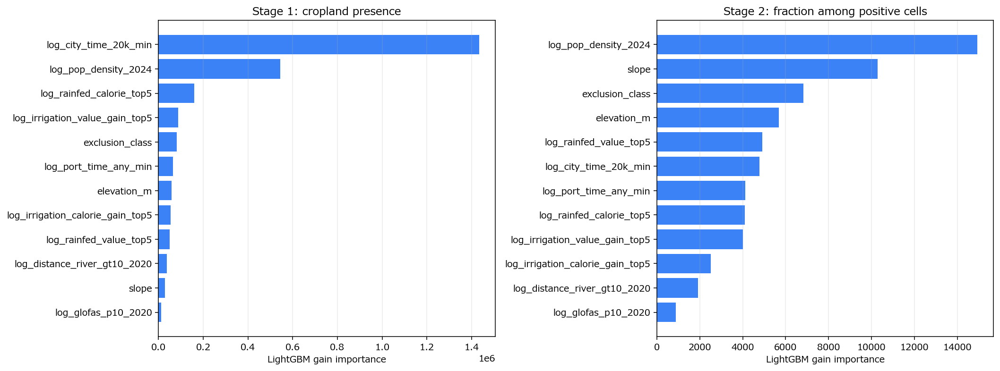

In [ ]:
def importance_frame(model, model_name: str) -> pd.DataFrame:
    booster = model.booster_
    return pd.DataFrame({
        "feature": booster.feature_name(),
        "gain": booster.feature_importance(importance_type="gain"),
        "split": booster.feature_importance(importance_type="split"),
        "model": model_name,
    }).sort_values("gain", ascending=False)

imp_clf = importance_frame(clf, "presence classifier")
imp_reg = importance_frame(reg, "fraction regressor")
print("Presence classifier importance")
print(imp_clf[["feature", "gain", "split"]].round(2).to_string(index=False))
print("\nPositive fraction regressor importance")
print(imp_reg[["feature", "gain", "split"]].round(2).to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(15, 5.5), constrained_layout=True)
for ax, imp, title in [
    (axes[0], imp_clf, "Stage 1: cropland presence"),
    (axes[1], imp_reg, "Stage 2: fraction among positive cells"),
]:
    plot_df = imp.sort_values("gain", ascending=True).tail(12)
    ax.barh(plot_df["feature"], plot_df["gain"], color="#3b82f6")
    ax.set_title(title)
    ax.set_xlabel("LightGBM gain importance")
    ax.grid(axis="x", alpha=0.25)
plt.show()

## 5. 主要変数の関係を見る

下の図は、テストデータを各変数の分位点でbinningし、観測値とモデル予測の平均を重ねたものです。Partial dependence ではなく、まず実データ上の関係確認です。

横軸は各binの中央値です。`log_*` 変数は `log(1 + 元の値)` なので、軸ラベルに「元の値の単位」も明記しています。

                       feature            x_axis_unit raw_unit                                                                    definition
        log_rainfed_value_top5        log(1 + USD/ha)   USD/ha top-5 mean of rainfed GAEZ climate potential kg/ha / 1000 * FAOSTAT USD/tonne
log_irrigation_value_gain_top5        log(1 + USD/ha)   USD/ha       max(irrigated value potential - rainfed value potential, 0), top-5 mean
  log_distance_river_gt10_2020            log(1 + km)       km    distance to nearest 5-min cell where GloFAS annual p10 discharge > 10 m3/s
           log_glofas_p10_2020          log(1 + m3/s)     m3/s                 GloFAS 2020 annual p10 river discharge, max within 5-min cell
         log_city_time_20k_min       log(1 + minutes)  minutes                             travel time to nearest city with population >=20k
                         slope GAEZ slope class, 0-10    class                                     GAEZ slope class aggregated to 5-min grid


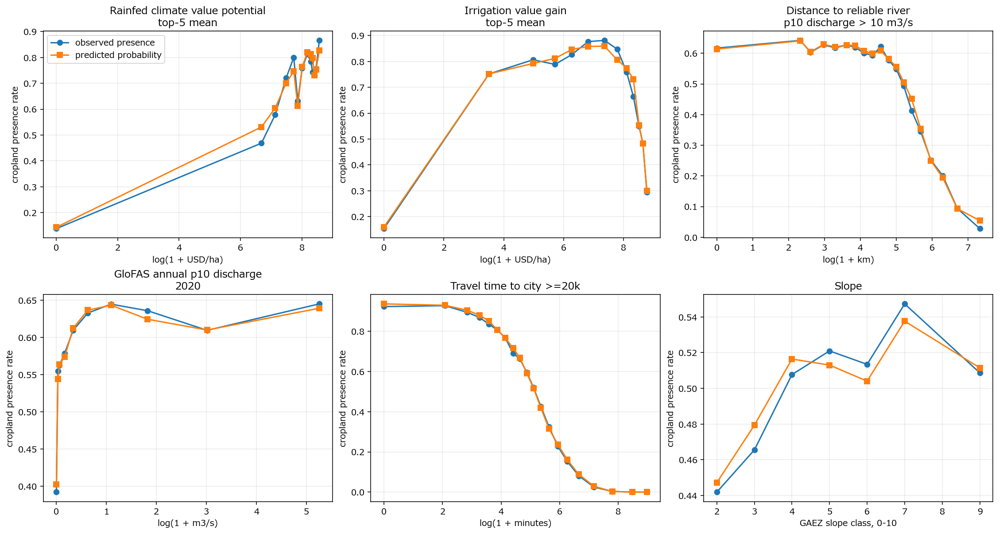

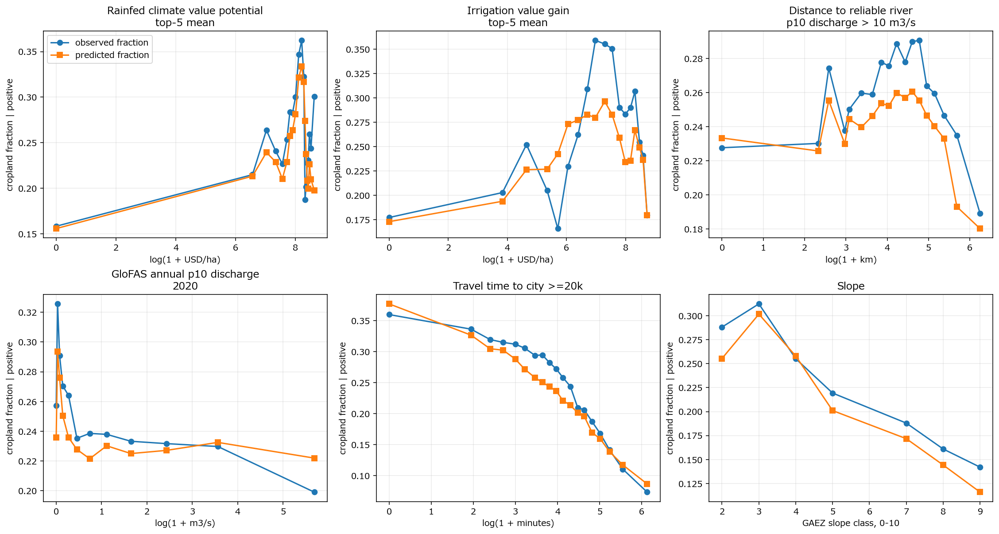

In [ ]:
def binned_curve(df: pd.DataFrame, x_col: str, y_col: str, pred_col: str, q: int = 20) -> pd.DataFrame:
    work = df[[x_col, y_col, pred_col]].replace([np.inf, -np.inf], np.nan).dropna().copy()
    if work[x_col].nunique() < 4:
        return pd.DataFrame()
    work["bin"] = pd.qcut(work[x_col], q=min(q, work[x_col].nunique()), duplicates="drop")
    out = work.groupby("bin", observed=True).agg(
        x_median=(x_col, "median"),
        observed=(y_col, "mean"),
        predicted=(pred_col, "mean"),
        n=(y_col, "size"),
    ).reset_index(drop=True)
    return out

plot_specs = [
    ("log_rainfed_value_top5", "Rainfed climate value potential\ntop-5 mean", "ln(1 + USD/ha)"),
    ("log_irrigation_value_gain_top5", "Irrigation value gain\ntop-5 mean", "ln(1 + USD/ha)"),
    ("log_distance_river_gt10_2020", "Distance to reliable river\np10 discharge > 10 m3/s", "ln(1 + km)"),
    ("log_glofas_p10_2020", "GloFAS annual p10 discharge\n2020", "ln(1 + m3/s)"),
    ("log_city_time_20k_min", "Travel time to city >=20k", "ln(1 + minutes)"),
    ("slope", "Slope", "GAEZ slope class, 0-10"),
]

unit_table = pd.DataFrame([
    {"feature": "log_rainfed_value_top5", "x_axis_unit": "ln(1 + USD/ha)", "raw_unit": "USD/ha", "definition": "top-5 mean of rainfed GAEZ climate potential kg/ha / 1000 * FAOSTAT USD/tonne"},
    {"feature": "log_irrigation_value_gain_top5", "x_axis_unit": "ln(1 + USD/ha)", "raw_unit": "USD/ha", "definition": "max(irrigated value potential - rainfed value potential, 0), top-5 mean"},
    {"feature": "log_distance_river_gt10_2020", "x_axis_unit": "ln(1 + km)", "raw_unit": "km", "definition": "distance to nearest 5-min cell where GloFAS annual p10 discharge > 10 m3/s"},
    {"feature": "log_glofas_p10_2020", "x_axis_unit": "ln(1 + m3/s)", "raw_unit": "m3/s", "definition": "GloFAS 2020 annual p10 river discharge, max within 5-min cell"},
    {"feature": "log_city_time_20k_min", "x_axis_unit": "ln(1 + minutes)", "raw_unit": "minutes", "definition": "travel time to nearest city with population >=20k"},
    {"feature": "slope", "x_axis_unit": "GAEZ slope class, 0-10", "raw_unit": "class", "definition": "GAEZ slope class aggregated to 5-min grid"},
])
print(unit_table.to_string(index=False))

test_plot = test.copy()
test_plot["pred_presence_prob"] = proba_test
pos_plot = positive_test.copy()
pos_plot["pred_fraction"] = reg_pred

fig, axes = plt.subplots(2, 3, figsize=(16, 8.5), constrained_layout=True)
axes = axes.ravel()
for ax, (x_col, title, xlabel) in zip(axes, plot_specs):
    curve = binned_curve(test_plot, x_col, "presence", "pred_presence_prob", q=20)
    if curve.empty:
        ax.set_axis_off()
        continue
    ax.plot(curve["x_median"], curve["observed"], marker="o", linewidth=1.6, label="observed presence")
    ax.plot(curve["x_median"], curve["predicted"], marker="s", linewidth=1.6, label="predicted probability")
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel("cropland presence rate")
    ax.grid(alpha=0.25)
axes[0].legend(loc="best")
plt.show()

fig, axes = plt.subplots(2, 3, figsize=(16, 8.5), constrained_layout=True)
axes = axes.ravel()
for ax, (x_col, title, xlabel) in zip(axes, plot_specs):
    curve = binned_curve(pos_plot, x_col, "cropland_fraction", "pred_fraction", q=20)
    if curve.empty:
        ax.set_axis_off()
        continue
    ax.plot(curve["x_median"], curve["observed"], marker="o", linewidth=1.6, label="observed fraction")
    ax.plot(curve["x_median"], curve["predicted"], marker="s", linewidth=1.6, label="predicted fraction")
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel("cropland fraction | positive")
    ax.grid(alpha=0.25)
axes[0].legend(loc="best")
plt.show()

## 6. 空間的な当たり外れをサンプルで確認

点はテストサンプルです。全球フル予測ではなく、まず空間的にどこで外れているかを粗く見ます。

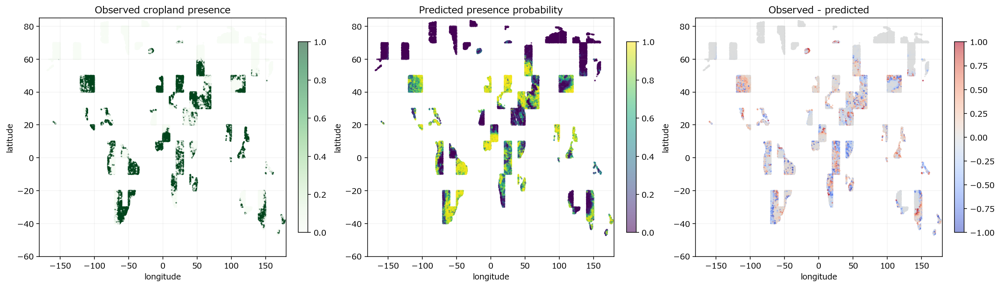

In [ ]:
map_sample = test.copy()
map_sample["pred_presence_prob"] = proba_test
map_sample["presence_error"] = map_sample["presence"] - map_sample["pred_presence_prob"]

fig, axes = plt.subplots(1, 3, figsize=(17, 4.8), constrained_layout=True)
sc0 = axes[0].scatter(map_sample["lon"], map_sample["lat"], c=map_sample["presence"], s=1, cmap="Greens", alpha=0.55)
axes[0].set_title("Observed cropland presence")
fig.colorbar(sc0, ax=axes[0], shrink=0.8)

sc1 = axes[1].scatter(map_sample["lon"], map_sample["lat"], c=map_sample["pred_presence_prob"], s=1, cmap="viridis", alpha=0.55, vmin=0, vmax=1)
axes[1].set_title("Predicted presence probability")
fig.colorbar(sc1, ax=axes[1], shrink=0.8)

sc2 = axes[2].scatter(map_sample["lon"], map_sample["lat"], c=map_sample["presence_error"], s=1, cmap="coolwarm", alpha=0.55, vmin=-1, vmax=1)
axes[2].set_title("Observed - predicted")
fig.colorbar(sc2, ax=axes[2], shrink=0.8)

for ax in axes:
    ax.set_xlim(-180, 180)
    ax.set_ylim(-60, 85)
    ax.set_xlabel("longitude")
    ax.set_ylabel("latitude")
    ax.grid(alpha=0.15)
plt.show()

## 7. Full-grid prediction and residual map

The classifier was trained on a balanced sample, so raw probabilities are too high for global maps. This cell corrects the probability back to the observed land-cell prevalence, then uses: corrected presence probability x conditional cropland fraction.

classifier training prior: 0.5041
full-grid target prior:    0.3659
processed 2,215,635 / 2,215,635 land cells
invalid feature rows skipped: 0
actual_cropland_area_million_km2  predicted_cropland_area_million_km2  observed_minus_predicted_million_km2  area_weighted_mae_fraction
                         15.7931                              15.6365                                0.1566                      0.0605


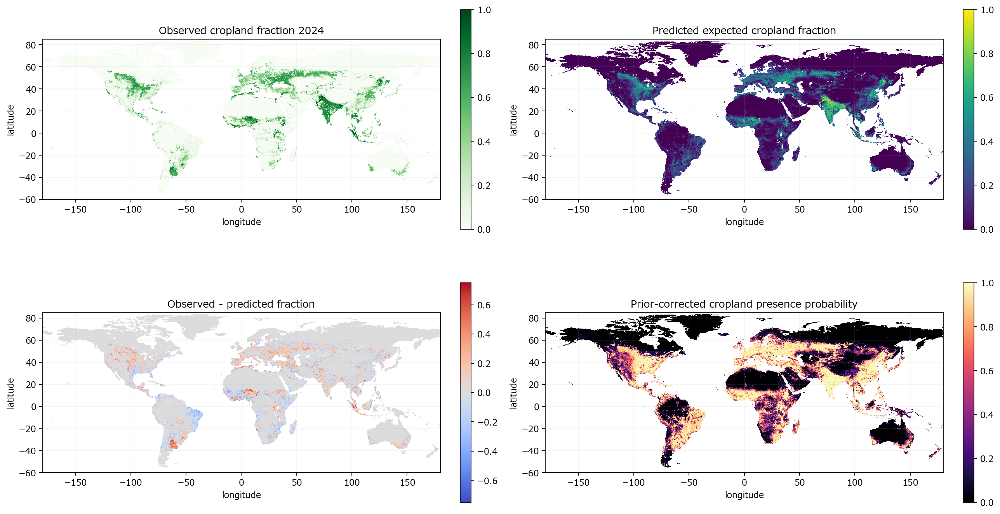

In [ ]:
PRED_DIR = GAEZ_DIR / "CroplandRegression" / "predictions"
PRED_DIR.mkdir(parents=True, exist_ok=True)

# The classifier was trained on a deliberately balanced sample, so its raw probability
# has the sample prior baked in. For full-grid maps, correct it back to the observed
# land-cell prevalence before multiplying by the conditional fraction model.
MODEL_PRIOR = float(y_train.mean())
TARGET_PRIOR = float(presence.sum() / land_mask.sum())
print(f"classifier training prior: {MODEL_PRIOR:.4f}")
print(f"full-grid target prior:    {TARGET_PRIOR:.4f}")


def adjust_probability_prior_shift(probability, sample_prior: float, target_prior: float, eps: float = 1e-6):
    probability = np.clip(np.asarray(probability, dtype=np.float64), eps, 1 - eps)
    sample_prior = float(np.clip(sample_prior, eps, 1 - eps))
    target_prior = float(np.clip(target_prior, eps, 1 - eps))
    odds = probability / (1 - probability)
    odds *= (target_prior / (1 - target_prior)) / (sample_prior / (1 - sample_prior))
    return (odds / (1 + odds)).astype(np.float32)


def feature_frame_for_flat_indices(flat_indices: np.ndarray) -> pd.DataFrame:
    row_idx, col_idx = np.unravel_index(flat_indices, SHAPE)
    rainfed_value = np.asarray(rainfed_value_top5[row_idx, col_idx], dtype=np.float32)
    irrigated_value = np.asarray(irrigated_value_top5[row_idx, col_idx], dtype=np.float32)
    rainfed_calorie = np.asarray(rainfed_calorie_top5[row_idx, col_idx], dtype=np.float32)
    irrigated_calorie = np.asarray(irrigated_calorie_top5[row_idx, col_idx], dtype=np.float32)
    return pd.DataFrame({
        "elevation_m": np.asarray(elevation_m[row_idx, col_idx], dtype=np.float32),
        "slope": np.asarray(slope[row_idx, col_idx], dtype=np.float32),
        "exclusion_class": np.nan_to_num(np.asarray(exclusion[row_idx, col_idx]), nan=-1).astype(np.int16),
        "log_pop_density_2024": safe_log1p(pop_density_2024[row_idx, col_idx]),
        "log_city_time_20k_min": safe_log1p(city_time_20k_min[row_idx, col_idx]),
        "log_port_time_any_min": safe_log1p(port_time_any_min[row_idx, col_idx]),
        "log_glofas_p10_2020": safe_log1p(glofas_p10[row_idx, col_idx]),
        "log_distance_river_gt10_2020": safe_log1p(distance_river_gt10[row_idx, col_idx]),
        "log_rainfed_value_top5": safe_log1p(rainfed_value),
        "log_rainfed_calorie_top5": safe_log1p(rainfed_calorie),
        "log_irrigation_value_gain_top5": safe_log1p(np.maximum(irrigated_value - rainfed_value, 0)),
        "log_irrigation_calorie_gain_top5": safe_log1p(np.maximum(irrigated_calorie - rainfed_calorie, 0)),
    })


def predict_full_grid(chunk_size: int = 250_000, overwrite: bool = False):
    paths = {
        "presence_prob_raw": PRED_DIR / "cropland_presence_probability_raw_balanced_lgbm_2024.npy",
        "presence_prob_calibrated": PRED_DIR / "cropland_presence_probability_prior_corrected_lgbm_2024.npy",
        "fraction_positive": PRED_DIR / "cropland_fraction_positive_conditional_lgbm_2024.npy",
        "fraction_expected": PRED_DIR / "cropland_fraction_expected_lgbm_2024.npy",
        "residual": PRED_DIR / "cropland_fraction_residual_observed_minus_predicted_lgbm_2024.npy",
    }
    if (not overwrite) and all(path.exists() for path in paths.values()):
        print("load full-grid predictions from cache")
        return {name: np.load(path, mmap_mode="r") for name, path in paths.items()}

    flat_land = np.flatnonzero(land_mask.ravel())
    outputs = {name: np.full(SHAPE, np.nan, dtype=np.float32) for name in paths}
    out_flat = {name: array.ravel() for name, array in outputs.items()}
    processed = 0
    skipped = 0

    for start in range(0, len(flat_land), chunk_size):
        stop = min(start + chunk_size, len(flat_land))
        flat_idx = flat_land[start:stop]
        X_chunk = feature_frame_for_flat_indices(flat_idx).replace([np.inf, -np.inf], np.nan)
        valid = X_chunk[feature_cols].notna().all(axis=1).to_numpy()
        skipped += int((~valid).sum())
        if valid.any():
            valid_flat = flat_idx[valid]
            X_valid = X_chunk.loc[valid, feature_cols]
            prob_raw = clf.predict_proba(X_valid)[:, 1]
            prob_cal = adjust_probability_prior_shift(prob_raw, MODEL_PRIOR, TARGET_PRIOR)
            frac_pos = np.clip(reg.predict(X_valid), 0, 1).astype(np.float32)
            expected = (prob_cal * frac_pos).astype(np.float32)
            out_flat["presence_prob_raw"][valid_flat] = prob_raw.astype(np.float32)
            out_flat["presence_prob_calibrated"][valid_flat] = prob_cal
            out_flat["fraction_positive"][valid_flat] = frac_pos
            out_flat["fraction_expected"][valid_flat] = expected
        processed = stop
        if processed % (chunk_size * 5) == 0 or processed == len(flat_land):
            print(f"processed {processed:,} / {len(flat_land):,} land cells")

    outputs["residual"] = (cropland_2024.astype(np.float32) - outputs["fraction_expected"]).astype(np.float32)
    print(f"invalid feature rows skipped: {skipped:,}")

    for name, path in paths.items():
        np.save(path, outputs[name].astype(np.float32, copy=False))
        print("saved", path)
    return outputs


full_pred = predict_full_grid(chunk_size=250_000, overwrite=False)
pred_presence_calibrated = full_pred["presence_prob_calibrated"]
pred_fraction_positive = full_pred["fraction_positive"]
pred_fraction_expected = full_pred["fraction_expected"]
residual_fraction = full_pred["residual"]

cell_area_km2 = np.load(CROPLAND_DIR / "grid_area_km2.npy", mmap_mode="r")
valid_eval = land_mask & np.isfinite(pred_fraction_expected) & np.isfinite(cell_area_km2)
actual_area_km2 = float(np.nansum(cropland_2024[valid_eval] * cell_area_km2[valid_eval]))
pred_area_km2 = float(np.nansum(pred_fraction_expected[valid_eval] * cell_area_km2[valid_eval]))
area_weighted_mae = float(np.nansum(np.abs(residual_fraction[valid_eval]) * cell_area_km2[valid_eval]) / np.nansum(cell_area_km2[valid_eval]))
summary_full_grid = pd.DataFrame([{
    "actual_cropland_area_million_km2": actual_area_km2 / 1e6,
    "predicted_cropland_area_million_km2": pred_area_km2 / 1e6,
    "observed_minus_predicted_million_km2": (actual_area_km2 - pred_area_km2) / 1e6,
    "area_weighted_mae_fraction": area_weighted_mae,
}])
print(summary_full_grid.round(4).to_string(index=False))


def imshow_global(ax, array, title: str, cmap: str, vmin=None, vmax=None, step: int = 2):
    plot_array = np.asarray(array[::step, ::step], dtype=np.float32)
    image = ax.imshow(
        plot_array,
        extent=[float(lon.min()), float(lon.max()), float(lat.min()), float(lat.max())],
        origin="upper",
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        interpolation="nearest",
    )
    ax.set_title(title)
    ax.set_xlim(-180, 180)
    ax.set_ylim(-60, 85)
    ax.set_xlabel("longitude")
    ax.set_ylabel("latitude")
    ax.grid(alpha=0.12)
    return image

fig, axes = plt.subplots(2, 2, figsize=(16, 8.8), constrained_layout=True)
img = imshow_global(axes[0, 0], cropland_2024, "Observed cropland fraction 2024", "Greens", 0, 1)
fig.colorbar(img, ax=axes[0, 0], shrink=0.82)
img = imshow_global(axes[0, 1], pred_fraction_expected, "Predicted expected cropland fraction", "viridis", 0, 1)
fig.colorbar(img, ax=axes[0, 1], shrink=0.82)
img = imshow_global(axes[1, 0], residual_fraction, "Observed - predicted fraction", "coolwarm", -0.75, 0.75)
fig.colorbar(img, ax=axes[1, 0], shrink=0.82)
img = imshow_global(axes[1, 1], pred_presence_calibrated, "Prior-corrected cropland presence probability", "magma", 0, 1)
fig.colorbar(img, ax=axes[1, 1], shrink=0.82)
plt.show()

## 8. Country and region aggregation

Observed and predicted cropland fractions are multiplied by grid-cell area, then aggregated with Natural Earth 110m country boundaries. Positive residual means observed cropland area is larger than predicted.

saved country_cropland_actual_vs_predicted_lgbm_2024.csv
saved region_cropland_actual_vs_predicted_lgbm_2024.csv
Largest country-level absolute residuals; positive residual means observed cropland is larger than predicted.
Top residual countries include USA, Brazil, China, Russia, Argentina, India, Indonesia, Australia, Canada, and Nigeria.


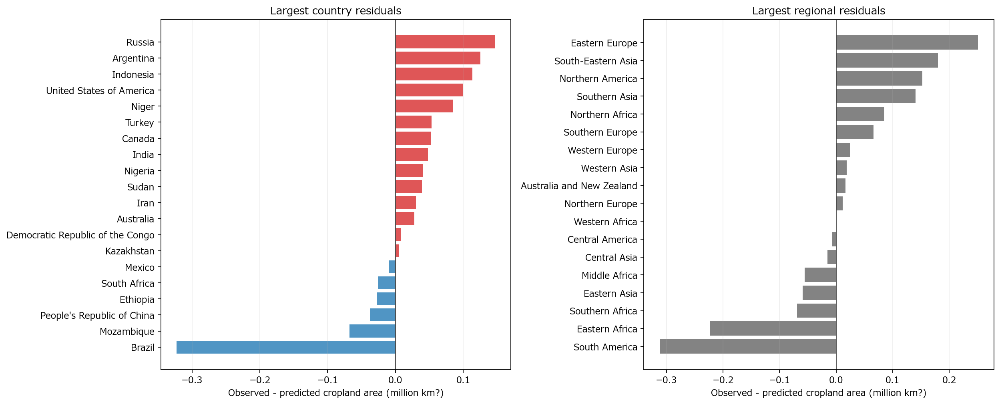

In [ ]:
from rasterio.features import rasterize
from rasterio.transform import from_origin

COUNTRY_GEOJSON = ROOT / "ne_110m_admin_0_countries.geojson"
COUNTRY_GRID_PATH = FEATURE_CACHE / "natural_earth_110m_country_id_5min.npy"
COUNTRY_LOOKUP_PATH = PRED_DIR / "natural_earth_110m_country_lookup.csv"
COUNTRY_SUMMARY_PATH = PRED_DIR / "country_cropland_actual_vs_predicted_lgbm_2024.csv"
REGION_SUMMARY_PATH = PRED_DIR / "region_cropland_actual_vs_predicted_lgbm_2024.csv"


def country_code_from_props(props: dict) -> str:
    for key in ("ISO_A3", "ADM0_A3", "SOV_A3"):
        value = str(props.get(key, "")).strip()
        if value and value != "-99":
            return value
    return str(props.get("NAME", "UNK"))[:3].upper()


def build_country_grid():
    with COUNTRY_GEOJSON.open("r", encoding="utf-8") as f:
        geojson = json.load(f)
    records = []
    shapes = []
    for country_id, feature in enumerate(geojson["features"], start=1):
        props = feature.get("properties", {})
        records.append({
            "country_id": country_id,
            "iso3": country_code_from_props(props),
            "country": props.get("NAME_EN") or props.get("NAME") or props.get("ADMIN"),
            "admin": props.get("ADMIN"),
            "continent": props.get("CONTINENT"),
            "region_un": props.get("REGION_UN"),
            "subregion": props.get("SUBREGION"),
        })
        shapes.append((feature["geometry"], country_id))
    transform = from_origin(-180.0, 90.0, 360.0 / WIDTH, 180.0 / HEIGHT)
    country_grid = rasterize(
        shapes,
        out_shape=SHAPE,
        fill=0,
        transform=transform,
        dtype="uint16",
        all_touched=False,
    )
    np.save(COUNTRY_GRID_PATH, country_grid)
    lookup = pd.DataFrame(records)
    lookup.to_csv(COUNTRY_LOOKUP_PATH, index=False, encoding="utf-8-sig")
    return country_grid, lookup


if COUNTRY_GRID_PATH.exists() and COUNTRY_LOOKUP_PATH.exists():
    country_grid = np.load(COUNTRY_GRID_PATH, mmap_mode="r")
    country_lookup = pd.read_csv(COUNTRY_LOOKUP_PATH)
    print("load country grid from cache")
else:
    country_grid, country_lookup = build_country_grid()
    print("built country grid")

country_flat = np.asarray(country_grid).ravel()
area_flat = np.asarray(cell_area_km2).ravel()
actual_flat = np.asarray(cropland_2024).ravel()
pred_flat = np.asarray(pred_fraction_expected).ravel()
resid_flat = np.asarray(residual_fraction).ravel()
valid_country = (
    (country_flat > 0)
    & np.isfinite(area_flat)
    & np.isfinite(actual_flat)
    & np.isfinite(pred_flat)
    & np.isfinite(resid_flat)
)
max_country_id = int(country_lookup["country_id"].max())

actual_area = np.bincount(country_flat[valid_country], weights=actual_flat[valid_country] * area_flat[valid_country], minlength=max_country_id + 1)
pred_area = np.bincount(country_flat[valid_country], weights=pred_flat[valid_country] * area_flat[valid_country], minlength=max_country_id + 1)
land_area = np.bincount(country_flat[valid_country], weights=area_flat[valid_country], minlength=max_country_id + 1)
abs_error_area = np.bincount(country_flat[valid_country], weights=np.abs(resid_flat[valid_country]) * area_flat[valid_country], minlength=max_country_id + 1)
cell_count = np.bincount(country_flat[valid_country], minlength=max_country_id + 1)

country_summary = country_lookup.copy()
ids = country_summary["country_id"].to_numpy(dtype=int)
country_summary["land_area_km2_in_grid"] = land_area[ids]
country_summary["actual_cropland_area_km2"] = actual_area[ids]
country_summary["predicted_cropland_area_km2"] = pred_area[ids]
country_summary["residual_area_km2_observed_minus_predicted"] = actual_area[ids] - pred_area[ids]
country_summary["absolute_error_area_km2"] = abs_error_area[ids]
country_summary["actual_cropland_share"] = country_summary["actual_cropland_area_km2"] / country_summary["land_area_km2_in_grid"].replace(0, np.nan)
country_summary["predicted_cropland_share"] = country_summary["predicted_cropland_area_km2"] / country_summary["land_area_km2_in_grid"].replace(0, np.nan)
country_summary["cell_count"] = cell_count[ids]
country_summary = country_summary.replace([np.inf, -np.inf], np.nan).sort_values("absolute_error_area_km2", ascending=False)
country_summary.to_csv(COUNTRY_SUMMARY_PATH, index=False, encoding="utf-8-sig")

region_summary = (
    country_summary.dropna(subset=["continent"])
    .groupby(["continent", "region_un", "subregion"], dropna=False, as_index=False)
    .agg(
        country_count=("country_id", "nunique"),
        land_area_km2_in_grid=("land_area_km2_in_grid", "sum"),
        actual_cropland_area_km2=("actual_cropland_area_km2", "sum"),
        predicted_cropland_area_km2=("predicted_cropland_area_km2", "sum"),
        residual_area_km2_observed_minus_predicted=("residual_area_km2_observed_minus_predicted", "sum"),
        absolute_error_area_km2=("absolute_error_area_km2", "sum"),
    )
)
region_summary["actual_cropland_share"] = region_summary["actual_cropland_area_km2"] / region_summary["land_area_km2_in_grid"].replace(0, np.nan)
region_summary["predicted_cropland_share"] = region_summary["predicted_cropland_area_km2"] / region_summary["land_area_km2_in_grid"].replace(0, np.nan)
region_summary = region_summary.sort_values("absolute_error_area_km2", ascending=False)
region_summary.to_csv(REGION_SUMMARY_PATH, index=False, encoding="utf-8-sig")

print("saved", COUNTRY_SUMMARY_PATH)
print("saved", REGION_SUMMARY_PATH)
print("\nLargest country-level absolute residuals; positive residual means observed cropland is larger than predicted.")
display_cols = [
    "iso3", "country", "continent",
    "actual_cropland_area_km2", "predicted_cropland_area_km2",
    "residual_area_km2_observed_minus_predicted", "actual_cropland_share", "predicted_cropland_share",
]
print(country_summary[display_cols].head(20).round(4).to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(15.5, 6.2), constrained_layout=True)
plot_country = country_summary.head(20).copy().sort_values("residual_area_km2_observed_minus_predicted")
bar_values = plot_country["residual_area_km2_observed_minus_predicted"] / 1e6
bar_colors = np.where(bar_values >= 0, "tab:red", "tab:blue")
axes[0].barh(plot_country["country"], bar_values, color=bar_colors, alpha=0.78)
axes[0].axvline(0, color="0.25", linewidth=0.8)
axes[0].set_xlabel("Observed - predicted cropland area (million km^2)")
axes[0].set_title("Largest country residuals")
axes[0].grid(axis="x", alpha=0.2)

plot_region = region_summary.head(18).copy().sort_values("residual_area_km2_observed_minus_predicted")
region_labels = plot_region["subregion"].fillna(plot_region["continent"])
axes[1].barh(region_labels, plot_region["residual_area_km2_observed_minus_predicted"] / 1e6, color="0.35", alpha=0.75)
axes[1].axvline(0, color="0.25", linewidth=0.8)
axes[1].set_xlabel("Observed - predicted cropland area (million km^2)")
axes[1].set_title("Largest regional residuals")
axes[1].grid(axis="x", alpha=0.2)
plt.show()

## 9. ALE diagnostics

Gain importance says which variables the model used, but not the direction. 1D ALE shows how each main variable moves the combined predicted cropland fraction inside this predictive model. This is not a causal effect.

Combined normalized gain importance: city access and population density are the largest combined drivers, followed by slope, exclusion class, rainfed calorie potential, and elevation.
ALE is a model diagnostic, not a causal estimate.


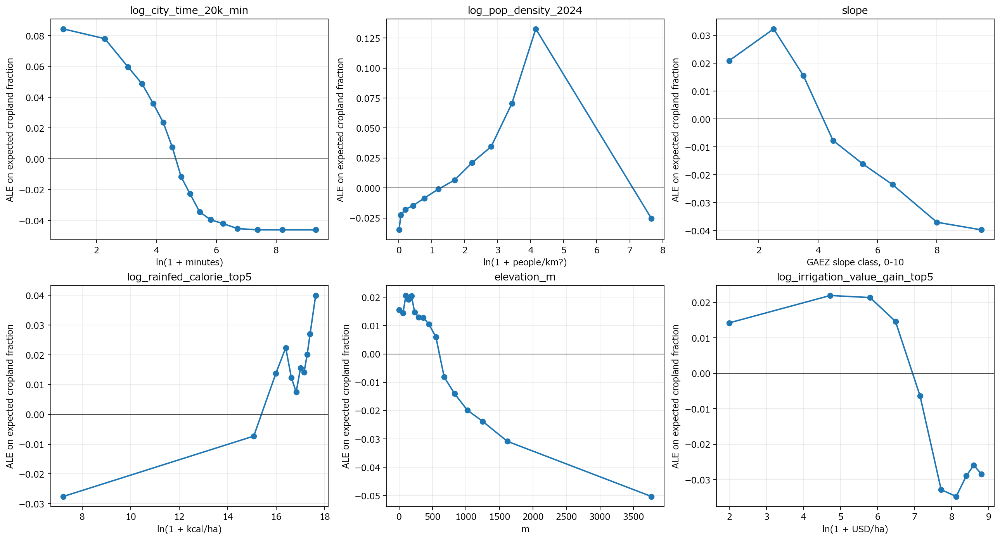

In [ ]:
# 1D ALE for the combined prediction: prior-corrected presence probability x positive-cell fraction.
# This is still descriptive/predictive, not causal.
feature_unit_labels = {
    "elevation_m": "m",
    "slope": "GAEZ slope class, 0-10",
    "log_pop_density_2024": "ln(1 + people/km^2)",
    "log_city_time_20k_min": "ln(1 + minutes)",
    "log_port_time_any_min": "ln(1 + minutes)",
    "log_glofas_p10_2020": "ln(1 + m^3/s)",
    "log_distance_river_gt10_2020": "ln(1 + km)",
    "log_rainfed_value_top5": "ln(1 + USD/ha)",
    "log_rainfed_calorie_top5": "ln(1 + kcal/ha)",
    "log_irrigation_value_gain_top5": "ln(1 + USD/ha)",
    "log_irrigation_calorie_gain_top5": "ln(1 + kcal/ha)",
}


def normalized_gain(importance_df: pd.DataFrame) -> pd.Series:
    gain = importance_df.set_index("feature")["gain"].astype(float)
    total = gain.sum()
    if total <= 0:
        return gain * 0
    return gain / total

combined_importance = (
    pd.concat([
        normalized_gain(imp_clf).rename("presence_gain_share"),
        normalized_gain(imp_reg).rename("fraction_gain_share"),
    ], axis=1)
    .fillna(0)
)
combined_importance["combined_gain_share_mean"] = combined_importance[["presence_gain_share", "fraction_gain_share"]].mean(axis=1)
combined_importance = combined_importance.sort_values("combined_gain_share_mean", ascending=False)
print("Combined normalized gain importance")
print(combined_importance.round(4).to_string())


def predict_expected_fraction_from_features(X: pd.DataFrame) -> np.ndarray:
    X_model = X[feature_cols]
    probability = clf.predict_proba(X_model)[:, 1]
    probability = adjust_probability_prior_shift(probability, MODEL_PRIOR, TARGET_PRIOR)
    positive_fraction = np.clip(reg.predict(X_model), 0, 1).astype(np.float32)
    return (probability * positive_fraction).astype(np.float32)


def ale_1d(model_frame: pd.DataFrame, feature: str, predict_fn, bins: int = 16, max_rows: int = 35_000, random_state: int = 42) -> pd.DataFrame:
    work = model_frame[feature_cols].replace([np.inf, -np.inf], np.nan).dropna().copy()
    if len(work) > max_rows:
        work = work.sample(max_rows, random_state=random_state)
    x = work[feature].to_numpy(dtype=float)
    x = x[np.isfinite(x)]
    if len(np.unique(x)) < 4:
        return pd.DataFrame()
    edges = np.unique(np.quantile(x, np.linspace(0, 1, bins + 1)))
    if len(edges) < 3:
        return pd.DataFrame()

    effects = []
    x_mid = []
    counts = []
    for bin_idx in range(len(edges) - 1):
        left, right = edges[bin_idx], edges[bin_idx + 1]
        if bin_idx == len(edges) - 2:
            mask = (work[feature] >= left) & (work[feature] <= right)
        else:
            mask = (work[feature] >= left) & (work[feature] < right)
        n = int(mask.sum())
        if n == 0:
            continue
        low = work.loc[mask, feature_cols].copy()
        high = low.copy()
        low[feature] = left
        high[feature] = right
        diff = predict_fn(high) - predict_fn(low)
        effects.append(float(np.mean(diff)))
        x_mid.append(float((left + right) / 2))
        counts.append(n)

    if not effects:
        return pd.DataFrame()
    ale = np.cumsum(np.asarray(effects, dtype=float))
    counts_arr = np.asarray(counts, dtype=float)
    ale = ale - np.average(ale, weights=counts_arr)
    return pd.DataFrame({"x_mid": x_mid, "ale": ale, "n": counts})

# Use the spatial test sample so the plot remains an out-of-sample diagnostic.
ale_features = [feature for feature in combined_importance.index if feature != "exclusion_class" and feature in feature_unit_labels][:6]
ale_curves = {feature: ale_1d(test, feature, predict_expected_fraction_from_features) for feature in ale_features}

fig, axes = plt.subplots(2, 3, figsize=(16, 8.6), constrained_layout=True)
for ax, feature in zip(axes.ravel(), ale_features):
    curve = ale_curves.get(feature, pd.DataFrame())
    if curve.empty:
        ax.set_axis_off()
        continue
    ax.plot(curve["x_mid"], curve["ale"], marker="o", linewidth=1.7)
    ax.axhline(0, color="0.25", linewidth=0.8)
    ax.set_title(feature)
    ax.set_xlabel(feature_unit_labels.get(feature, feature))
    ax.set_ylabel("ALE on expected cropland fraction")
    ax.grid(alpha=0.25)
for ax in axes.ravel()[len(ale_features):]:
    ax.set_axis_off()
plt.show()

if "exclusion_class" in combined_importance.index[:8]:
    exclusion_check = test.copy()
    exclusion_check["pred_expected_fraction"] = predict_expected_fraction_from_features(test[feature_cols])
    exclusion_by_class = (
        exclusion_check.groupby("exclusion_class", observed=True)
        .agg(
            observed_fraction=("cropland_fraction", "mean"),
            predicted_expected_fraction=("pred_expected_fraction", "mean"),
            n=("cropland_fraction", "size"),
        )
        .reset_index()
        .sort_values("exclusion_class")
    )
    print("\nExclusion class diagnostic")
    print(exclusion_by_class.round(4).to_string(index=False))

## 10. Local cropland-function regimes

This section tests the hypothesis that the cropland function differs by place. It estimates separate local two-stage models in 20-degree spatial blocks, converts each local function into a signature vector, clusters those signatures, and maps the resulting regimes.

local function units used: 52
skipped units: 46
selected k: 5, silhouette: 0.130
saved C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\regimes\cropland_local_function_signatures_20deg.csv
saved C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\regimes\cropland_regime_cluster_profiles_20deg.csv

Silhouette by k
 k  silhouette
 3       0.103
 4       0.113
 5       0.130
 6       0.121
 7       0.110

Regime profiles
 regime  unit_count  land_area_million_km2  mean_actual_cropland_share  mean_predicted_cropland_share  residual_area_million_km2_observed_minus_predicted dominant_presence_driver dominant_fraction_driver
      1           8                18.2186                      0.0292                         0.0416                                             -0.2243            market_access        climate_potential
      2           9                19.6868                      0.1288                         0.1184                                          

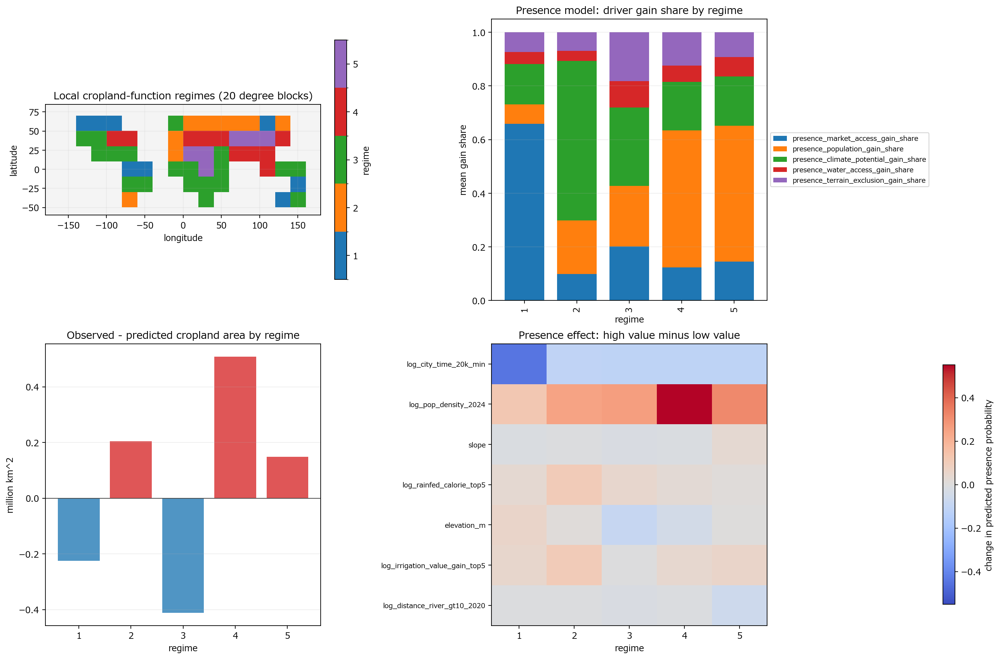

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from matplotlib.colors import BoundaryNorm, ListedColormap, TwoSlopeNorm

REGIME_DIR = GAEZ_DIR / "CroplandRegression" / "regimes"
REGIME_FIG_DIR = REGIME_DIR / "figures"
REGIME_DIR.mkdir(parents=True, exist_ok=True)
REGIME_FIG_DIR.mkdir(parents=True, exist_ok=True)

# Start with 20-degree blocks. 10-degree blocks are possible, but many blocks have
# too few sampled observations for stable local models.
REGIME_BLOCK_DEG = 20
N_LAT_REGIME = int(np.ceil(180 / REGIME_BLOCK_DEG))
N_LON_REGIME = int(np.ceil(360 / REGIME_BLOCK_DEG))
MIN_LOCAL_TOTAL_ROWS = 500
MIN_LOCAL_CLASS_ROWS = 120
MIN_LOCAL_FRACTION_ROWS = 200
MAX_LOCAL_CLASS_ROWS = 2_500
LOCAL_MODEL_RANDOM_SEED = RANDOM_SEED

FEATURE_GROUPS = {
    "market_access": ["log_city_time_20k_min", "log_port_time_any_min"],
    "population": ["log_pop_density_2024"],
    "climate_potential": [
        "log_rainfed_value_top5",
        "log_rainfed_calorie_top5",
        "log_irrigation_value_gain_top5",
        "log_irrigation_calorie_gain_top5",
    ],
    "water_access": ["log_glofas_p10_2020", "log_distance_river_gt10_2020"],
    "terrain_exclusion": ["elevation_m", "slope", "exclusion_class"],
}

EFFECT_FEATURES = [
    "log_city_time_20k_min",
    "log_pop_density_2024",
    "slope",
    "log_rainfed_calorie_top5",
    "elevation_m",
    "log_irrigation_value_gain_top5",
    "log_distance_river_gt10_2020",
]


def regime_unit_from_lat_lon(lat_values, lon_values):
    lat_arr = np.asarray(lat_values, dtype=float)
    lon_arr = np.asarray(lon_values, dtype=float)
    lat_bin = np.floor((lat_arr + 90.0) / REGIME_BLOCK_DEG).astype(int)
    lon_bin = np.floor((lon_arr + 180.0) / REGIME_BLOCK_DEG).astype(int)
    lat_bin = np.clip(lat_bin, 0, N_LAT_REGIME - 1)
    lon_bin = np.clip(lon_bin, 0, N_LON_REGIME - 1)
    return lat_bin * N_LON_REGIME + lon_bin, lat_bin, lon_bin


def attach_regime_unit(df: pd.DataFrame) -> pd.DataFrame:
    out = df.copy()
    unit_id, lat_bin, lon_bin = regime_unit_from_lat_lon(out["lat"], out["lon"])
    out["regime_unit_id"] = unit_id.astype(int)
    out["regime_lat_bin"] = lat_bin.astype(int)
    out["regime_lon_bin"] = lon_bin.astype(int)
    out["regime_lat0"] = -90 + out["regime_lat_bin"] * REGIME_BLOCK_DEG
    out["regime_lon0"] = -180 + out["regime_lon_bin"] * REGIME_BLOCK_DEG
    return out


def grouped_gain_share(model, prefix: str) -> dict:
    gains = pd.Series(
        model.booster_.feature_importance(importance_type="gain"),
        index=feature_cols,
        dtype=float,
    )
    total = float(gains.sum())
    out = {}
    for group_name, cols in FEATURE_GROUPS.items():
        value = float(gains.reindex(cols).fillna(0).sum())
        out[f"{prefix}_{group_name}_gain_share"] = value / total if total > 0 else np.nan
    return out


def model_mean_prediction(model, X: pd.DataFrame, kind: str) -> np.ndarray:
    if kind == "classifier":
        return model.predict_proba(X[feature_cols])[:, 1].astype(np.float32)
    if kind == "regressor":
        return np.clip(model.predict(X[feature_cols]), 0, 1).astype(np.float32)
    raise ValueError(kind)


def high_minus_low_effect(model, X: pd.DataFrame, feature: str, kind: str) -> float:
    x = X[feature].replace([np.inf, -np.inf], np.nan).dropna()
    if x.nunique() < 4:
        return np.nan
    low = float(x.quantile(0.20))
    high = float(x.quantile(0.80))
    if not np.isfinite(low) or not np.isfinite(high) or np.isclose(low, high):
        return np.nan
    low_X = X[feature_cols].copy()
    high_X = X[feature_cols].copy()
    low_X[feature] = low
    high_X[feature] = high
    return float(model_mean_prediction(model, high_X, kind).mean() - model_mean_prediction(model, low_X, kind).mean())


def balanced_presence_sample(group: pd.DataFrame, random_state: int) -> pd.DataFrame:
    pos = group[group["presence"].eq(1)]
    neg = group[group["presence"].eq(0)]
    n_per_class = min(len(pos), len(neg), MAX_LOCAL_CLASS_ROWS)
    pos_sample = pos.sample(n_per_class, random_state=random_state) if len(pos) > n_per_class else pos
    neg_sample = neg.sample(n_per_class, random_state=random_state + 1) if len(neg) > n_per_class else neg
    return pd.concat([pos_sample, neg_sample], ignore_index=True).sample(frac=1, random_state=random_state + 2)


def build_regime_unit_area_table() -> pd.DataFrame:
    lat_bins = np.floor((lat + 90.0) / REGIME_BLOCK_DEG).astype(int)
    lon_bins = np.floor((lon + 180.0) / REGIME_BLOCK_DEG).astype(int)
    lat_bins = np.clip(lat_bins, 0, N_LAT_REGIME - 1)
    lon_bins = np.clip(lon_bins, 0, N_LON_REGIME - 1)
    unit_grid = lat_bins[:, None] * N_LON_REGIME + lon_bins[None, :]
    unit_flat = unit_grid.ravel()
    area_flat = np.asarray(cell_area_km2).ravel()
    actual_flat = np.asarray(cropland_2024).ravel()
    pred_flat = np.asarray(pred_fraction_expected).ravel()
    resid_flat = np.asarray(residual_fraction).ravel()
    valid = (
        land_mask.ravel()
        & np.isfinite(area_flat)
        & np.isfinite(actual_flat)
        & np.isfinite(pred_flat)
        & np.isfinite(resid_flat)
    )
    n_units = N_LAT_REGIME * N_LON_REGIME
    land_area = np.bincount(unit_flat[valid], weights=area_flat[valid], minlength=n_units)
    actual_area = np.bincount(unit_flat[valid], weights=actual_flat[valid] * area_flat[valid], minlength=n_units)
    pred_area = np.bincount(unit_flat[valid], weights=pred_flat[valid] * area_flat[valid], minlength=n_units)
    abs_error_area = np.bincount(unit_flat[valid], weights=np.abs(resid_flat[valid]) * area_flat[valid], minlength=n_units)
    out = pd.DataFrame({"regime_unit_id": np.arange(n_units, dtype=int)})
    out["regime_lat_bin"] = out["regime_unit_id"] // N_LON_REGIME
    out["regime_lon_bin"] = out["regime_unit_id"] % N_LON_REGIME
    out["regime_lat0"] = -90 + out["regime_lat_bin"] * REGIME_BLOCK_DEG
    out["regime_lon0"] = -180 + out["regime_lon_bin"] * REGIME_BLOCK_DEG
    out["land_area_km2"] = land_area
    out["actual_cropland_area_km2"] = actual_area
    out["predicted_cropland_area_km2"] = pred_area
    out["residual_area_km2_observed_minus_predicted"] = actual_area - pred_area
    out["absolute_error_area_km2"] = abs_error_area
    out["actual_cropland_share"] = out["actual_cropland_area_km2"] / out["land_area_km2"].replace(0, np.nan)
    out["predicted_cropland_share"] = out["predicted_cropland_area_km2"] / out["land_area_km2"].replace(0, np.nan)
    out["residual_share_observed_minus_predicted"] = out["actual_cropland_share"] - out["predicted_cropland_share"]
    return out


sample_regime = attach_regime_unit(sample)
unit_area_table = build_regime_unit_area_table()
local_records = []
skipped_units = []

for unit_id, group in sample_regime.groupby("regime_unit_id", sort=True):
    n_rows = len(group)
    n_pos = int(group["presence"].sum())
    n_neg = int(n_rows - n_pos)
    if n_rows < MIN_LOCAL_TOTAL_ROWS or n_pos < MIN_LOCAL_CLASS_ROWS or n_neg < MIN_LOCAL_CLASS_ROWS:
        skipped_units.append((unit_id, n_rows, n_pos, n_neg))
        continue

    local_seed = LOCAL_MODEL_RANDOM_SEED + int(unit_id)
    balanced = balanced_presence_sample(group, local_seed).replace([np.inf, -np.inf], np.nan).dropna(subset=feature_cols + ["presence"])
    X_local = balanced[feature_cols]
    y_local = balanced["presence"]
    if y_local.nunique() < 2:
        skipped_units.append((unit_id, n_rows, n_pos, n_neg))
        continue

    local_clf = LGBMClassifier(
        objective="binary",
        n_estimators=160,
        learning_rate=0.05,
        num_leaves=15,
        min_child_samples=35,
        subsample=0.9,
        colsample_bytree=0.9,
        random_state=local_seed,
        n_jobs=1,
        verbose=-1,
    )
    local_clf.fit(X_local, y_local, categorical_feature=["exclusion_class"])
    presence_pred = local_clf.predict_proba(X_local)[:, 1]

    record = {
        "regime_unit_id": int(unit_id),
        "sample_rows": int(n_rows),
        "sample_presence_rows": int(n_pos),
        "sample_absence_rows": int(n_neg),
        "balanced_rows_for_presence_model": int(len(balanced)),
        "local_presence_auc_in_sample": float(roc_auc_score(y_local, presence_pred)),
        "local_sample_presence_share": float(group["presence"].mean()),
        "local_sample_mean_cropland_fraction": float(group["cropland_fraction"].mean()),
    }
    record.update(grouped_gain_share(local_clf, "presence"))
    for feature in EFFECT_FEATURES:
        record[f"presence_effect_high_minus_low__{feature}"] = high_minus_low_effect(local_clf, X_local, feature, "classifier")

    positive = group[group["presence"].eq(1)].replace([np.inf, -np.inf], np.nan).dropna(subset=feature_cols + ["cropland_fraction"])
    if len(positive) >= MIN_LOCAL_FRACTION_ROWS and positive["cropland_fraction"].nunique() >= 10:
        frac_sample = positive.sample(min(len(positive), MAX_LOCAL_CLASS_ROWS * 2), random_state=local_seed + 3)
        local_reg = LGBMRegressor(
            objective="regression",
            n_estimators=180,
            learning_rate=0.045,
            num_leaves=15,
            min_child_samples=35,
            subsample=0.9,
            colsample_bytree=0.9,
            random_state=local_seed + 4,
            n_jobs=1,
            verbose=-1,
        )
        local_reg.fit(frac_sample[feature_cols], frac_sample["cropland_fraction"], categorical_feature=["exclusion_class"])
        frac_pred = np.clip(local_reg.predict(frac_sample[feature_cols]), 0, 1)
        record["fraction_rows_for_local_model"] = int(len(frac_sample))
        record["local_fraction_r2_in_sample"] = float(r2_score(frac_sample["cropland_fraction"], frac_pred))
        record.update(grouped_gain_share(local_reg, "fraction"))
        for feature in EFFECT_FEATURES:
            record[f"fraction_effect_high_minus_low__{feature}"] = high_minus_low_effect(local_reg, frac_sample[feature_cols], feature, "regressor")
    else:
        record["fraction_rows_for_local_model"] = int(len(positive))
        record["local_fraction_r2_in_sample"] = np.nan
        for group_name in FEATURE_GROUPS:
            record[f"fraction_{group_name}_gain_share"] = np.nan
        for feature in EFFECT_FEATURES:
            record[f"fraction_effect_high_minus_low__{feature}"] = np.nan

    local_records.append(record)

local_signature = pd.DataFrame(local_records)
local_signature = local_signature.merge(unit_area_table, on="regime_unit_id", how="left", suffixes=("", "_area"))
local_signature = local_signature.replace([np.inf, -np.inf], np.nan)

presence_gain_cols = [f"presence_{group}_gain_share" for group in FEATURE_GROUPS]
fraction_gain_cols = [f"fraction_{group}_gain_share" for group in FEATURE_GROUPS]
presence_effect_cols = [f"presence_effect_high_minus_low__{feature}" for feature in EFFECT_FEATURES]
fraction_effect_cols = [f"fraction_effect_high_minus_low__{feature}" for feature in EFFECT_FEATURES]
context_cols = [
    "actual_cropland_share",
    "predicted_cropland_share",
    "residual_share_observed_minus_predicted",
    "local_sample_presence_share",
]

cluster_candidate_cols = presence_gain_cols + fraction_gain_cols + presence_effect_cols + fraction_effect_cols + context_cols
cluster_cols = [
    col for col in cluster_candidate_cols
    if col in local_signature.columns and local_signature[col].notna().sum() >= max(8, int(0.60 * len(local_signature)))
]
cluster_input = local_signature[cluster_cols].copy()
cluster_input = cluster_input.apply(lambda col: col.fillna(col.median()), axis=0)
cluster_input = cluster_input.loc[:, cluster_input.std(axis=0) > 1e-9]

scaler = StandardScaler()
Z = scaler.fit_transform(cluster_input)
candidate_ks = list(range(3, min(7, len(local_signature) - 1) + 1))
silhouette_records = []
best_k = 3
best_score = -np.inf
for k in candidate_ks:
    labels = KMeans(n_clusters=k, random_state=RANDOM_SEED, n_init=30).fit_predict(Z)
    score = silhouette_score(Z, labels)
    silhouette_records.append({"k": k, "silhouette": float(score)})
    if score > best_score:
        best_score = score
        best_k = k

kmeans = KMeans(n_clusters=best_k, random_state=RANDOM_SEED, n_init=50)
local_signature["regime"] = kmeans.fit_predict(Z) + 1
silhouette_table = pd.DataFrame(silhouette_records)

regime_group_cols = presence_gain_cols + fraction_gain_cols + presence_effect_cols + fraction_effect_cols
profile_rows = []
for regime, group in local_signature.groupby("regime", sort=True):
    row = {
        "regime": int(regime),
        "unit_count": int(len(group)),
        "land_area_million_km2": float(group["land_area_km2"].sum() / 1e6),
        "actual_cropland_area_million_km2": float(group["actual_cropland_area_km2"].sum() / 1e6),
        "predicted_cropland_area_million_km2": float(group["predicted_cropland_area_km2"].sum() / 1e6),
        "residual_area_million_km2_observed_minus_predicted": float(group["residual_area_km2_observed_minus_predicted"].sum() / 1e6),
        "mean_actual_cropland_share": float(group["actual_cropland_area_km2"].sum() / group["land_area_km2"].sum()),
        "mean_predicted_cropland_share": float(group["predicted_cropland_area_km2"].sum() / group["land_area_km2"].sum()),
        "mean_local_presence_auc_in_sample": float(group["local_presence_auc_in_sample"].mean()),
    }
    for col in regime_group_cols:
        if col in group.columns:
            row[col] = float(group[col].mean())
    presence_means = {name: row.get(f"presence_{name}_gain_share", np.nan) for name in FEATURE_GROUPS}
    fraction_means = {name: row.get(f"fraction_{name}_gain_share", np.nan) for name in FEATURE_GROUPS}
    row["dominant_presence_driver"] = max(presence_means, key=lambda key: -np.inf if pd.isna(presence_means[key]) else presence_means[key])
    row["dominant_fraction_driver"] = max(fraction_means, key=lambda key: -np.inf if pd.isna(fraction_means[key]) else fraction_means[key])
    profile_rows.append(row)

regime_profiles = pd.DataFrame(profile_rows).sort_values("regime")
signature_path = REGIME_DIR / f"cropland_local_function_signatures_{REGIME_BLOCK_DEG}deg.csv"
profile_path = REGIME_DIR / f"cropland_regime_cluster_profiles_{REGIME_BLOCK_DEG}deg.csv"
silhouette_path = REGIME_DIR / f"cropland_regime_silhouette_{REGIME_BLOCK_DEG}deg.csv"
local_signature.to_csv(signature_path, index=False, encoding="utf-8-sig")
regime_profiles.to_csv(profile_path, index=False, encoding="utf-8-sig")
silhouette_table.to_csv(silhouette_path, index=False, encoding="utf-8-sig")

print(f"local function units used: {len(local_signature)}")
print(f"skipped units: {len(skipped_units)}")
print(f"selected k: {best_k}, silhouette: {best_score:.3f}")
print("saved", signature_path)
print("saved", profile_path)
print("\nSilhouette by k")
print(silhouette_table.round(3).to_string(index=False))
print("\nRegime profiles")
profile_print_cols = [
    "regime",
    "unit_count",
    "land_area_million_km2",
    "mean_actual_cropland_share",
    "mean_predicted_cropland_share",
    "residual_area_million_km2_observed_minus_predicted",
    "dominant_presence_driver",
    "dominant_fraction_driver",
]
print(regime_profiles[profile_print_cols].round(4).to_string(index=False))

regime_grid = np.full((N_LAT_REGIME, N_LON_REGIME), np.nan, dtype=float)
for _, row in local_signature.iterrows():
    regime_grid[int(row["regime_lat_bin"]), int(row["regime_lon_bin"])] = row["regime"]

base_colors = list(plt.get_cmap("tab10").colors)
cmap = ListedColormap(base_colors[:best_k])
cmap.set_bad(color="lightgray", alpha=0.25)
norm = BoundaryNorm(np.arange(0.5, best_k + 1.5), cmap.N)

fig, axes = plt.subplots(2, 2, figsize=(16, 10.5), constrained_layout=True)
map_image = axes[0, 0].imshow(
    np.ma.masked_invalid(regime_grid),
    origin="lower",
    extent=[-180, 180, -90, 90],
    cmap=cmap,
    norm=norm,
    interpolation="nearest",
)
axes[0, 0].set_title(f"Local cropland-function regimes ({REGIME_BLOCK_DEG} degree blocks)")
axes[0, 0].set_xlim(-180, 180)
axes[0, 0].set_ylim(-60, 85)
axes[0, 0].set_xlabel("longitude")
axes[0, 0].set_ylabel("latitude")
axes[0, 0].grid(alpha=0.15)
fig.colorbar(map_image, ax=axes[0, 0], ticks=np.arange(1, best_k + 1), shrink=0.85, label="regime")

profile_gain = regime_profiles.set_index("regime")[presence_gain_cols]
profile_gain.plot(kind="bar", stacked=True, ax=axes[0, 1], width=0.75)
axes[0, 1].set_title("Presence model: driver gain share by regime")
axes[0, 1].set_xlabel("regime")
axes[0, 1].set_ylabel("mean gain share")
axes[0, 1].legend(loc="center left", bbox_to_anchor=(1.0, 0.5), fontsize=8)
axes[0, 1].grid(axis="y", alpha=0.2)

residual_bars = regime_profiles.set_index("regime")["residual_area_million_km2_observed_minus_predicted"]
bar_colors = np.where(residual_bars >= 0, "tab:red", "tab:blue")
axes[1, 0].bar(residual_bars.index.astype(str), residual_bars.values, color=bar_colors, alpha=0.78)
axes[1, 0].axhline(0, color="0.25", linewidth=0.8)
axes[1, 0].set_title("Observed - predicted cropland area by regime")
axes[1, 0].set_xlabel("regime")
axes[1, 0].set_ylabel("million km^2")
axes[1, 0].grid(axis="y", alpha=0.2)

effect_profile_cols = [col for col in presence_effect_cols if col in regime_profiles.columns]
effect_labels = [col.replace("presence_effect_high_minus_low__", "") for col in effect_profile_cols]
effect_matrix = regime_profiles.set_index("regime")[effect_profile_cols].T
effect_vmax = float(np.nanmax(np.abs(effect_matrix.to_numpy()))) if effect_matrix.size else 1.0
effect_norm = TwoSlopeNorm(vmin=-effect_vmax, vcenter=0, vmax=effect_vmax)
effect_img = axes[1, 1].imshow(effect_matrix, aspect="auto", cmap="coolwarm", norm=effect_norm)
axes[1, 1].set_title("Presence effect: high value minus low value")
axes[1, 1].set_xlabel("regime")
axes[1, 1].set_xticks(np.arange(len(effect_matrix.columns)))
axes[1, 1].set_xticklabels(effect_matrix.columns)
axes[1, 1].set_yticks(np.arange(len(effect_labels)))
axes[1, 1].set_yticklabels(effect_labels, fontsize=8)
fig.colorbar(effect_img, ax=axes[1, 1], shrink=0.85, label="change in predicted presence probability")
plt.show()

## 11. Regime-specific predictive check

This section asks whether allowing separate functions by regime changes prediction on the existing spatial test split. This is an exploratory check, not a final validation, because the regimes were discovered from the same dataset.

Exploratory regime-specific model check
                      target  test_rows  global_auc  regime_specific_auc  global_average_precision  regime_specific_average_precision  global_rmse  regime_specific_rmse  global_mae  regime_specific_mae  global_r2  regime_specific_r2
           cropland presence      50302      0.9258               0.9239                    0.9324                              0.933          NaN                   NaN         NaN                  NaN        NaN                 NaN
cropland fraction | positive      27645         NaN                  NaN                       NaN                                NaN       0.1862                0.1801      0.1394                0.131     0.3714              0.4119
saved C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\regimes\cropland_global_vs_regime_specific_comparison_20deg.csv
[figure saved] C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\regimes\figures\cropland_regime_cell_23_fig_03.p

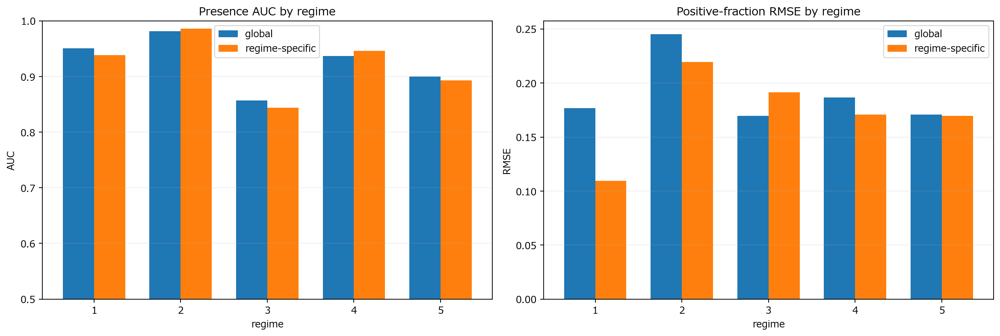

In [ ]:
# Exploratory check: do regime-specific functions predict differently from one global function?
# This is not a final validation because regimes were discovered from the same dataset.
REGIME_LOOKUP = local_signature[["regime_unit_id", "regime"]].copy()


def attach_regime_label(df: pd.DataFrame) -> pd.DataFrame:
    out = attach_regime_unit(df)
    out = out.merge(REGIME_LOOKUP, on="regime_unit_id", how="left")
    out["regime"] = out["regime"].astype("float")
    return out


train_regime = attach_regime_label(train).dropna(subset=["regime"]).copy()
test_regime = attach_regime_label(test).dropna(subset=["regime"]).copy()
train_regime["regime"] = train_regime["regime"].astype(int)
test_regime["regime"] = test_regime["regime"].astype(int)

presence_eval = test_regime.copy()
presence_eval["global_proba"] = clf.predict_proba(presence_eval[feature_cols])[:, 1]
presence_eval["regime_proba"] = np.nan
presence_rows = []

for regime_id, train_group in train_regime.groupby("regime", sort=True):
    test_mask = presence_eval["regime"].eq(regime_id)
    test_group = presence_eval.loc[test_mask]
    if len(train_group) < 500 or train_group["presence"].nunique() < 2 or len(test_group) < 100 or test_group["presence"].nunique() < 2:
        continue
    local_model = LGBMClassifier(
        objective="binary",
        n_estimators=260,
        learning_rate=0.04,
        num_leaves=23,
        min_child_samples=60,
        subsample=0.9,
        colsample_bytree=0.9,
        random_state=RANDOM_SEED + int(regime_id) * 100,
        n_jobs=1,
        verbose=-1,
    )
    local_model.fit(train_group[feature_cols], train_group["presence"], categorical_feature=["exclusion_class"])
    local_prob = local_model.predict_proba(test_group[feature_cols])[:, 1]
    presence_eval.loc[test_mask, "regime_proba"] = local_prob
    presence_rows.append({
        "regime": int(regime_id),
        "test_rows": int(len(test_group)),
        "global_auc": float(roc_auc_score(test_group["presence"], test_group["global_proba"])),
        "regime_specific_auc": float(roc_auc_score(test_group["presence"], local_prob)),
        "global_average_precision": float(average_precision_score(test_group["presence"], test_group["global_proba"])),
        "regime_specific_average_precision": float(average_precision_score(test_group["presence"], local_prob)),
    })

presence_valid = presence_eval.dropna(subset=["regime_proba"])
presence_comparison = {
    "target": "cropland presence",
    "test_rows": int(len(presence_valid)),
    "global_auc": float(roc_auc_score(presence_valid["presence"], presence_valid["global_proba"])),
    "regime_specific_auc": float(roc_auc_score(presence_valid["presence"], presence_valid["regime_proba"])),
    "global_average_precision": float(average_precision_score(presence_valid["presence"], presence_valid["global_proba"])),
    "regime_specific_average_precision": float(average_precision_score(presence_valid["presence"], presence_valid["regime_proba"])),
}

positive_train_regime = train_regime[train_regime["presence"].eq(1)].copy()
positive_test_regime = test_regime[test_regime["presence"].eq(1)].copy()
fraction_eval = positive_test_regime.copy()
fraction_eval["global_fraction_pred"] = np.clip(reg.predict(fraction_eval[feature_cols]), 0, 1)
fraction_eval["regime_fraction_pred"] = np.nan
fraction_rows = []

for regime_id, train_group in positive_train_regime.groupby("regime", sort=True):
    test_mask = fraction_eval["regime"].eq(regime_id)
    test_group = fraction_eval.loc[test_mask]
    if len(train_group) < 400 or len(test_group) < 80 or train_group["cropland_fraction"].nunique() < 10:
        continue
    local_model = LGBMRegressor(
        objective="regression",
        n_estimators=320,
        learning_rate=0.035,
        num_leaves=23,
        min_child_samples=55,
        subsample=0.9,
        colsample_bytree=0.9,
        random_state=RANDOM_SEED + int(regime_id) * 200,
        n_jobs=1,
        verbose=-1,
    )
    local_model.fit(train_group[feature_cols], train_group["cropland_fraction"], categorical_feature=["exclusion_class"])
    local_pred = np.clip(local_model.predict(test_group[feature_cols]), 0, 1)
    fraction_eval.loc[test_mask, "regime_fraction_pred"] = local_pred
    fraction_rows.append({
        "regime": int(regime_id),
        "test_rows": int(len(test_group)),
        "global_rmse": float(math.sqrt(mean_squared_error(test_group["cropland_fraction"], test_group["global_fraction_pred"]))),
        "regime_specific_rmse": float(math.sqrt(mean_squared_error(test_group["cropland_fraction"], local_pred))),
        "global_mae": float(mean_absolute_error(test_group["cropland_fraction"], test_group["global_fraction_pred"])),
        "regime_specific_mae": float(mean_absolute_error(test_group["cropland_fraction"], local_pred)),
        "global_r2": float(r2_score(test_group["cropland_fraction"], test_group["global_fraction_pred"])),
        "regime_specific_r2": float(r2_score(test_group["cropland_fraction"], local_pred)),
    })

fraction_valid = fraction_eval.dropna(subset=["regime_fraction_pred"])
fraction_comparison = {
    "target": "cropland fraction | positive",
    "test_rows": int(len(fraction_valid)),
    "global_rmse": float(math.sqrt(mean_squared_error(fraction_valid["cropland_fraction"], fraction_valid["global_fraction_pred"]))),
    "regime_specific_rmse": float(math.sqrt(mean_squared_error(fraction_valid["cropland_fraction"], fraction_valid["regime_fraction_pred"]))),
    "global_mae": float(mean_absolute_error(fraction_valid["cropland_fraction"], fraction_valid["global_fraction_pred"])),
    "regime_specific_mae": float(mean_absolute_error(fraction_valid["cropland_fraction"], fraction_valid["regime_fraction_pred"])),
    "global_r2": float(r2_score(fraction_valid["cropland_fraction"], fraction_valid["global_fraction_pred"])),
    "regime_specific_r2": float(r2_score(fraction_valid["cropland_fraction"], fraction_valid["regime_fraction_pred"])),
}

regime_presence_eval = pd.DataFrame(presence_rows)
regime_fraction_eval = pd.DataFrame(fraction_rows)
comparison_summary = pd.DataFrame([presence_comparison, fraction_comparison])

comparison_path = REGIME_DIR / f"cropland_global_vs_regime_specific_comparison_{REGIME_BLOCK_DEG}deg.csv"
presence_eval_path = REGIME_DIR / f"cropland_presence_eval_by_regime_{REGIME_BLOCK_DEG}deg.csv"
fraction_eval_path = REGIME_DIR / f"cropland_fraction_eval_by_regime_{REGIME_BLOCK_DEG}deg.csv"
comparison_summary.to_csv(comparison_path, index=False, encoding="utf-8-sig")
regime_presence_eval.to_csv(presence_eval_path, index=False, encoding="utf-8-sig")
regime_fraction_eval.to_csv(fraction_eval_path, index=False, encoding="utf-8-sig")

print("Exploratory regime-specific model check")
print(comparison_summary.round(4).to_string(index=False))
print("saved", comparison_path)

fig, axes = plt.subplots(1, 2, figsize=(14.5, 4.8), constrained_layout=True)
if not regime_presence_eval.empty:
    plot_presence = regime_presence_eval.sort_values("regime")
    x = np.arange(len(plot_presence))
    width = 0.36
    axes[0].bar(x - width / 2, plot_presence["global_auc"], width, label="global")
    axes[0].bar(x + width / 2, plot_presence["regime_specific_auc"], width, label="regime-specific")
    axes[0].set_xticks(x)
    axes[0].set_xticklabels(plot_presence["regime"].astype(str))
    axes[0].set_ylim(0.5, 1.0)
    axes[0].set_title("Presence AUC by regime")
    axes[0].set_xlabel("regime")
    axes[0].set_ylabel("AUC")
    axes[0].legend()
    axes[0].grid(axis="y", alpha=0.2)
else:
    axes[0].set_axis_off()

if not regime_fraction_eval.empty:
    plot_fraction = regime_fraction_eval.sort_values("regime")
    x = np.arange(len(plot_fraction))
    width = 0.36
    axes[1].bar(x - width / 2, plot_fraction["global_rmse"], width, label="global")
    axes[1].bar(x + width / 2, plot_fraction["regime_specific_rmse"], width, label="regime-specific")
    axes[1].set_xticks(x)
    axes[1].set_xticklabels(plot_fraction["regime"].astype(str))
    axes[1].set_title("Positive-fraction RMSE by regime")
    axes[1].set_xlabel("regime")
    axes[1].set_ylabel("RMSE")
    axes[1].legend()
    axes[1].grid(axis="y", alpha=0.2)
else:
    axes[1].set_axis_off()
plt.show()

## 12. Finite mixture of regressions for positive cropland fraction

This is the first direct latent-regime model. Instead of clustering local LightGBM signatures, it estimates a finite mixture of regressions:

`logit(cropland fraction | positive) = X beta_r + error_r`, with latent regime `r`.

The regime-specific regressions are the structural object here. A separate X-based gate is then fitted to assign test cells to regimes and combine expert predictions.

k=2: BIC=156931.8, gate RMSE=0.2033, gate R2=0.2487
k=3: BIC=150749.3, gate RMSE=0.2027, gate R2=0.2527
k=4: BIC=148208.7, gate RMSE=0.2032, gate R2=0.2492
k=5: BIC=148755.8, gate RMSE=0.2029, gate R2=0.2520
k=6: BIC=147767.4, gate RMSE=0.2015, gate R2=0.2622
selected k: 2
selection rule: lowest BIC among k with min EM component share >= 5% and min posterior test share >= 3%

Benchmarks on spatial test positive cells
                                 model   rmse    mae     r2
       global ridge on logit(fraction) 0.2087 0.1589 0.2080
finite mixture of regressions + X-gate 0.2033 0.1579 0.2487
   existing LightGBM positive-fraction 0.1893 0.1426 0.3489

K selection
 k  train_rows  test_rows  em_iterations  train_log_likelihood         bic  gate_rmse  gate_mae  gate_r2  constant_mix_rmse  constant_mix_mae  constant_mix_r2  min_component_share  max_component_share  min_gate_test_share  max_gate_test_share  min_posterior_test_share  max_posterior_test_share
 2       45000      29726      

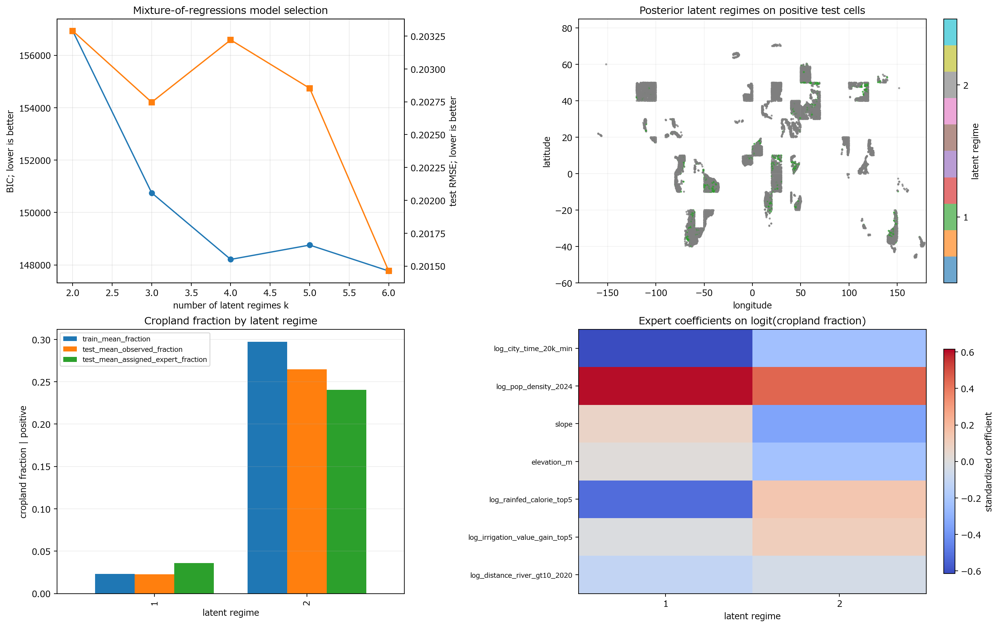

In [ ]:
from sklearn.linear_model import LogisticRegression, Ridge
from sklearn.cluster import KMeans

MIXTURE_DIR = GAEZ_DIR / "CroplandRegression" / "mixture_regressions"
MIXTURE_FIG_DIR = MIXTURE_DIR / "figures"
MIXTURE_DIR.mkdir(parents=True, exist_ok=True)
MIXTURE_FIG_DIR.mkdir(parents=True, exist_ok=True)

# First structural version:
#   R is a latent class.
#   Within each class, positive cropland fraction follows a separate regression.
# This targets the second stage: cropland fraction conditional on cropland being present.
# Presence can be extended to mixture-logit later, but the previous diagnostics showed
# regime differences are stronger for intensity than for presence.
MIXTURE_MAX_TRAIN_ROWS = 45_000
MIXTURE_K_VALUES = [2, 3, 4, 5, 6]
MIXTURE_EM_MAX_ITER = 45
MIXTURE_EM_TOL = 1e-4
MIXTURE_RIDGE_ALPHA = 1.0
MIXTURE_RANDOM_SEED = RANDOM_SEED


def expit_np(x):
    x = np.clip(np.asarray(x, dtype=float), -35, 35)
    return 1.0 / (1.0 + np.exp(-x))


def logit_np(p):
    p = np.clip(np.asarray(p, dtype=float), 1e-4, 1 - 1e-4)
    return np.log(p / (1 - p))


def design_matrix_for_mixture(df: pd.DataFrame, columns=None, mean=None, std=None):
    X = df[feature_cols].copy()
    X["exclusion_class"] = np.nan_to_num(X["exclusion_class"], nan=-1).astype(int).astype(str)
    X = pd.get_dummies(X, columns=["exclusion_class"], prefix="exclusion", dtype=float)
    if columns is None:
        columns = X.columns.tolist()
    X = X.reindex(columns=columns, fill_value=0.0).astype(float)
    if mean is None:
        mean = X.mean(axis=0)
        std = X.std(axis=0).replace(0, 1.0)
    X_scaled = ((X - mean) / std).replace([np.inf, -np.inf], 0.0).fillna(0.0)
    return X_scaled.to_numpy(dtype=np.float64), columns, mean, std


def gaussian_log_density(y, mean, sigma):
    sigma = max(float(sigma), 1e-3)
    return -0.5 * (np.log(2 * np.pi * sigma * sigma) + ((y - mean) ** 2) / (sigma * sigma))


def fit_mixture_of_ridge_regressions(X, y, k: int, random_state: int):
    n, p = X.shape
    y = np.asarray(y, dtype=np.float64)
    init_y = ((y - y.mean()) / (y.std() + 1e-8))[:, None]
    init_X = np.column_stack([X[:, : min(10, p)], init_y])
    labels = KMeans(n_clusters=k, random_state=random_state, n_init=10).fit_predict(init_X)
    resp = np.zeros((n, k), dtype=np.float64)
    resp[np.arange(n), labels] = 1.0
    models = []
    sigmas = np.ones(k, dtype=np.float64)
    pis = np.ones(k, dtype=np.float64) / k
    previous_ll = -np.inf

    for iteration in range(MIXTURE_EM_MAX_ITER):
        models = []
        predictions = np.zeros((n, k), dtype=np.float64)
        for component in range(k):
            weights = np.clip(resp[:, component], 1e-6, None)
            model = Ridge(alpha=MIXTURE_RIDGE_ALPHA, random_state=random_state + component)
            model.fit(X, y, sample_weight=weights)
            pred = model.predict(X)
            resid = y - pred
            sigma = np.sqrt(np.average(resid * resid, weights=weights))
            models.append(model)
            predictions[:, component] = pred
            sigmas[component] = max(float(sigma), 1e-3)

        Nk = resp.sum(axis=0) + 1e-8
        pis = Nk / Nk.sum()
        log_probs = np.zeros((n, k), dtype=np.float64)
        for component in range(k):
            log_probs[:, component] = np.log(pis[component] + 1e-12) + gaussian_log_density(
                y, predictions[:, component], sigmas[component]
            )
        max_log = log_probs.max(axis=1, keepdims=True)
        log_sum = max_log + np.log(np.exp(log_probs - max_log).sum(axis=1, keepdims=True))
        resp = np.exp(log_probs - log_sum)
        ll = float(log_sum.sum())
        if iteration > 2 and abs(ll - previous_ll) < MIXTURE_EM_TOL * (1 + abs(previous_ll)):
            break
        previous_ll = ll

    n_params = k * (p + 1 + 1) + (k - 1)
    bic = -2 * previous_ll + n_params * np.log(n)
    return {
        "k": k,
        "models": models,
        "sigmas": sigmas.copy(),
        "pis": pis.copy(),
        "responsibilities": resp.copy(),
        "log_likelihood": previous_ll,
        "bic": float(bic),
        "iterations": iteration + 1,
    }


def expert_predictions_fraction(mixture, X):
    pred_z = np.column_stack([model.predict(X) for model in mixture["models"]])
    return expit_np(pred_z)


def aligned_gate_probabilities(gate_model, X, k: int):
    raw = gate_model.predict_proba(X)
    out = np.zeros((X.shape[0], k), dtype=float)
    for pos, cls in enumerate(gate_model.classes_):
        if 0 <= int(cls) < k:
            out[:, int(cls)] = raw[:, pos]
    row_sum = out.sum(axis=1, keepdims=True)
    out = np.divide(out, row_sum, out=np.ones_like(out) / k, where=row_sum > 0)
    return out


def weighted_fraction_prediction(mixture, X, weights):
    expert_frac = expert_predictions_fraction(mixture, X)
    return np.sum(weights * expert_frac, axis=1)


def train_gate_from_responsibilities(X, responsibilities, random_state: int):
    hard_labels = responsibilities.argmax(axis=1)
    gate = LogisticRegression(
        max_iter=1_000,
        C=1.0,
        solver="lbfgs",
        random_state=random_state,
    )
    gate.fit(X, hard_labels)
    return gate, hard_labels


def posterior_responsibilities_for_observed_fraction(mixture, X, y_fraction):
    y_z = logit_np(y_fraction)
    pred_z = np.column_stack([model.predict(X) for model in mixture["models"]])
    k = pred_z.shape[1]
    log_probs = np.zeros((X.shape[0], k), dtype=float)
    for component in range(k):
        log_probs[:, component] = np.log(mixture["pis"][component] + 1e-12) + gaussian_log_density(
            y_z, pred_z[:, component], mixture["sigmas"][component]
        )
    max_log = log_probs.max(axis=1, keepdims=True)
    log_sum = max_log + np.log(np.exp(log_probs - max_log).sum(axis=1, keepdims=True))
    return np.exp(log_probs - log_sum)


def evaluate_fraction_prediction(y_true, y_pred):
    return {
        "rmse": float(math.sqrt(mean_squared_error(y_true, y_pred))),
        "mae": float(mean_absolute_error(y_true, y_pred)),
        "r2": float(r2_score(y_true, y_pred)),
    }


mix_train = positive_train.replace([np.inf, -np.inf], np.nan).dropna(subset=feature_cols + ["cropland_fraction"]).copy()
if len(mix_train) > MIXTURE_MAX_TRAIN_ROWS:
    mix_train = mix_train.sample(MIXTURE_MAX_TRAIN_ROWS, random_state=MIXTURE_RANDOM_SEED)
mix_test = positive_test.replace([np.inf, -np.inf], np.nan).dropna(subset=feature_cols + ["cropland_fraction"]).copy()

X_mix_train, mixture_design_columns, mixture_design_mean, mixture_design_std = design_matrix_for_mixture(mix_train)
X_mix_test, _, _, _ = design_matrix_for_mixture(
    mix_test,
    columns=mixture_design_columns,
    mean=mixture_design_mean,
    std=mixture_design_std,
)
y_train_frac = mix_train["cropland_fraction"].to_numpy(dtype=float)
y_test_frac = mix_test["cropland_fraction"].to_numpy(dtype=float)
y_train_z = logit_np(y_train_frac)

global_ridge = Ridge(alpha=MIXTURE_RIDGE_ALPHA, random_state=MIXTURE_RANDOM_SEED)
global_ridge.fit(X_mix_train, y_train_z)
global_ridge_pred = expit_np(global_ridge.predict(X_mix_test))
lgbm_positive_pred = np.clip(reg.predict(mix_test[feature_cols]), 0, 1)

mixture_results = []
mixture_models = {}
for k in MIXTURE_K_VALUES:
    mixture = fit_mixture_of_ridge_regressions(X_mix_train, y_train_z, k=k, random_state=MIXTURE_RANDOM_SEED + k * 10)
    gate_model, hard_labels = train_gate_from_responsibilities(
        X_mix_train, mixture["responsibilities"], random_state=MIXTURE_RANDOM_SEED + k * 100
    )
    gate_prob_test = aligned_gate_probabilities(gate_model, X_mix_test, k)
    gate_test_share = np.bincount(gate_prob_test.argmax(axis=1), minlength=k) / len(gate_prob_test)
    posterior_test = posterior_responsibilities_for_observed_fraction(mixture, X_mix_test, y_test_frac)
    posterior_test_share = np.bincount(posterior_test.argmax(axis=1), minlength=k) / len(posterior_test)
    gate_pred = weighted_fraction_prediction(mixture, X_mix_test, gate_prob_test)
    constant_pred = weighted_fraction_prediction(
        mixture,
        X_mix_test,
        np.repeat(mixture["pis"][None, :], len(mix_test), axis=0),
    )
    gate_metrics = evaluate_fraction_prediction(y_test_frac, gate_pred)
    constant_metrics = evaluate_fraction_prediction(y_test_frac, constant_pred)
    mixture_results.append({
        "k": k,
        "train_rows": int(len(mix_train)),
        "test_rows": int(len(mix_test)),
        "em_iterations": int(mixture["iterations"]),
        "train_log_likelihood": float(mixture["log_likelihood"]),
        "bic": float(mixture["bic"]),
        "gate_rmse": gate_metrics["rmse"],
        "gate_mae": gate_metrics["mae"],
        "gate_r2": gate_metrics["r2"],
        "constant_mix_rmse": constant_metrics["rmse"],
        "constant_mix_mae": constant_metrics["mae"],
        "constant_mix_r2": constant_metrics["r2"],
        "min_component_share": float(mixture["pis"].min()),
        "max_component_share": float(mixture["pis"].max()),
        "min_gate_test_share": float(gate_test_share.min()),
        "max_gate_test_share": float(gate_test_share.max()),
        "min_posterior_test_share": float(posterior_test_share.min()),
        "max_posterior_test_share": float(posterior_test_share.max()),
    })
    mixture_models[k] = {"mixture": mixture, "gate": gate_model, "hard_labels": hard_labels}
    print(f"k={k}: BIC={mixture['bic']:.1f}, gate RMSE={gate_metrics['rmse']:.4f}, gate R2={gate_metrics['r2']:.4f}")

mixture_selection = pd.DataFrame(mixture_results)
# BIC alone can select tiny components. For a regime interpretation, require non-trivial
# EM component size and non-trivial posterior membership on the observed test set.
eligible_mixture_selection = mixture_selection[
    (mixture_selection["min_component_share"] >= 0.05)
    & (mixture_selection["min_posterior_test_share"] >= 0.03)
].copy()
if len(eligible_mixture_selection):
    best_k = int(eligible_mixture_selection.sort_values(["bic", "gate_rmse"]).iloc[0]["k"])
    mixture_selection_rule = "lowest BIC among k with min EM component share >= 5% and min posterior test share >= 3%"
else:
    best_k = int(mixture_selection.sort_values(["bic", "gate_rmse"]).iloc[0]["k"])
    mixture_selection_rule = "fallback: lowest BIC; no k passed minimum posterior share constraints"
best_pack = mixture_models[best_k]
best_mixture = best_pack["mixture"]
best_gate = best_pack["gate"]
best_hard_labels = best_pack["hard_labels"]

best_gate_train_prob = aligned_gate_probabilities(best_gate, X_mix_train, best_k)
best_gate_test_prob = aligned_gate_probabilities(best_gate, X_mix_test, best_k)
best_train_component = best_hard_labels + 1
best_test_posterior = posterior_responsibilities_for_observed_fraction(best_mixture, X_mix_test, y_test_frac)
best_test_component = best_test_posterior.argmax(axis=1) + 1
best_test_component_gate = best_gate_test_prob.argmax(axis=1) + 1
best_test_pred = weighted_fraction_prediction(best_mixture, X_mix_test, best_gate_test_prob)
best_test_expert_fraction = expert_predictions_fraction(best_mixture, X_mix_test)
best_test_assigned_expert_pred = best_test_expert_fraction[np.arange(len(mix_test)), best_test_component - 1]

benchmark_rows = [
    {"model": "global ridge on logit(fraction)", **evaluate_fraction_prediction(y_test_frac, global_ridge_pred)},
    {"model": "finite mixture of regressions + X-gate", **evaluate_fraction_prediction(y_test_frac, best_test_pred)},
    {"model": "existing LightGBM positive-fraction", **evaluate_fraction_prediction(y_test_frac, lgbm_positive_pred)},
]
mixture_benchmarks = pd.DataFrame(benchmark_rows)

component_train = mix_train.copy()
component_train["mixture_component"] = best_train_component
component_train["mixture_component_probability"] = best_mixture["responsibilities"].max(axis=1)
component_test = mix_test.copy()
component_test["mixture_component"] = best_test_component
component_test["mixture_component_gate"] = best_test_component_gate
component_test["mixture_component_probability"] = best_test_posterior.max(axis=1)
component_test["pred_fraction_mixture"] = best_test_pred
component_test["pred_fraction_assigned_expert"] = best_test_assigned_expert_pred

profile_rows = []
for component in range(1, best_k + 1):
    train_group = component_train[component_train["mixture_component"].eq(component)]
    test_group = component_test[component_test["mixture_component"].eq(component)]
    profile_rows.append({
        "component": component,
        "mixture_weight_train_em": float(best_mixture["pis"][component - 1]),
        "train_rows_hard": int(len(train_group)),
        "test_rows_posterior": int(len(test_group)),
        "sigma_logit_fraction": float(best_mixture["sigmas"][component - 1]),
        "train_mean_fraction": float(train_group["cropland_fraction"].mean()) if len(train_group) else np.nan,
        "test_mean_observed_fraction": float(test_group["cropland_fraction"].mean()) if len(test_group) else np.nan,
        "test_mean_gate_predicted_fraction": float(test_group["pred_fraction_mixture"].mean()) if len(test_group) else np.nan,
        "test_mean_assigned_expert_fraction": float(test_group["pred_fraction_assigned_expert"].mean()) if len(test_group) else np.nan,
        "mean_city_time_ln_min": float(train_group["log_city_time_20k_min"].mean()) if len(train_group) else np.nan,
        "mean_pop_density_ln": float(train_group["log_pop_density_2024"].mean()) if len(train_group) else np.nan,
        "mean_rainfed_calorie_ln": float(train_group["log_rainfed_calorie_top5"].mean()) if len(train_group) else np.nan,
        "mean_irrigation_value_gain_ln": float(train_group["log_irrigation_value_gain_top5"].mean()) if len(train_group) else np.nan,
        "mean_slope": float(train_group["slope"].mean()) if len(train_group) else np.nan,
    })
component_profiles = pd.DataFrame(profile_rows)

coef_rows = []
for component, model in enumerate(best_mixture["models"], start=1):
    coef = pd.Series(model.coef_.ravel(), index=mixture_design_columns)
    for feature in feature_cols:
        if feature == "exclusion_class":
            relevant = coef[[col for col in mixture_design_columns if col.startswith("exclusion_")]]
            value = float(relevant.abs().mean()) if len(relevant) else np.nan
            signed_value = float(relevant.mean()) if len(relevant) else np.nan
        else:
            value = float(abs(coef.get(feature, np.nan)))
            signed_value = float(coef.get(feature, np.nan))
        coef_rows.append({
            "component": component,
            "feature": feature,
            "signed_coefficient_on_logit_fraction": signed_value,
            "absolute_coefficient": value,
        })
component_coefficients = pd.DataFrame(coef_rows)

selection_path = MIXTURE_DIR / "positive_fraction_mixture_k_selection.csv"
benchmark_path = MIXTURE_DIR / "positive_fraction_mixture_benchmarks.csv"
profile_path = MIXTURE_DIR / f"positive_fraction_mixture_component_profiles_k{best_k}.csv"
coefficient_path = MIXTURE_DIR / f"positive_fraction_mixture_component_coefficients_k{best_k}.csv"
assign_train_path = MIXTURE_DIR / f"positive_fraction_mixture_train_assignments_k{best_k}.csv"
assign_test_path = MIXTURE_DIR / f"positive_fraction_mixture_test_assignments_k{best_k}.csv"

mixture_selection.to_csv(selection_path, index=False, encoding="utf-8-sig")
mixture_benchmarks.to_csv(benchmark_path, index=False, encoding="utf-8-sig")
component_profiles.to_csv(profile_path, index=False, encoding="utf-8-sig")
component_coefficients.to_csv(coefficient_path, index=False, encoding="utf-8-sig")
component_train[["row", "col", "lat", "lon", "cropland_fraction", "mixture_component", "mixture_component_probability"]].to_csv(
    assign_train_path, index=False, encoding="utf-8-sig"
)
component_test[["row", "col", "lat", "lon", "cropland_fraction", "pred_fraction_mixture", "pred_fraction_assigned_expert", "mixture_component", "mixture_component_gate", "mixture_component_probability"]].to_csv(
    assign_test_path, index=False, encoding="utf-8-sig"
)

print(f"selected k: {best_k}")
print(f"selection rule: {mixture_selection_rule}")
print("\nBenchmarks on spatial test positive cells")
print(mixture_benchmarks.round(4).to_string(index=False))
print("\nK selection")
print(mixture_selection.round(4).to_string(index=False))
print("\nComponent profiles")
print(component_profiles.round(4).to_string(index=False))
print("saved", MIXTURE_DIR)

fig, axes = plt.subplots(2, 2, figsize=(16, 10), constrained_layout=True)

axes[0, 0].plot(mixture_selection["k"], mixture_selection["bic"], marker="o", label="BIC")
axes[0, 0].set_xlabel("number of latent regimes k")
axes[0, 0].set_ylabel("BIC; lower is better")
axes[0, 0].set_title("Mixture-of-regressions model selection")
axes[0, 0].grid(alpha=0.25)
ax_rmse = axes[0, 0].twinx()
ax_rmse.plot(mixture_selection["k"], mixture_selection["gate_rmse"], marker="s", color="tab:orange", label="test RMSE")
ax_rmse.set_ylabel("test RMSE; lower is better")

scatter = axes[0, 1].scatter(
    component_test["lon"],
    component_test["lat"],
    c=component_test["mixture_component"],
    s=2,
    cmap="tab10",
    alpha=0.65,
    vmin=0.5,
    vmax=best_k + 0.5,
)
axes[0, 1].set_xlim(-180, 180)
axes[0, 1].set_ylim(-60, 85)
axes[0, 1].set_title("Posterior latent regimes on positive test cells")
axes[0, 1].set_xlabel("longitude")
axes[0, 1].set_ylabel("latitude")
axes[0, 1].grid(alpha=0.15)
fig.colorbar(scatter, ax=axes[0, 1], ticks=np.arange(1, best_k + 1), label="latent regime")

profile_plot = component_profiles.set_index("component")[["train_mean_fraction", "test_mean_observed_fraction", "test_mean_assigned_expert_fraction"]]
profile_plot.plot(kind="bar", ax=axes[1, 0], width=0.78)
axes[1, 0].set_title("Cropland fraction by latent regime")
axes[1, 0].set_xlabel("latent regime")
axes[1, 0].set_ylabel("cropland fraction | positive")
axes[1, 0].grid(axis="y", alpha=0.2)
axes[1, 0].legend(fontsize=8)

coef_features = [
    "log_city_time_20k_min",
    "log_pop_density_2024",
    "slope",
    "elevation_m",
    "log_rainfed_calorie_top5",
    "log_irrigation_value_gain_top5",
    "log_distance_river_gt10_2020",
]
coef_matrix = (
    component_coefficients[component_coefficients["feature"].isin(coef_features)]
    .pivot(index="feature", columns="component", values="signed_coefficient_on_logit_fraction")
    .reindex(coef_features)
)
coef_vmax = float(np.nanmax(np.abs(coef_matrix.to_numpy()))) if coef_matrix.size else 1.0
coef_img = axes[1, 1].imshow(coef_matrix, aspect="auto", cmap="coolwarm", vmin=-coef_vmax, vmax=coef_vmax)
axes[1, 1].set_title("Expert coefficients on logit(cropland fraction)")
axes[1, 1].set_xlabel("latent regime")
axes[1, 1].set_xticks(np.arange(best_k))
axes[1, 1].set_xticklabels(np.arange(1, best_k + 1))
axes[1, 1].set_yticks(np.arange(len(coef_features)))
axes[1, 1].set_yticklabels(coef_features, fontsize=8)
fig.colorbar(coef_img, ax=axes[1, 1], shrink=0.85, label="standardized coefficient")
plt.show()

## 13. この初回分析の読み方

- このモデルは「どの要因が cropland presence / fraction を説明しやすいか」を見る入口。
- 重要度・binning 曲線で、気候資源、水アクセス、市場アクセス、地形の効き方を確認する。
- 次にやるなら、国境・国固定効果・長期平均GloFAS・空間ブロックの設計を強化する。

## 14. 予測精度の総括（レジーム分割前後）

同じ空間ホールドアウトを使って、(1) 農地があるか、(2) 農地があるときの cropland fraction、(3) 二段階を合わせた expected fraction を、全体モデルとレジーム別モデルで比較する。

このテストサンプルは presence / absence をほぼ同数ずつ抽出しているため、ここでの数値は「抽出された空間テスト上の予測精度」であり、全球の農地比率そのものではない。レジームは同じサンプルから探索的に作っているので、レジーム別の比較は厳密な最終検証ではなく探索的な比較として読む。

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, balanced_accuracy_score

SUMMARY_EVAL_DIR = GAEZ_DIR / 'CroplandRegression' / 'evaluation'
SUMMARY_EVAL_DIR.mkdir(parents=True, exist_ok=True)

def summary_classification(frame, probability_col, model_name):
    work = frame[['presence', probability_col]].replace([np.inf, -np.inf], np.nan).dropna()
    y = work['presence'].astype(int).to_numpy()
    probability = work[probability_col].to_numpy(dtype=float)
    predicted = (probability >= 0.5).astype(int)
    has_two_classes = np.unique(y).size == 2
    return {
        'model': model_name,
        'n': int(len(y)),
        'presence_rate': float(y.mean()) if len(y) else np.nan,
        'auc': float(roc_auc_score(y, probability)) if has_two_classes else np.nan,
        'average_precision': float(average_precision_score(y, probability)) if has_two_classes else np.nan,
        'accuracy': float(accuracy_score(y, predicted)) if len(y) else np.nan,
        'balanced_accuracy': float(balanced_accuracy_score(y, predicted)) if has_two_classes else np.nan,
        'precision': float(precision_score(y, predicted, zero_division=0)) if len(y) else np.nan,
        'recall': float(recall_score(y, predicted, zero_division=0)) if has_two_classes else np.nan,
        'f1': float(f1_score(y, predicted, zero_division=0)) if has_two_classes else np.nan,
    }

def summary_regression(frame, target_col, prediction_col, model_name):
    work = frame[[target_col, prediction_col]].replace([np.inf, -np.inf], np.nan).dropna()
    y = work[target_col].to_numpy(dtype=float)
    predicted = work[prediction_col].to_numpy(dtype=float)
    return {
        'model': model_name,
        'n': int(len(work)),
        'observed_mean': float(y.mean()) if len(y) else np.nan,
        'predicted_mean': float(predicted.mean()) if len(predicted) else np.nan,
        'mae': float(mean_absolute_error(y, predicted)) if len(y) else np.nan,
        'rmse': float(math.sqrt(mean_squared_error(y, predicted))) if len(y) else np.nan,
        'r2': float(r2_score(y, predicted)) if len(y) > 1 else np.nan,
        'bias_observed_minus_predicted': float((y - predicted).mean()) if len(y) else np.nan,
    }

# 1) Presence: first report the global model on all test cells, then compare
# the global and regime-specific models on exactly the same regime-covered cells.
summary_presence_all = pd.DataFrame([
    summary_classification(
        pd.DataFrame({'presence': test['presence'].to_numpy(), 'probability': proba_test}),
        'probability',
        '全体モデル（全テスト）',
    ),
])
summary_presence_common = pd.DataFrame([
    summary_classification(presence_valid, 'global_proba', '全体モデル（共通subset）'),
    summary_classification(presence_valid, 'regime_proba', 'レジーム別モデル（共通subset）'),
])

# 2) Conditional fraction: only cells with observed presence=1.
summary_fraction_all_frame = positive_test[['cropland_fraction']].copy()
summary_fraction_all_frame['global_fraction_pred'] = np.asarray(reg_pred, dtype=float)
summary_fraction = [
    summary_regression(
        summary_fraction_all_frame,
        'cropland_fraction',
        'global_fraction_pred',
        '全体モデル（全positiveテスト）',
    ),
    summary_regression(fraction_valid, 'cropland_fraction', 'global_fraction_pred', '全体モデル（共通subset）'),
    summary_regression(fraction_valid, 'cropland_fraction', 'regime_fraction_pred', 'レジーム別モデル（共通subset）'),
]
if 'mixture_benchmarks' in globals() and not mixture_benchmarks.empty:
    mixture_row = mixture_benchmarks[mixture_benchmarks['model'].str.contains('finite mixture', case=False, na=False)]
    if not mixture_row.empty:
        mixture_row = mixture_row.iloc[0]
        summary_fraction.append({
            'model': f'潜在レジーム混合回帰（k={best_k}）',
            'n': int(len(mix_test)),
            'observed_mean': np.nan,
            'predicted_mean': np.nan,
            'mae': float(mixture_row['mae']),
            'rmse': float(mixture_row['rmse']),
            'r2': float(mixture_row['r2']),
            'bias_observed_minus_predicted': np.nan,
        })
summary_fraction = pd.DataFrame(summary_fraction)

# 3) Combined two-stage expected fraction on all test cells for the global model.
# For the regime-specific model, refit the same local fraction models on the
# training portion and predict every regime-covered test cell.
summary_combined_global = test[['cropland_fraction']].copy()
summary_combined_global['expected_fraction'] = (
    np.asarray(proba_test, dtype=float) * np.clip(reg.predict(test[feature_cols]), 0, 1)
)
summary_combined_regime = test_regime.copy()
summary_combined_regime['global_proba'] = clf.predict_proba(summary_combined_regime[feature_cols])[:, 1]
summary_combined_regime['global_fraction_pred'] = np.clip(reg.predict(summary_combined_regime[feature_cols]), 0, 1)
summary_combined_regime['regime_fraction_pred'] = np.nan
for regime_id, train_group in positive_train_regime.groupby('regime', sort=True):
    test_mask = summary_combined_regime['regime'].eq(regime_id)
    if len(train_group) < 400 or train_group['cropland_fraction'].nunique() < 10:
        continue
    summary_local_reg = LGBMRegressor(
        objective='regression',
        n_estimators=320,
        learning_rate=0.035,
        num_leaves=23,
        min_child_samples=55,
        subsample=0.9,
        colsample_bytree=0.9,
        random_state=RANDOM_SEED + int(regime_id) * 200,
        n_jobs=1,
        verbose=-1,
    )
    summary_local_reg.fit(
        train_group[feature_cols],
        train_group['cropland_fraction'],
        categorical_feature=['exclusion_class'],
    )
    summary_combined_regime.loc[test_mask, 'regime_fraction_pred'] = np.clip(
        summary_local_reg.predict(summary_combined_regime.loc[test_mask, feature_cols]),
        0,
        1,
    )
summary_combined_regime['global_expected_fraction'] = (
    summary_combined_regime['global_proba'] * summary_combined_regime['global_fraction_pred']
)
# Use the row-level regime probabilities already produced in cell 23.
summary_combined_regime = summary_combined_regime.merge(
    presence_valid[['row', 'col', 'regime_proba']],
    on=['row', 'col'],
    how='left',
)
summary_combined_regime['regime_expected_fraction'] = (
    summary_combined_regime['regime_proba'] * summary_combined_regime['regime_fraction_pred']
)
summary_combined_regime_valid = summary_combined_regime.dropna(subset=['regime_expected_fraction']).copy()
summary_combined = pd.DataFrame([
    summary_regression(summary_combined_global, 'cropland_fraction', 'expected_fraction', '全体二段階モデル（全テスト）'),
    summary_regression(summary_combined_regime_valid, 'cropland_fraction', 'global_expected_fraction', '全体二段階モデル（共通subset）'),
    summary_regression(summary_combined_regime_valid, 'cropland_fraction', 'regime_expected_fraction', 'レジーム別二段階モデル（共通subset）'),
])

summary_presence_all.to_csv(SUMMARY_EVAL_DIR / 'cropland_presence_accuracy_summary.csv', index=False, encoding='utf-8-sig')
summary_presence_common.to_csv(SUMMARY_EVAL_DIR / 'cropland_presence_global_vs_regime_summary.csv', index=False, encoding='utf-8-sig')
summary_fraction.to_csv(SUMMARY_EVAL_DIR / 'cropland_fraction_accuracy_summary.csv', index=False, encoding='utf-8-sig')
summary_combined.to_csv(SUMMARY_EVAL_DIR / 'cropland_two_stage_accuracy_summary.csv', index=False, encoding='utf-8-sig')

print('=== 1. 農地があるか（presence） ===')
print(summary_presence_all.round(4).to_string(index=False))
print('\n同じ regime-covered test cells での比較（AUC / AP / F1 は大きいほど良い）')
print(summary_presence_common.round(4).to_string(index=False))
print('\n=== 2. 農地があるセルで、どれくらい農地か（conditional fraction） ===')
print(summary_fraction.round(4).to_string(index=False))
print('\n=== 3. 二段階をまとめた expected cropland fraction ===')
print(summary_combined.round(4).to_string(index=False))
print('\nレジーム別の詳細（既存の cell 23 と同じテスト比較）')
if not regime_presence_eval.empty:
    print('\n[presence by regime]')
    print(regime_presence_eval.round(4).to_string(index=False))
if not regime_fraction_eval.empty:
    print('\n[fraction by regime]')
    print(regime_fraction_eval.round(4).to_string(index=False))
print('\nCSV saved to', SUMMARY_EVAL_DIR)

## 15. 国別誤差と GDP per capita

ここではレジーム分割前の全球二段階モデルについて、国別の過大評価・過小評価と 2024 年 GDP per capita (PPP, current international $) を並べる。observed_minus_predicted が正なら過小評価、負なら過大評価である。国土面積の大きい国だけが目立たないように、総面積誤差と、国土に占める cropland share の誤差を分けて見る。

In [ ]:
GDP_PATH = ROOT / 'GDP_percapitaPPP.csv'
GDP_COMPARISON_DIR = PRED_DIR / 'gdp_comparison'
GDP_COMPARISON_DIR.mkdir(parents=True, exist_ok=True)

# The World Bank download has four metadata rows before the data header.
gdp_2024 = pd.read_csv(GDP_PATH, skiprows=4, usecols=['Country Name', 'Country Code', '2024'])
gdp_2024 = gdp_2024.rename(columns={
    'Country Name': 'gdp_country_name',
    'Country Code': 'iso3',
    '2024': 'gdp_per_capita_ppp_2024',
})
gdp_2024['gdp_per_capita_ppp_2024'] = pd.to_numeric(gdp_2024['gdp_per_capita_ppp_2024'], errors='coerce')
gdp_2024 = gdp_2024.drop_duplicates('iso3')

country_gdp_compare = country_summary.merge(gdp_2024, on='iso3', how='left')
country_gdp_compare['error_area_km2_observed_minus_predicted'] = country_gdp_compare[
    'residual_area_km2_observed_minus_predicted'
]
country_gdp_compare['error_share_observed_minus_predicted'] = (
    country_gdp_compare['actual_cropland_share'] - country_gdp_compare['predicted_cropland_share']
)
country_gdp_compare['log_gdp_per_capita_ppp_2024'] = np.log1p(
    country_gdp_compare['gdp_per_capita_ppp_2024'].clip(lower=0)
)
country_gdp_compare['error_direction'] = np.select(
    [
        country_gdp_compare['error_area_km2_observed_minus_predicted'] > 0,
        country_gdp_compare['error_area_km2_observed_minus_predicted'] < 0,
    ],
    ['underpredicted', 'overpredicted'],
    default='near_zero',
)

country_gdp_compare = country_gdp_compare.replace([np.inf, -np.inf], np.nan)
country_gdp_compare.to_csv(
    GDP_COMPARISON_DIR / 'country_cropland_error_vs_gdp_per_capita_2024.csv',
    index=False,
    encoding='utf-8-sig',
)

display_cols = [
    'iso3',
    'country',
    'gdp_country_name',
    'gdp_per_capita_ppp_2024',
    'actual_cropland_area_km2',
    'predicted_cropland_area_km2',
    'error_area_km2_observed_minus_predicted',
    'actual_cropland_share',
    'predicted_cropland_share',
    'error_share_observed_minus_predicted',
]

under_area = country_gdp_compare.sort_values(
    'error_area_km2_observed_minus_predicted', ascending=False
).head(20)
over_area = country_gdp_compare.sort_values(
    'error_area_km2_observed_minus_predicted', ascending=True
).head(20)
under_share = country_gdp_compare.sort_values(
    'error_share_observed_minus_predicted', ascending=False
).head(20)
over_share = country_gdp_compare.sort_values(
    'error_share_observed_minus_predicted', ascending=True
).head(20)

print('Positive error = observed larger than predicted = underprediction.')
print('Negative error = predicted larger than observed = overprediction.')
print('\n=== Underprediction: largest observed - predicted cropland area ===')
print(under_area[display_cols].round(4).to_string(index=False))
print('\n=== Overprediction: most negative observed - predicted cropland area ===')
print(over_area[display_cols].round(4).to_string(index=False))
print('\n=== Underprediction: largest observed - predicted cropland share ===')
print(under_share[display_cols].round(4).to_string(index=False))
print('\n=== Overprediction: most negative observed - predicted cropland share ===')
print(over_share[display_cols].round(4).to_string(index=False))

gdp_valid = country_gdp_compare.dropna(
    subset=['log_gdp_per_capita_ppp_2024', 'error_area_km2_observed_minus_predicted', 'error_share_observed_minus_predicted']
).query('land_area_km2_in_grid > 0')
gdp_corr = pd.DataFrame([
    {
        'comparison': 'GDP vs total area error',
        'n_countries': int(len(gdp_valid)),
        'pearson_corr_log_gdp_error_km2': gdp_valid['log_gdp_per_capita_ppp_2024'].corr(
            gdp_valid['error_area_km2_observed_minus_predicted']
        ),
        'spearman_corr_log_gdp_error_km2': gdp_valid['log_gdp_per_capita_ppp_2024'].corr(
            gdp_valid['error_area_km2_observed_minus_predicted'], method='spearman'
        ),
    },
    {
        'comparison': 'GDP vs cropland-share error',
        'n_countries': int(len(gdp_valid)),
        'pearson_corr_log_gdp_error_share': gdp_valid['log_gdp_per_capita_ppp_2024'].corr(
            gdp_valid['error_share_observed_minus_predicted']
        ),
        'spearman_corr_log_gdp_error_share': gdp_valid['log_gdp_per_capita_ppp_2024'].corr(
            gdp_valid['error_share_observed_minus_predicted'], method='spearman'
        ),
    },
])
print('\n=== GDP per capita and prediction error correlation ===')
print(gdp_corr.round(4).to_string(index=False))
gdp_corr.to_csv(
    GDP_COMPARISON_DIR / 'gdp_per_capita_prediction_error_correlations_2024.csv',
    index=False,
    encoding='utf-8-sig',
)

fig, ax = plt.subplots(figsize=(9.5, 6.5), constrained_layout=True)
plot_gdp = gdp_valid.copy()
colors = np.where(plot_gdp['error_share_observed_minus_predicted'] >= 0, 'tab:red', 'tab:blue')
ax.scatter(
    plot_gdp['gdp_per_capita_ppp_2024'],
    plot_gdp['error_share_observed_minus_predicted'],
    c=colors,
    alpha=0.78,
    s=28,
    edgecolor='none',
)
ax.axhline(0, color='0.25', linewidth=0.9)
ax.set_xscale('log')
ax.set_xlabel('GDP per capita, PPP, current international $ (2024; log scale)')
ax.set_ylabel('Observed - predicted cropland share')
ax.set_title('Global two-stage model: country residual vs GDP per capita')
ax.grid(alpha=0.22)
plt.show()
print('saved', GDP_COMPARISON_DIR / 'country_cropland_error_vs_gdp_per_capita_2024.csv')

## 16. ノートブック状態の保存と復元

重い計算を毎回やり直さないためのチェックポイント。最初に一度だけ上のセルを最後まで実行して「保存セル」を実行する。次回以降、ノートブックを開き直したときは「復元セル」だけを実行してから、新しく追加した分析セルを実行すればよい。復元後は Run All を使わない。

In [37]:
import joblib

STATE_DIR = GAEZ_DIR / 'CroplandRegression' / 'notebook_state'
STATE_DIR.mkdir(parents=True, exist_ok=True)
STATE_PATH = STATE_DIR / 'cropland_two_stage_notebook_state.joblib'

STATE_KEYS = [
    'ROOT', 'GAEZ_DIR', 'HYDE_DIR', 'CROPLAND_DIR', 'DIST_DIR', 'GLOFAS_DIR',
    'STD_DIR', 'FEATURE_CACHE', 'RANDOM_SEED', 'YEAR', 'PRESENCE_THRESHOLD',
    'N_POS_SAMPLE', 'N_ZERO_SAMPLE', 'TOP_K_CROPS', 'REPRESENTATIVE_CROP_TABLE',
    'HEIGHT', 'WIDTH', 'SHAPE', 'feature_cols',
    'clf', 'reg', 'train', 'test', 'positive_train', 'positive_test',
    'proba_test', 'pred_test', 'reg_pred', 'reg_y',
    'presence_metrics', 'reg_metrics', 'metrics', 'imp_clf', 'imp_reg',
    'REGIME_BLOCK_DEG', 'REGIME_LOOKUP', 'train_regime', 'test_regime',
    'positive_train_regime', 'positive_test_regime', 'presence_eval',
    'fraction_eval', 'presence_valid', 'fraction_valid',
    'presence_comparison', 'fraction_comparison', 'regime_presence_eval',
    'regime_fraction_eval', 'comparison_summary',
    'mixture_selection', 'mixture_benchmarks', 'best_k', 'best_mixture',
    'best_gate', 'component_profiles', 'component_coefficients',
    'component_train', 'component_test',
    'PRED_DIR', 'COUNTRY_SUMMARY_PATH', 'REGION_SUMMARY_PATH',
    'country_lookup', 'country_summary', 'region_summary',
    'country_gdp_compare', 'gdp_corr',
]
state = {key: globals()[key] for key in STATE_KEYS if key in globals()}
state['_state_version'] = 1
joblib.dump(state, STATE_PATH, compress=3)
print('saved checkpoint:', STATE_PATH)
print('saved keys:', len(state) - 1)

saved checkpoint: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\notebook_state\cropland_two_stage_notebook_state.joblib
saved keys: 66


In [ ]:
import json
import joblib
import math
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    accuracy_score,
    mean_absolute_error,
    mean_squared_error,
    r2_score,
)
from lightgbm import LGBMClassifier, LGBMRegressor

STATE_DIR = Path(r'C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\notebook_state')
STATE_PATH = STATE_DIR / 'cropland_two_stage_notebook_state.joblib'
if not STATE_PATH.exists():
    raise FileNotFoundError(
        f'checkpoint not found: {STATE_PATH}. Run the full notebook once, then run the save cell.'
    )

state = joblib.load(STATE_PATH)
if state.get('_state_version') != 1:
    raise ValueError(f'unsupported checkpoint version: {state.get("_state_version")}')
globals().update({key: value for key, value in state.items() if not key.startswith('_')})

PRED_DIR = GAEZ_DIR / 'CroplandRegression' / 'predictions'
cropland_raw = np.load(CROPLAND_DIR / 'cropland_fraction_1950_2024.npy', mmap_mode='r')
cropland_years = np.load(CROPLAND_DIR / 'years.npy')
cropland_2024 = np.asarray(cropland_raw[int(np.where(cropland_years == YEAR)[0][0])], dtype=np.float32)
cell_area_km2 = np.load(CROPLAND_DIR / 'grid_area_km2.npy', mmap_mode='r')
lat = np.load(CROPLAND_DIR / 'lat.npy')
lon = np.load(CROPLAND_DIR / 'lon.npy')
pred_presence_calibrated = np.load(
    PRED_DIR / 'cropland_presence_probability_prior_corrected_lgbm_2024.npy',
    mmap_mode='r',
)
pred_fraction_positive = np.load(
    PRED_DIR / 'cropland_fraction_positive_conditional_lgbm_2024.npy',
    mmap_mode='r',
)
pred_fraction_expected = np.load(
    PRED_DIR / 'cropland_fraction_expected_lgbm_2024.npy',
    mmap_mode='r',
)
residual_fraction = np.load(
    PRED_DIR / 'cropland_fraction_residual_observed_minus_predicted_lgbm_2024.npy',
    mmap_mode='r',
)

print('restored checkpoint:', STATE_PATH)
print('global model test rows:', len(test))
print('regime-covered test rows:', len(test_regime) if 'test_regime' in globals() else 'not saved')
print('new analysis cells can run without rerunning raster preparation or model fitting')

## 17. 0/1 の混同行列（農地があるか・ないか）

ここでは cropland fraction が 0.01 より大きいセルを「農地あり=1」、それ以外を「農地なし=0」として、実測値と予測値の 2×2 混同行列を表示する。行が実測、列が予測である。

In [ ]:
from sklearn.metrics import confusion_matrix

def presence_confusion_table(frame, probability_col, model_name):
    work = frame[['presence', probability_col]].replace([np.inf, -np.inf], np.nan).dropna()
    y_true = work['presence'].astype(int).to_numpy()
    y_pred = (work[probability_col].to_numpy(dtype=float) >= 0.5).astype(int)
    matrix = confusion_matrix(y_true, y_pred, labels=[0, 1])
    tn, fp, fn, tp = matrix.ravel()
    total = int(matrix.sum())
    return {
        'model': model_name,
        'tn': int(tn),
        'fp': int(fp),
        'fn': int(fn),
        'tp': int(tp),
        'total': total,
        'accuracy': float((tn + tp) / total) if total else np.nan,
        'actual_positive_count': int(fn + tp),
        'predicted_positive_count': int(fp + tp),
    }

def print_presence_confusion(result):
    matrix = pd.DataFrame(
        [
            [result['tn'], result['fp']],
            [result['fn'], result['tp']],
        ],
        index=['実測0：農地なし', '実測1：農地あり'],
        columns=['予測0：農地なし', '予測1：農地あり'],
    )
    print(f"\n=== {result['model']} ===")
    print(matrix.to_string())
    print(f"正解率: {result['accuracy']:.4f}  /  n={result['total']:,}")
    print(f"実測の農地あり: {result['actual_positive_count']:,}")
    print(f"予測の農地あり: {result['predicted_positive_count']:,}")
    print(
        'TN=農地なしを正しくなし、FP=農地なしをありと誤判定、'
        'FN=農地ありを見逃し、TP=農地ありを正しくあり'
    )

confusion_results = [
    presence_confusion_table(
        pd.DataFrame({'presence': test['presence'].to_numpy(), 'probability': proba_test}),
        'probability',
        '全体モデル（全テスト）',
    ),
    presence_confusion_table(presence_valid, 'global_proba', '全体モデル（共通subset）'),
    presence_confusion_table(presence_valid, 'regime_proba', 'レジーム別モデル（共通subset）'),
]
for result in confusion_results:
    print_presence_confusion(result)

confusion_summary = pd.DataFrame(confusion_results)
confusion_summary.to_csv(
    PRED_DIR / 'presence_confusion_matrix_summary.csv',
    index=False,
    encoding='utf-8-sig',
)
print('\n保存先:', PRED_DIR / 'presence_confusion_matrix_summary.csv')

## 18. レジームなしの空間ラグモデル

レジーム分割は使わず、世界全体で一つのモデルを維持したまま、学習データの近傍セルから空間ラグを作って精度が上がるかを確認する。テストセルの実測値は空間ラグの計算に使わず、学習セルだけを参照する。これは、近隣の観測済みセルがある状況での空間補間に近い評価である。

In [21]:
from sklearn.metrics import (
    precision_score,
    recall_score,
    f1_score,
    balanced_accuracy_score,
)
from sklearn.neighbors import BallTree
import joblib

SPATIAL_DIR = GAEZ_DIR / 'CroplandRegression' / 'spatial_lag'
SPATIAL_DIR.mkdir(parents=True, exist_ok=True)
SPATIAL_LAG_K = 32
EARTH_RADIUS_KM = 6371.0088
SPATIAL_PRESENCE_FEATURES = feature_cols + [
    'spatial_lag_presence_32nn',
    'spatial_nearest_train_km',
]
SPATIAL_FRACTION_FEATURES = feature_cols + [
    'spatial_lag_fraction_32nn',
    'spatial_nearest_positive_km',
]

def spatial_idw_lag(query_frame, reference_frame, reference_values, k=32, exclude_self=False):
    query_coords = np.radians(query_frame[['lat', 'lon']].to_numpy(dtype=float))
    reference_coords = np.radians(reference_frame[['lat', 'lon']].to_numpy(dtype=float))
    reference_values = np.asarray(reference_values, dtype=float)
    tree = BallTree(reference_coords, metric='haversine')
    neighbor_count = min(k + int(exclude_self), len(reference_frame))
    distances, indices = tree.query(query_coords, k=neighbor_count)
    if exclude_self:
        distances = distances[:, 1:]
        indices = indices[:, 1:]
    weights = 1.0 / np.maximum(distances, 1e-6)
    values = reference_values[indices]
    lag = np.sum(weights * values, axis=1) / np.sum(weights, axis=1)
    nearest_km = distances[:, 0] * EARTH_RADIUS_KM
    return lag.astype(np.float32), nearest_km.astype(np.float32)

train_spatial = train.copy()
test_spatial = test.copy()
train_presence_lag, train_nearest_km = spatial_idw_lag(
    train_spatial,
    train_spatial,
    train_spatial['presence'].to_numpy(),
    k=SPATIAL_LAG_K,
    exclude_self=True,
)
test_presence_lag, test_nearest_km = spatial_idw_lag(
    test_spatial,
    train_spatial,
    train_spatial['presence'].to_numpy(),
    k=SPATIAL_LAG_K,
    exclude_self=False,
)
train_spatial['spatial_lag_presence_32nn'] = train_presence_lag
train_spatial['spatial_nearest_train_km'] = train_nearest_km
test_spatial['spatial_lag_presence_32nn'] = test_presence_lag
test_spatial['spatial_nearest_train_km'] = test_nearest_km

positive_train_spatial = positive_train.copy()
positive_test_spatial = positive_test.copy()
test_spatial_fraction_all = test.copy()
positive_train_fraction_lag, positive_train_nearest_km = spatial_idw_lag(
    positive_train_spatial,
    positive_train_spatial,
    positive_train_spatial['cropland_fraction'].to_numpy(),
    k=SPATIAL_LAG_K,
    exclude_self=True,
)
positive_test_fraction_lag, positive_test_nearest_km = spatial_idw_lag(
    positive_test_spatial,
    positive_train_spatial,
    positive_train_spatial['cropland_fraction'].to_numpy(),
    k=SPATIAL_LAG_K,
    exclude_self=False,
)
test_fraction_lag_all, test_nearest_positive_km_all = spatial_idw_lag(
    test_spatial_fraction_all,
    positive_train_spatial,
    positive_train_spatial['cropland_fraction'].to_numpy(),
    k=SPATIAL_LAG_K,
    exclude_self=False,
)
positive_train_spatial['spatial_lag_fraction_32nn'] = positive_train_fraction_lag
positive_train_spatial['spatial_nearest_positive_km'] = positive_train_nearest_km
positive_test_spatial['spatial_lag_fraction_32nn'] = positive_test_fraction_lag
positive_test_spatial['spatial_nearest_positive_km'] = positive_test_nearest_km
test_spatial_fraction_all['spatial_lag_fraction_32nn'] = test_fraction_lag_all
test_spatial_fraction_all['spatial_nearest_positive_km'] = test_nearest_positive_km_all

clf_spatial = LGBMClassifier(
    objective='binary',
    n_estimators=450,
    learning_rate=0.035,
    num_leaves=31,
    min_child_samples=80,
    subsample=0.85,
    colsample_bytree=0.85,
    random_state=RANDOM_SEED,
    n_jobs=4,
    verbose=-1,
)
clf_spatial.fit(
    train_spatial[SPATIAL_PRESENCE_FEATURES],
    train_spatial['presence'],
    categorical_feature=['exclusion_class'],
)
spatial_proba_test = clf_spatial.predict_proba(test_spatial[SPATIAL_PRESENCE_FEATURES])[:, 1]

reg_spatial = LGBMRegressor(
    objective='regression',
    n_estimators=550,
    learning_rate=0.03,
    num_leaves=31,
    min_child_samples=60,
    subsample=0.85,
    colsample_bytree=0.85,
    random_state=RANDOM_SEED,
    n_jobs=4,
    verbose=-1,
)
reg_spatial.fit(
    positive_train_spatial[SPATIAL_FRACTION_FEATURES],
    positive_train_spatial['cropland_fraction'],
    categorical_feature=['exclusion_class'],
)
spatial_fraction_test = np.clip(
    reg_spatial.predict(positive_test_spatial[SPATIAL_FRACTION_FEATURES]),
    0,
    1,
)

def spatial_classification_metrics(y_true, probability, model_name):
    y_true = np.asarray(y_true, dtype=int)
    probability = np.asarray(probability, dtype=float)
    y_pred = (probability >= 0.5).astype(int)
    return {
        'model': model_name,
        'n': int(len(y_true)),
        'auc': float(roc_auc_score(y_true, probability)),
        'average_precision': float(average_precision_score(y_true, probability)),
        'accuracy': float(accuracy_score(y_true, y_pred)),
        'balanced_accuracy': float(balanced_accuracy_score(y_true, y_pred)),
        'precision': float(precision_score(y_true, y_pred, zero_division=0)),
        'recall': float(recall_score(y_true, y_pred, zero_division=0)),
        'f1': float(f1_score(y_true, y_pred, zero_division=0)),
    }

def spatial_regression_metrics(y_true, prediction, model_name):
    y_true = np.asarray(y_true, dtype=float)
    prediction = np.asarray(prediction, dtype=float)
    return {
        'model': model_name,
        'n': int(len(y_true)),
        'observed_mean': float(y_true.mean()),
        'predicted_mean': float(prediction.mean()),
        'mae': float(mean_absolute_error(y_true, prediction)),
        'rmse': float(math.sqrt(mean_squared_error(y_true, prediction))),
        'r2': float(r2_score(y_true, prediction)),
        'bias_observed_minus_predicted': float((y_true - prediction).mean()),
    }

spatial_presence_comparison = pd.DataFrame([
    spatial_classification_metrics(
        test['presence'],
        proba_test,
        'global baseline',
    ),
    spatial_classification_metrics(
        test['presence'],
        spatial_proba_test,
        'global + training-only spatial lag',
    ),
])
spatial_fraction_comparison = pd.DataFrame([
    spatial_regression_metrics(
        positive_test['cropland_fraction'],
        reg_pred,
        'global baseline | positive cells',
    ),
    spatial_regression_metrics(
        positive_test['cropland_fraction'],
        spatial_fraction_test,
        'global + training-only spatial lag | positive cells',
    ),
])

global_fraction_test_all = np.clip(reg.predict(test[feature_cols]), 0, 1)
spatial_fraction_test_all = np.clip(
    reg_spatial.predict(test_spatial_fraction_all[SPATIAL_FRACTION_FEATURES]),
    0,
    1,
)
global_expected_test = np.asarray(proba_test, dtype=float) * global_fraction_test_all
spatial_expected_test = np.asarray(spatial_proba_test, dtype=float) * spatial_fraction_test_all
spatial_combined_comparison = pd.DataFrame([
    spatial_regression_metrics(
        test['cropland_fraction'],
        global_expected_test,
        'global two-stage baseline',
    ),
    spatial_regression_metrics(
        test['cropland_fraction'],
        spatial_expected_test,
        'global two-stage + training-only spatial lag',
    ),
])

spatial_presence_comparison.to_csv(
    SPATIAL_DIR / 'presence_spatial_lag_comparison.csv',
    index=False,
    encoding='utf-8-sig',
)
spatial_fraction_comparison.to_csv(
    SPATIAL_DIR / 'positive_fraction_spatial_lag_comparison.csv',
    index=False,
    encoding='utf-8-sig',
)
spatial_combined_comparison.to_csv(
    SPATIAL_DIR / 'two_stage_spatial_lag_comparison.csv',
    index=False,
    encoding='utf-8-sig',
)
joblib.dump(
    {
        'clf_spatial': clf_spatial,
        'reg_spatial': reg_spatial,
        'spatial_presence_features': SPATIAL_PRESENCE_FEATURES,
        'spatial_fraction_features': SPATIAL_FRACTION_FEATURES,
        'spatial_lag_k': SPATIAL_LAG_K,
    },
    SPATIAL_DIR / 'global_spatial_lag_models.joblib',
    compress=3,
)

print('=== Presence: global baseline vs spatial lag ===')
print(spatial_presence_comparison.round(4).to_string(index=False))
print('\n=== Positive fraction: global baseline vs spatial lag ===')
print(spatial_fraction_comparison.round(4).to_string(index=False))
print('\n=== Combined two-stage CROPLAND_FRACTION ===')
print(spatial_combined_comparison.round(4).to_string(index=False))
print('\nMedian nearest training-cell distance (km):', float(np.median(test_nearest_km)))
print('Median nearest positive training-cell distance (km):', float(np.median(test_nearest_positive_km_all)))
print('saved spatial-lag results to', SPATIAL_DIR)

=== Presence: global baseline vs spatial lag ===
                             model     n    auc  average_precision  accuracy  balanced_accuracy  precision  recall     f1
                   global baseline 60932 0.9440             0.9334    0.8700             0.8707     0.8454  0.8978 0.8708
global + training-only spatial lag 60932 0.9267             0.9146    0.8414             0.8409     0.8474  0.8231 0.8351

=== Positive fraction: global baseline vs spatial lag ===
                                              model     n  observed_mean  predicted_mean    mae   rmse     r2  bias_observed_minus_predicted
                   global baseline | positive cells 29726         0.2533          0.2379 0.1426 0.1893 0.3489                         0.0154
global + training-only spatial lag | positive cells 29726         0.2533          0.1651 0.1431 0.2087 0.2080                         0.0882

=== Combined two-stage CROPLAND_FRACTION ===
                                       model     n  obser

## 19　残差などチェック　空間相関を見る意味あるかな？

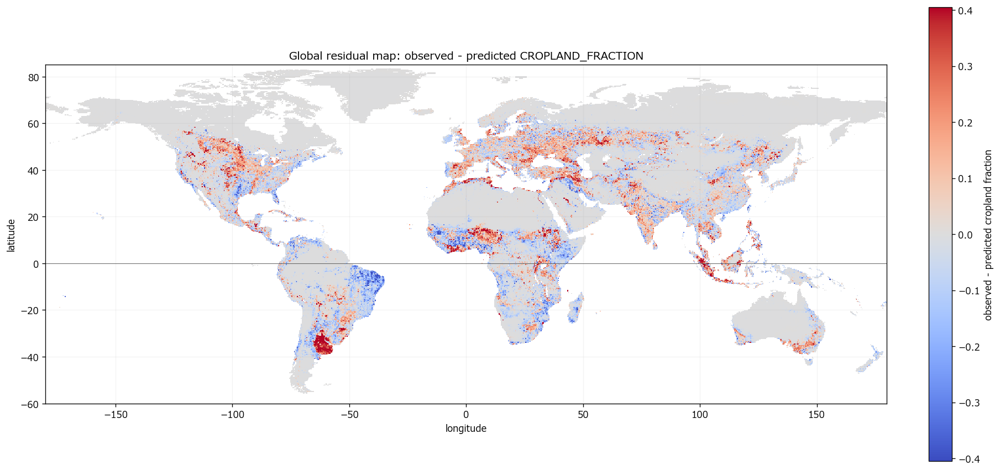

=== Spatial residual autocorrelation summary ===
                            target     n  moran_i  permutation_p_value  median_nearest_neighbor_km
                all_test_two_stage 60932   0.6728                 0.02                     11.4966
positive_test_conditional_fraction 29726   0.6865                 0.02                     11.6171

Moran's I > 0: 近いセルの残差が同じ方向に偏る
Moran's I ≈ 0: 残差の空間相関は弱い
正の残差: 過小予測、負の残差: 過大予測


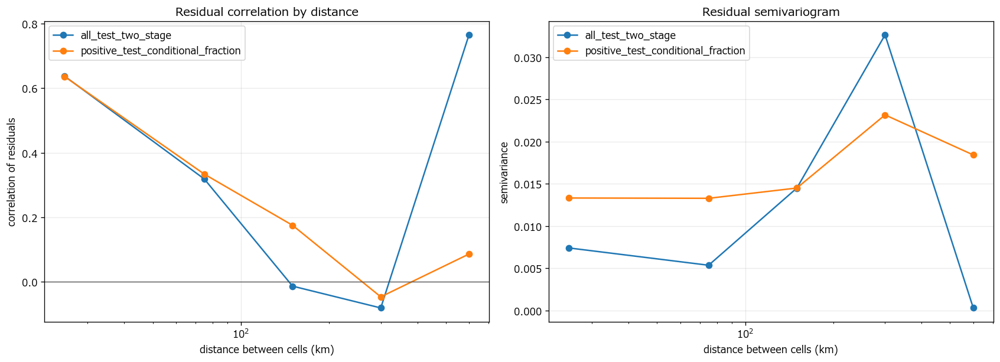


保存先: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\spatial_diagnostics


In [22]:
# ============================================================
# 残差マップ・残差の空間相関診断
# residual = observed - predicted
# 正の残差：過小予測
# 負の残差：過大予測
# ============================================================

from sklearn.neighbors import BallTree
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

EARTH_RADIUS_KM = 6371.0088
SPATIAL_DIAGNOSTIC_DIR = (
    GAEZ_DIR / "CroplandRegression" / "spatial_diagnostics"
)
SPATIAL_DIAGNOSTIC_DIR.mkdir(parents=True, exist_ok=True)


# ------------------------------------------------------------
# 1. 全球残差マップ
# ------------------------------------------------------------

if "residual_fraction" not in globals():
    raise RuntimeError(
        "residual_fraction がありません。セル15または復元セルを先に実行してください。"
    )

residual_map = np.asarray(residual_fraction)

valid_map_values = residual_map[np.isfinite(residual_map)]
map_limit = float(np.nanpercentile(np.abs(valid_map_values), 99))

plot_step = 4

fig, ax = plt.subplots(figsize=(15, 7), constrained_layout=True)

image = ax.imshow(
    residual_map[::plot_step, ::plot_step],
    origin="upper",
    extent=[
        float(lon.min()),
        float(lon.max()),
        float(lat.min()),
        float(lat.max()),
    ],
    cmap="coolwarm",
    vmin=-map_limit,
    vmax=map_limit,
    interpolation="nearest",
)

ax.axhline(0, color="0.3", linewidth=0.5)
ax.set_xlim(-180, 180)
ax.set_ylim(-60, 85)
ax.set_xlabel("longitude")
ax.set_ylabel("latitude")
ax.set_title(
    "Global residual map: observed - predicted CROPLAND_FRACTION"
)
ax.grid(alpha=0.15)

fig.colorbar(
    image,
    ax=ax,
    label="observed - predicted cropland fraction",
)

plt.show()


# ------------------------------------------------------------
# 2. テストデータの残差を作る
# ------------------------------------------------------------

# 全体の二段階モデル
# full-grid prediction と同じ expected fraction を使う
test_rows = test["row"].to_numpy(dtype=int)
test_cols = test["col"].to_numpy(dtype=int)

test_pred_expected = np.asarray(
    pred_fraction_expected[test_rows, test_cols],
    dtype=float,
)

test_residual = (
    test["cropland_fraction"].to_numpy(dtype=float)
    - test_pred_expected
)

# 農地ありセルだけの conditional fraction
positive_rows = positive_test["row"].to_numpy(dtype=int)
positive_cols = positive_test["col"].to_numpy(dtype=int)

positive_pred_fraction = np.asarray(
    pred_fraction_positive[positive_rows, positive_cols],
    dtype=float,
)

positive_residual = (
    positive_test["cropland_fraction"].to_numpy(dtype=float)
    - positive_pred_fraction
)


# ------------------------------------------------------------
# 3. k近傍グラフを作る
# ------------------------------------------------------------

def build_knn_graph(frame, k=8):
    coords_rad = np.radians(
        frame[["lat", "lon"]].to_numpy(dtype=float)
    )

    tree = BallTree(coords_rad, metric="haversine")

    neighbor_count = min(k + 1, len(frame))

    distances_rad, neighbors = tree.query(
        coords_rad,
        k=neighbor_count,
    )

    # 自分自身を除外
    distances_rad = distances_rad[:, 1:]
    neighbors = neighbors[:, 1:]

    distances_km = distances_rad * EARTH_RADIUS_KM

    return distances_km, neighbors


# ------------------------------------------------------------
# 4. Moran's I を計算
# ------------------------------------------------------------

def morans_i_knn(
    residuals,
    neighbors,
    distances_km,
    n_permutations=49,
    random_state=42,
):
    residuals = np.asarray(residuals, dtype=float)

    valid = np.isfinite(residuals)
    if not valid.all():
        raise ValueError("残差にNaNまたはinfがあります。")

    n = len(residuals)

    centered = residuals - residuals.mean()

    # 距離加重
    weights = 1.0 / np.maximum(distances_km, 1e-6)

    weight_sum = weights.sum()

    numerator = (
        weights
        * centered[neighbors]
        * centered[:, None]
    ).sum()

    denominator = np.sum(centered ** 2)

    moran_i = (
        n
        / weight_sum
        * numerator
        / denominator
    )

    permutation_p = np.nan

    if n_permutations and n_permutations > 0:
        rng = np.random.default_rng(random_state)
        permuted_values = []

        for _ in range(n_permutations):
            permuted = rng.permutation(centered)

            perm_num = (
                weights
                * permuted[neighbors]
                * centered[:, None]
            ).sum()

            perm_i = (
                n
                / weight_sum
                * perm_num
                / denominator
            )

            permuted_values.append(perm_i)

        permuted_values = np.asarray(permuted_values)

        permutation_p = (
            1
            + np.sum(
                np.abs(permuted_values)
                >= abs(moran_i)
            )
        ) / (len(permuted_values) + 1)

    return float(moran_i), float(permutation_p)


# ------------------------------------------------------------
# 5. 距離別の残差相関・セミバリオグラム
# ------------------------------------------------------------

def residual_distance_table(
    residuals,
    distances_km,
    neighbors,
    distance_bins_km,
):
    residuals = np.asarray(residuals, dtype=float)

    source_index = np.repeat(
        np.arange(len(residuals)),
        neighbors.shape[1],
    )
    target_index = neighbors.ravel()
    pair_distance = distances_km.ravel()

    source_residual = residuals[source_index]
    target_residual = residuals[target_index]

    rows = []

    for left, right in zip(
        distance_bins_km[:-1],
        distance_bins_km[1:],
    ):
        mask = (
            (pair_distance >= left)
            & (pair_distance < right)
        )

        if mask.sum() < 20:
            continue

        x = source_residual[mask]
        y = target_residual[mask]

        if np.std(x) == 0 or np.std(y) == 0:
            residual_corr = np.nan
        else:
            residual_corr = float(np.corrcoef(x, y)[0, 1])

        semivariance = float(
            0.5 * np.mean((x - y) ** 2)
        )

        rows.append(
            {
                "distance_min_km": left,
                "distance_max_km": right,
                "distance_mid_km": (left + right) / 2,
                "n_neighbor_pairs": int(mask.sum()),
                "residual_correlation": residual_corr,
                "semivariance": semivariance,
            }
        )

    return pd.DataFrame(rows)


# ------------------------------------------------------------
# 6. 全セル残差・positive残差を診断
# ------------------------------------------------------------

K_NEIGHBORS = 8
N_PERMUTATIONS = 49

distance_bins = np.array(
    [
        0,
        50,
        100,
        200,
        400,
        800,
        1600,
        3200,
        6400,
        12800,
        20000,
    ],
    dtype=float,
)


diagnostic_results = []
distance_tables = []

diagnostic_inputs = [
    (
        "all_test_two_stage",
        test,
        test_residual,
    ),
    (
        "positive_test_conditional_fraction",
        positive_test,
        positive_residual,
    ),
]

for label, frame, residuals in diagnostic_inputs:
    distances_km, neighbors = build_knn_graph(
        frame,
        k=K_NEIGHBORS,
    )

    moran_i, permutation_p = morans_i_knn(
        residuals,
        neighbors,
        distances_km,
        n_permutations=N_PERMUTATIONS,
        random_state=42,
    )

    distance_table = residual_distance_table(
        residuals,
        distances_km,
        neighbors,
        distance_bins,
    )

    distance_table["target"] = label
    distance_tables.append(distance_table)

    diagnostic_results.append(
        {
            "target": label,
            "n": len(frame),
            "moran_i": moran_i,
            "permutation_p_value": permutation_p,
            "median_nearest_neighbor_km": float(
                np.median(distances_km[:, 0])
            ),
        }
    )

diagnostic_summary = pd.DataFrame(diagnostic_results)
distance_correlation_table = pd.concat(
    distance_tables,
    ignore_index=True,
)

print("=== Spatial residual autocorrelation summary ===")
print(
    diagnostic_summary.round(4).to_string(index=False)
)

print(
    "\nMoran's I > 0: 近いセルの残差が同じ方向に偏る"
)
print(
    "Moran's I ≈ 0: 残差の空間相関は弱い"
)
print(
    "正の残差: 過小予測、負の残差: 過大予測"
)


# ------------------------------------------------------------
# 7. 距離別の残差相関を図示
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    2,
    figsize=(14, 5),
    constrained_layout=True,
)

for target_name, group in distance_correlation_table.groupby(
    "target"
):
    group = group.sort_values("distance_mid_km")

    axes[0].plot(
        group["distance_mid_km"],
        group["residual_correlation"],
        marker="o",
        label=target_name,
    )

    axes[1].plot(
        group["distance_mid_km"],
        group["semivariance"],
        marker="o",
        label=target_name,
    )

axes[0].axhline(0, color="0.3", linewidth=0.8)
axes[0].set_xscale("log")
axes[0].set_xlabel("distance between cells (km)")
axes[0].set_ylabel("correlation of residuals")
axes[0].set_title("Residual correlation by distance")
axes[0].grid(alpha=0.25)
axes[0].legend()

axes[1].set_xscale("log")
axes[1].set_xlabel("distance between cells (km)")
axes[1].set_ylabel("semivariance")
axes[1].set_title("Residual semivariogram")
axes[1].grid(alpha=0.25)
axes[1].legend()

plt.show()


# ------------------------------------------------------------
# 8. 保存
# ------------------------------------------------------------

diagnostic_summary.to_csv(
    SPATIAL_DIAGNOSTIC_DIR
    / "residual_spatial_autocorrelation_summary.csv",
    index=False,
    encoding="utf-8-sig",
)

distance_correlation_table.to_csv(
    SPATIAL_DIAGNOSTIC_DIR
    / "residual_distance_correlation.csv",
    index=False,
    encoding="utf-8-sig",
)

print(
    "\n保存先:",
    SPATIAL_DIAGNOSTIC_DIR,
)

=== Distance-bin diagnostics ===
                            target  distance_bin  distance_median_km  distance_min_km  distance_max_km  pair_count  residual_correlation  semivariance
                all_test_two_stage             1              9.2661           1.0824          11.1277       40622                0.7845        0.0039
                all_test_two_stage             2             12.8251          11.1278          15.7254       40622                0.7342        0.0056
                all_test_two_stage             3             18.4621          15.7256          18.9770       40624                0.6884        0.0065
                all_test_two_stage             4             20.0568          18.9770          20.6942       40622                0.6697        0.0074
                all_test_two_stage             5             22.6505          20.6943          24.5845       40617                0.6264        0.0075
                all_test_two_stage             6             

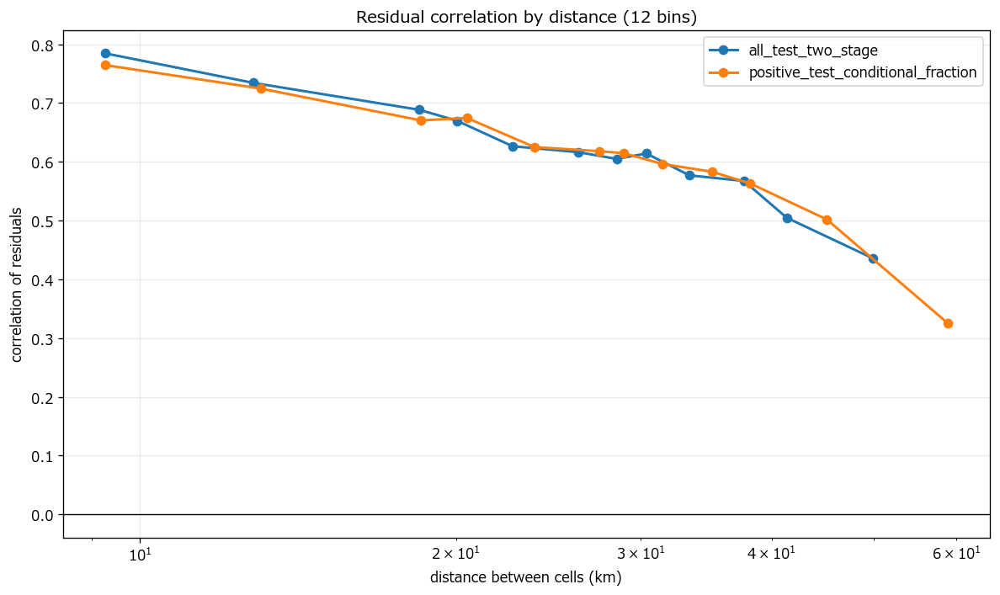

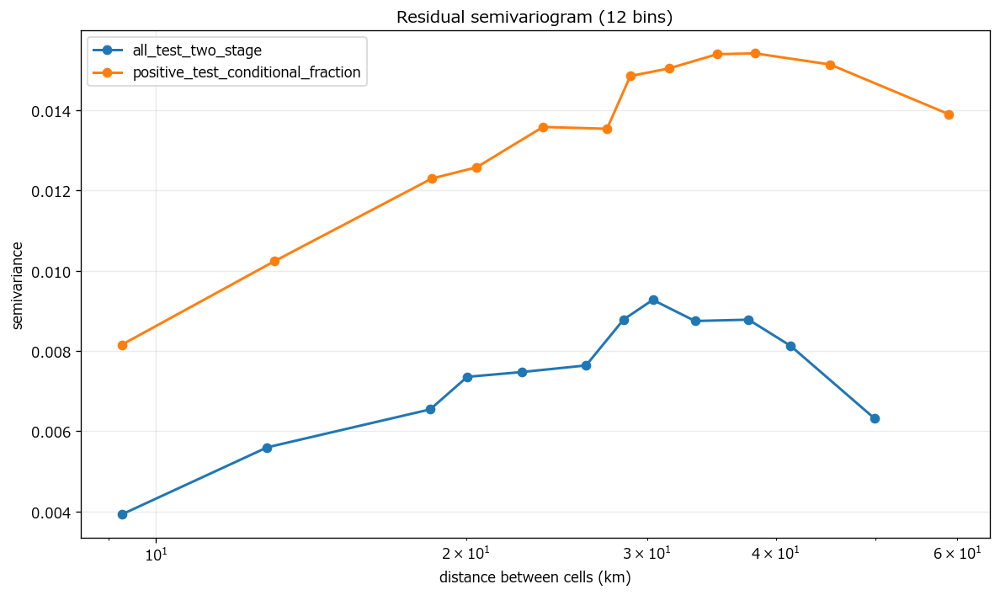


保存先: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\spatial_diagnostics\residual_distance_diagnostics_12bins.csv


In [23]:
# ============================================================
# 距離帯を増やした残差相関・セミバリオグラム
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.neighbors import BallTree

# 設定
N_DISTANCE_BINS = 12   # 5 → 12距離帯に変更
K_NEIGHBORS = 8        # 前回と同じ近傍数に合わせる
EARTH_RADIUS_KM = 6371.0088

DIAG_DIR = Path(
    r"C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\spatial_diagnostics"
)
DIAG_DIR.mkdir(parents=True, exist_ok=True)


# ------------------------------------------------------------
# 残差を作成
# ------------------------------------------------------------

# 全テストセルの二段階予測
global_fraction_test_all = np.clip(
    reg.predict(test[feature_cols]),
    0,
    1,
)

expected_test = (
    np.asarray(proba_test, dtype=float)
    * np.asarray(global_fraction_test_all, dtype=float)
)

residual_all = (
    test["cropland_fraction"].to_numpy(dtype=float)
    - expected_test
)

# 実際に農地があるセルだけの条件付き回帰残差
residual_positive = (
    positive_test["cropland_fraction"].to_numpy(dtype=float)
    - np.asarray(reg_pred, dtype=float)
)


# ------------------------------------------------------------
# k近傍セルのペアを作成
# ------------------------------------------------------------

def make_knn_residual_pairs(frame, residual, k=8):
    work = frame[["lat", "lon"]].copy()
    residual = np.asarray(residual, dtype=float)

    valid = (
        np.isfinite(work["lat"].to_numpy())
        & np.isfinite(work["lon"].to_numpy())
        & np.isfinite(residual)
    )

    coords_deg = work.to_numpy(dtype=float)[valid]
    residual = residual[valid]

    coords_rad = np.radians(coords_deg)

    if len(coords_rad) <= k:
        raise ValueError(
            f"セル数 {len(coords_rad)} に対して k={k} は大きすぎます。"
        )

    tree = BallTree(coords_rad, metric="haversine")

    # 自分自身を含めて検索し、1番目を自分自身として除外
    distances, indices = tree.query(
        coords_rad,
        k=min(k + 1, len(coords_rad)),
    )

    distances = distances[:, 1:]
    indices = indices[:, 1:]

    distances_km = distances * EARTH_RADIUS_KM

    residual_i = np.repeat(
        residual,
        distances.shape[1],
    )

    residual_j = residual[indices.ravel()]
    distance_km = distances_km.ravel()

    valid_pair = (
        np.isfinite(distance_km)
        & np.isfinite(residual_i)
        & np.isfinite(residual_j)
        & (distance_km > 0)
    )

    return (
        distance_km[valid_pair],
        residual_i[valid_pair],
        residual_j[valid_pair],
    )


# ------------------------------------------------------------
# 距離帯ごとの統計量を計算
# ------------------------------------------------------------

def calculate_distance_statistics(
    frame,
    residual,
    target_name,
    n_bins=12,
    k_neighbors=8,
):
    distance_km, residual_i, residual_j = make_knn_residual_pairs(
        frame,
        residual,
        k=k_neighbors,
    )

    # 距離の分位点で距離帯を作る
    # 各距離帯のペア数が極端に偏らないようにする
    quantile_edges = np.quantile(
        distance_km,
        np.linspace(0, 1, n_bins + 1),
    )

    quantile_edges = np.unique(quantile_edges)

    if len(quantile_edges) < 3:
        raise ValueError("距離帯を作れるだけの距離の種類がありません。")

    bin_id = np.digitize(
        distance_km,
        quantile_edges[1:-1],
        right=True,
    )

    results = []

    for current_bin in sorted(np.unique(bin_id)):
        mask = bin_id == current_bin

        d = distance_km[mask]
        r_i = residual_i[mask]
        r_j = residual_j[mask]

        if len(d) < 5:
            correlation = np.nan
        elif np.std(r_i) == 0 or np.std(r_j) == 0:
            correlation = np.nan
        else:
            correlation = float(np.corrcoef(r_i, r_j)[0, 1])

        semivariance = float(
            0.5 * np.mean((r_i - r_j) ** 2)
        )

        left = quantile_edges[current_bin]
        right = quantile_edges[current_bin + 1]

        results.append(
            {
                "target": target_name,
                "distance_bin": int(current_bin + 1),
                "distance_median_km": float(np.median(d)),
                "distance_min_km": float(np.min(d)),
                "distance_max_km": float(np.max(d)),
                "pair_count": int(len(d)),
                "residual_correlation": correlation,
                "semivariance": semivariance,
                "residual_sd_left": float(np.std(r_i)),
                "residual_sd_right": float(np.std(r_j)),
            }
        )

    return pd.DataFrame(results)


# ------------------------------------------------------------
# 2種類の残差について計算
# ------------------------------------------------------------

distance_stats_all = calculate_distance_statistics(
    frame=test,
    residual=residual_all,
    target_name="all_test_two_stage",
    n_bins=N_DISTANCE_BINS,
    k_neighbors=K_NEIGHBORS,
)

distance_stats_positive = calculate_distance_statistics(
    frame=positive_test,
    residual=residual_positive,
    target_name="positive_test_conditional_fraction",
    n_bins=N_DISTANCE_BINS,
    k_neighbors=K_NEIGHBORS,
)

distance_stats = pd.concat(
    [
        distance_stats_all,
        distance_stats_positive,
    ],
    ignore_index=True,
)


# ------------------------------------------------------------
# 距離帯ごとの数値を表示
# ------------------------------------------------------------

print("=== Distance-bin diagnostics ===")
print(
    distance_stats[
        [
            "target",
            "distance_bin",
            "distance_median_km",
            "distance_min_km",
            "distance_max_km",
            "pair_count",
            "residual_correlation",
            "semivariance",
        ]
    ]
    .round(4)
    .to_string(index=False)
)


# ------------------------------------------------------------
# 左図：距離ごとの残差相関
# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(10, 6))

for target_name, group in distance_stats.groupby("target"):
    group = group.sort_values("distance_median_km")

    ax.plot(
        group["distance_median_km"],
        group["residual_correlation"],
        marker="o",
        linewidth=1.8,
        label=target_name,
    )

ax.axhline(0, color="black", linewidth=0.8)
ax.set_xscale("log")
ax.set_xlabel("distance between cells (km)")
ax.set_ylabel("correlation of residuals")
ax.set_title(
    f"Residual correlation by distance ({N_DISTANCE_BINS} bins)"
)
ax.grid(alpha=0.25)
ax.legend()
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 右図：セミバリオグラム
# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(10, 6))

for target_name, group in distance_stats.groupby("target"):
    group = group.sort_values("distance_median_km")

    ax.plot(
        group["distance_median_km"],
        group["semivariance"],
        marker="o",
        linewidth=1.8,
        label=target_name,
    )

ax.set_xscale("log")
ax.set_xlabel("distance between cells (km)")
ax.set_ylabel("semivariance")
ax.set_title(
    f"Residual semivariogram ({N_DISTANCE_BINS} bins)"
)
ax.grid(alpha=0.25)
ax.legend()
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 保存
# ------------------------------------------------------------

output_path = DIAG_DIR / (
    f"residual_distance_diagnostics_{N_DISTANCE_BINS}bins.csv"
)

distance_stats.to_csv(
    output_path,
    index=False,
    encoding="utf-8-sig",
)

print("\n保存先:", output_path)

## 20 いまいれている変数をあらためて可視化

保存: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\feature_maps\terrain_and_constraint_global_feature_maps.png


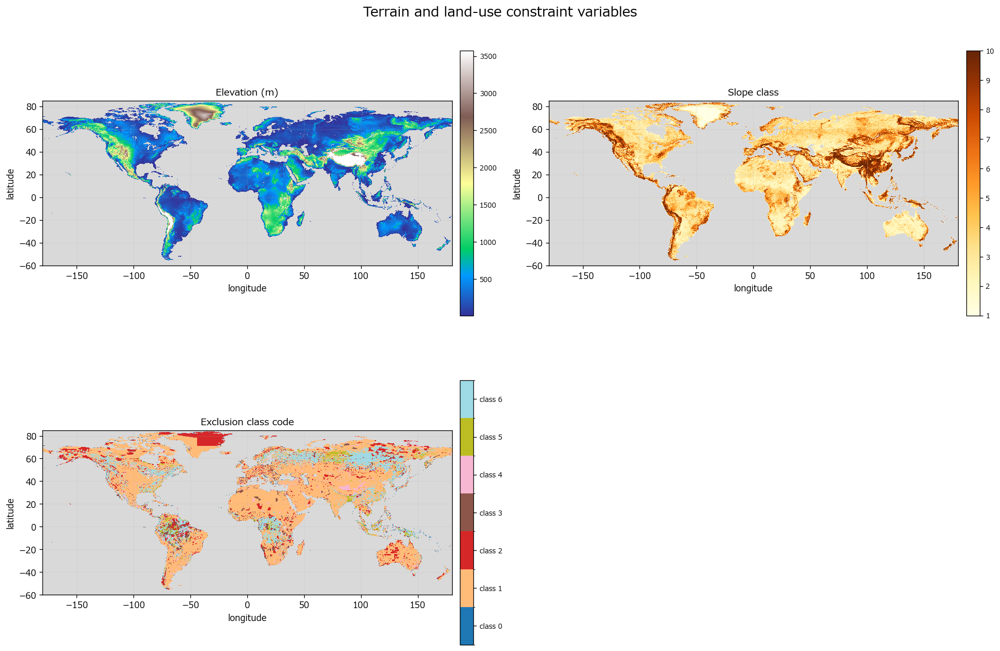

保存: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\feature_maps\population_and_access_global_feature_maps.png


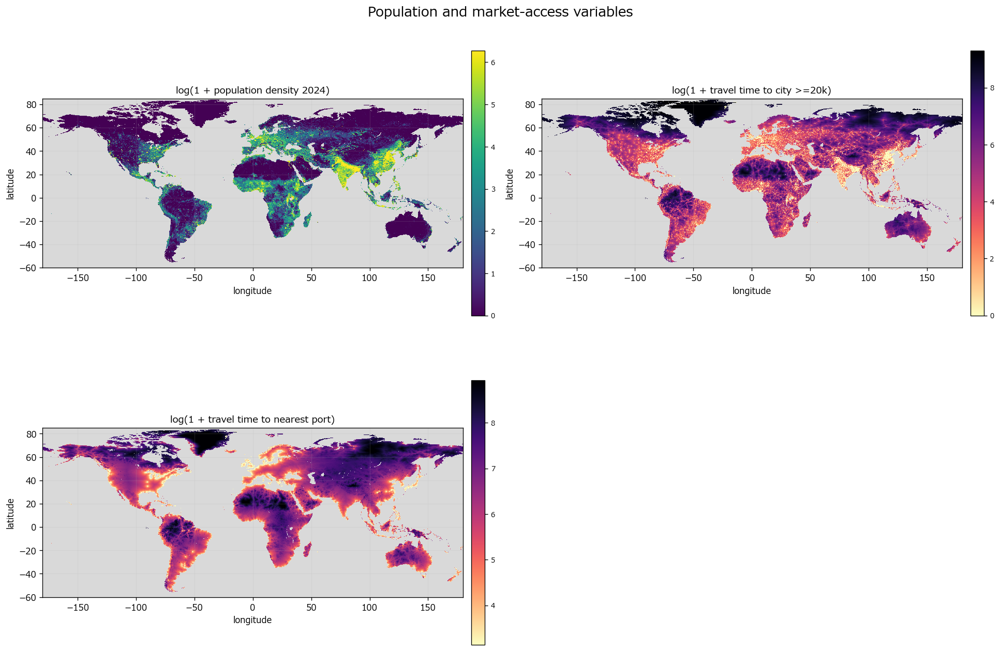

保存: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\feature_maps\water_resources_global_feature_maps.png


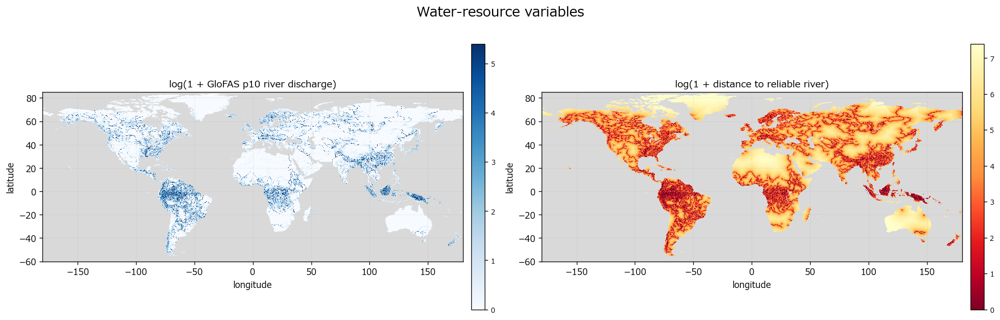

保存: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\feature_maps\crop_potential_global_feature_maps.png


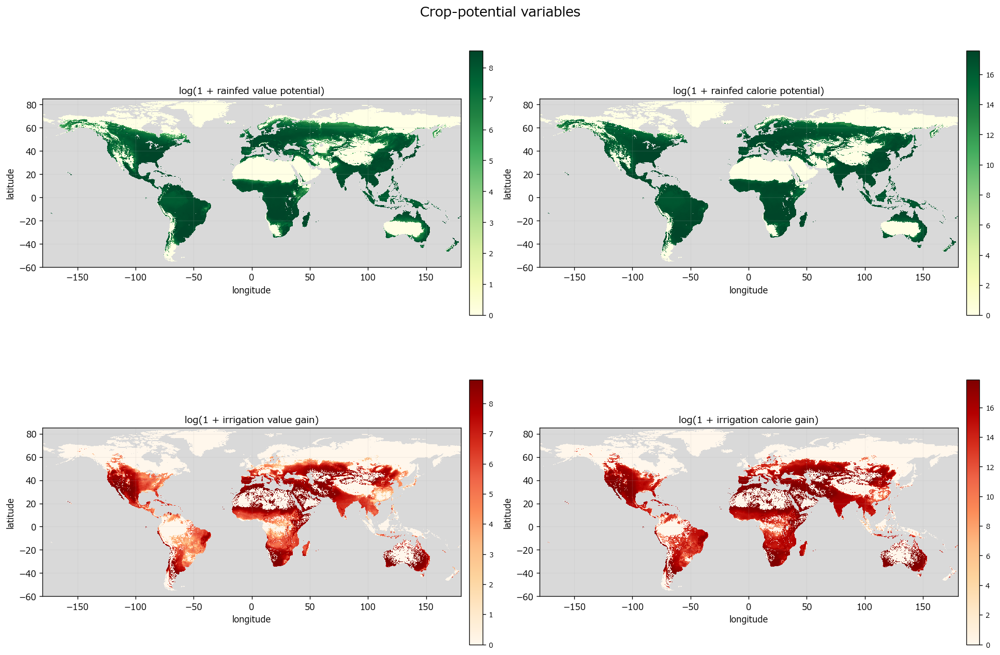


=== 全球要約 ===
                        variable  valid_cells    min    p01   median     mean       p99       max
                     elevation_m      2215635 -387.0 5.0000 372.0000 662.2254 4565.0000 6393.0000
                           slope      2215635    0.0 1.0000   3.0000   4.2472   10.0000   10.0000
                 exclusion_class      2215635    0.0 0.0000   1.0000   2.1396    6.0000    6.0000
            log_pop_density_2024      2215635    0.0 0.0000   0.2131   1.2968    6.8392   11.5129
           log_city_time_20k_min      2215635    0.0 0.0000   5.4848   5.3830    9.6310   10.1336
           log_port_time_any_min      2215635    0.0 2.5649   6.6896   6.5356    9.3033    9.9374
             log_glofas_p10_2020      2215635    0.0 0.0000   0.0078   0.6261    6.4198   11.3514
    log_distance_river_gt10_2020      2215635    0.0 0.0000   4.4292   4.2418    7.5173    8.9060
          log_rainfed_value_top5      2215635    0.0 0.0000   6.9120   4.5417    8.5864    8.8350
      

In [24]:
# ============================================================
# 現在のfeature_colsをグループ別に全球可視化
# ============================================================

from pathlib import Path
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm

# -----------------------------
# パス
# -----------------------------

ROOT = Path(r"C:\masterresearch\Comparative_advantage")
GAEZ_DIR = ROOT / "GAEZ"
HYDE_DIR = ROOT / "HYDE3.4"
CROPLAND_DIR = HYDE_DIR / "cropland_npys"
DIST_DIR = ROOT / "distance_to_cities"
GLOFAS_DIR = ROOT / "GloFAS" / "processed_5min"
FEATURE_CACHE = GAEZ_DIR / "CroplandRegression" / "features_cache"

MAP_DIR = GAEZ_DIR / "CroplandRegression" / "feature_maps"
MAP_DIR.mkdir(parents=True, exist_ok=True)

MAP_STEP = 2  # 2なら半分の解像度で表示。元データは変更しない。


# -----------------------------
# 補助関数
# -----------------------------

def safe_log1p_local(array):
    array = np.asarray(array, dtype=np.float32)
    array = np.where(
        np.isfinite(array) & (array > 0),
        array,
        0.0,
    )
    return np.log1p(array).astype(np.float32)


def load_npy_if_needed(variable_name, path):
    if variable_name in globals():
        return globals()[variable_name]

    if not path.exists():
        raise FileNotFoundError(f"ファイルがありません: {path}")

    value = np.load(path, mmap_mode="r")
    globals()[variable_name] = value
    print("loaded:", variable_name, path.name)
    return value


# -----------------------------
# 緯度経度・対象データ
# -----------------------------

lat = load_npy_if_needed(
    "lat",
    CROPLAND_DIR / "lat.npy",
)

lon = load_npy_if_needed(
    "lon",
    CROPLAND_DIR / "lon.npy",
)

SHAPE = (len(lat), len(lon))

if "cropland_2024" not in globals():
    cropland_raw = np.load(
        CROPLAND_DIR / "cropland_fraction_1950_2024.npy",
        mmap_mode="r",
    )
    cropland_years = np.load(
        CROPLAND_DIR / "years.npy",
    )
    year_index = int(np.where(cropland_years == 2024)[0][0])
    cropland_2024 = np.asarray(
        cropland_raw[year_index],
        dtype=np.float32,
    )

# -----------------------------
# 現在のfeature_colsに使っているデータ
# -----------------------------

elevation_m = load_npy_if_needed(
    "elevation_m",
    FEATURE_CACHE / "elevation_5min.npy",
)

slope = load_npy_if_needed(
    "slope",
    FEATURE_CACHE / "slope_5min.npy",
)

exclusion = load_npy_if_needed(
    "exclusion",
    FEATURE_CACHE / "exclusion_5min_mode.npy",
)

pop_density_2024 = load_npy_if_needed(
    "pop_density_2024",
    FEATURE_CACHE / "population_density_2024.npy",
)

city_time_20k_min = load_npy_if_needed(
    "city_time_20k_min",
    DIST_DIR / "cities_10_1_12deg_min.npy",
)

port_time_any_min = load_npy_if_needed(
    "port_time_any_min",
    DIST_DIR / "ports_05_1_12deg_min.npy",
)

glofas_p10 = load_npy_if_needed(
    "glofas_p10",
    GLOFAS_DIR / "p10_discharge_max_5min_2020.npy",
)

distance_river_gt10 = load_npy_if_needed(
    "distance_river_gt10",
    GLOFAS_DIR / "distance_to_reliable_river_p10_gt_10_m3s_km_5min_2020.npy",
)

rainfed_value_top5 = load_npy_if_needed(
    "rainfed_value_top5",
    FEATURE_CACHE / "rainfed_value_top5_usd_per_ha_checked_36crops.npy",
)

irrigated_value_top5 = load_npy_if_needed(
    "irrigated_value_top5",
    FEATURE_CACHE / "irrigated_value_top5_usd_per_ha_checked_36crops.npy",
)

rainfed_calorie_top5 = load_npy_if_needed(
    "rainfed_calorie_top5",
    FEATURE_CACHE / "rainfed_calorie_top5_kcal_per_ha_checked_36crops.npy",
)

irrigated_calorie_top5 = load_npy_if_needed(
    "irrigated_calorie_top5",
    FEATURE_CACHE / "irrigated_calorie_top5_kcal_per_ha_checked_36crops.npy",
)


# -----------------------------
# 海域などをマスク
# -----------------------------

land_mask_for_map = (
    np.isfinite(elevation_m)
    & np.isfinite(cropland_2024)
    & np.isfinite(pop_density_2024)
    & (pop_density_2024 >= 0)
)


# -----------------------------
# モデルに実際に入っている12変数を作成
# -----------------------------

feature_maps = {
    # 1. 地形・制約
    "elevation_m": np.asarray(elevation_m, dtype=np.float32),
    "slope": np.asarray(slope, dtype=np.float32),
    "exclusion_class": np.asarray(exclusion, dtype=np.float32),

    # 2. 人口・アクセス
    "log_pop_density_2024": safe_log1p_local(pop_density_2024),
    "log_city_time_20k_min": safe_log1p_local(city_time_20k_min),
    "log_port_time_any_min": safe_log1p_local(port_time_any_min),

    # 3. 水資源
    "log_glofas_p10_2020": safe_log1p_local(glofas_p10),
    "log_distance_river_gt10_2020": safe_log1p_local(distance_river_gt10),

    # 4. 作物ポテンシャル
    "log_rainfed_value_top5": safe_log1p_local(rainfed_value_top5),
    "log_rainfed_calorie_top5": safe_log1p_local(rainfed_calorie_top5),

    "log_irrigation_value_gain_top5": safe_log1p_local(
        np.maximum(
            np.asarray(irrigated_value_top5, dtype=np.float32)
            - np.asarray(rainfed_value_top5, dtype=np.float32),
            0,
        )
    ),

    "log_irrigation_calorie_gain_top5": safe_log1p_local(
        np.maximum(
            np.asarray(irrigated_calorie_top5, dtype=np.float32)
            - np.asarray(rainfed_calorie_top5, dtype=np.float32),
            0,
        )
    ),
}


# 海域・欠測部分を非表示にする
for name in feature_maps:
    array = np.asarray(feature_maps[name], dtype=np.float32).copy()
    array[~land_mask_for_map] = np.nan

    if name == "exclusion_class":
        array[array < 0] = np.nan

    feature_maps[name] = array


# -----------------------------
# 表示設定
# -----------------------------

EXTENT = [
    float(lon.min()),
    float(lon.max()),
    float(lat.min()),
    float(lat.max()),
]


def get_bad_cmap(cmap_name):
    cmap = plt.get_cmap(cmap_name).copy()
    cmap.set_bad("#d9d9d9")
    return cmap


def draw_continuous_map(fig, ax, array, title, cmap_name):
    plot_array = array[::MAP_STEP, ::MAP_STEP]
    cmap = get_bad_cmap(cmap_name)

    values = plot_array[np.isfinite(plot_array)]

    if len(values) == 0:
        ax.set_axis_off()
        return

    vmin, vmax = np.nanpercentile(values, [2, 98])

    if np.isclose(vmin, vmax):
        vmin = float(np.nanmin(values))
        vmax = float(np.nanmax(values) + 1e-6)

    image = ax.imshow(
        plot_array,
        extent=EXTENT,
        origin="upper",
        interpolation="nearest",
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
    )

    ax.set_title(title, fontsize=11)
    ax.set_xlim(-180, 180)
    ax.set_ylim(-60, 85)
    ax.set_xlabel("longitude")
    ax.set_ylabel("latitude")
    ax.grid(alpha=0.15)

    cbar = fig.colorbar(
        image,
        ax=ax,
        shrink=0.82,
        pad=0.02,
    )
    cbar.ax.tick_params(labelsize=8)


def draw_categorical_map(fig, ax, array, title):
    plot_array = array[::MAP_STEP, ::MAP_STEP]
    valid_values = plot_array[np.isfinite(plot_array)]

    if len(valid_values) == 0:
        ax.set_axis_off()
        return

    classes = np.sort(
        np.unique(valid_values.astype(int))
    )

    # 実際のカテゴリコードを0,1,2,...の表示位置に変換
    encoded = np.full(plot_array.shape, np.nan, dtype=float)

    for position, class_code in enumerate(classes):
        encoded[plot_array == class_code] = position

    cmap = plt.get_cmap("tab20", len(classes)).copy()
    cmap.set_bad("#d9d9d9")

    norm = BoundaryNorm(
        np.arange(-0.5, len(classes) + 0.5, 1),
        len(classes),
    )

    image = ax.imshow(
        encoded,
        extent=EXTENT,
        origin="upper",
        interpolation="nearest",
        cmap=cmap,
        norm=norm,
    )

    ax.set_title(title, fontsize=11)
    ax.set_xlim(-180, 180)
    ax.set_ylim(-60, 85)
    ax.set_xlabel("longitude")
    ax.set_ylabel("latitude")
    ax.grid(alpha=0.15)

    cbar = fig.colorbar(
        image,
        ax=ax,
        ticks=np.arange(len(classes)),
        shrink=0.82,
        pad=0.02,
    )
    cbar.ax.set_yticklabels(
        [f"class {int(code)}" for code in classes]
    )
    cbar.ax.tick_params(labelsize=8)


def plot_group(group_name, title, specifications, ncols=2):
    n_panels = len(specifications)
    nrows = math.ceil(n_panels / ncols)

    fig, axes = plt.subplots(
        nrows,
        ncols,
        figsize=(16, 5.3 * nrows),
        constrained_layout=True,
    )

    axes = np.atleast_1d(axes).ravel()

    fig.suptitle(
        title,
        fontsize=16,
        y=1.02,
    )

    for ax, (variable_name, label, plot_type, cmap_name) in zip(
        axes,
        specifications,
    ):
        if plot_type == "categorical":
            draw_categorical_map(
                fig,
                ax,
                feature_maps[variable_name],
                label,
            )
        else:
            draw_continuous_map(
                fig,
                ax,
                feature_maps[variable_name],
                label,
                cmap_name,
            )

    for ax in axes[n_panels:]:
        ax.set_visible(False)

    output_path = MAP_DIR / f"{group_name}_global_feature_maps.png"

    fig.savefig(
        output_path,
        dpi=220,
        bbox_inches="tight",
    )

    print("保存:", output_path)
    plt.show()


# -----------------------------
# 4グループの地図を作成
# -----------------------------

plot_group(
    group_name="terrain_and_constraint",
    title="Terrain and land-use constraint variables",
    specifications=[
        (
            "elevation_m",
            "Elevation (m)",
            "continuous",
            "terrain",
        ),
        (
            "slope",
            "Slope class",
            "continuous",
            "YlOrBr",
        ),
        (
            "exclusion_class",
            "Exclusion class code",
            "categorical",
            "tab20",
        ),
    ],
)


plot_group(
    group_name="population_and_access",
    title="Population and market-access variables",
    specifications=[
        (
            "log_pop_density_2024",
            "log(1 + population density 2024)",
            "continuous",
            "viridis",
        ),
        (
            "log_city_time_20k_min",
            "log(1 + travel time to city >=20k)",
            "continuous",
            "magma_r",
        ),
        (
            "log_port_time_any_min",
            "log(1 + travel time to nearest port)",
            "continuous",
            "magma_r",
        ),
    ],
)


plot_group(
    group_name="water_resources",
    title="Water-resource variables",
    specifications=[
        (
            "log_glofas_p10_2020",
            "log(1 + GloFAS p10 river discharge)",
            "continuous",
            "Blues",
        ),
        (
            "log_distance_river_gt10_2020",
            "log(1 + distance to reliable river)",
            "continuous",
            "YlOrRd_r",
        ),
    ],
)


plot_group(
    group_name="crop_potential",
    title="Crop-potential variables",
    specifications=[
        (
            "log_rainfed_value_top5",
            "log(1 + rainfed value potential)",
            "continuous",
            "YlGn",
        ),
        (
            "log_rainfed_calorie_top5",
            "log(1 + rainfed calorie potential)",
            "continuous",
            "YlGn",
        ),
        (
            "log_irrigation_value_gain_top5",
            "log(1 + irrigation value gain)",
            "continuous",
            "OrRd",
        ),
        (
            "log_irrigation_calorie_gain_top5",
            "log(1 + irrigation calorie gain)",
            "continuous",
            "OrRd",
        ),
    ],
)


# -----------------------------
# 各変数の全球要約も保存
# -----------------------------

summary_rows = []

for variable_name, array in feature_maps.items():
    values = array[np.isfinite(array)]

    summary_rows.append(
        {
            "variable": variable_name,
            "valid_cells": int(len(values)),
            "min": float(np.min(values)),
            "p01": float(np.percentile(values, 1)),
            "median": float(np.median(values)),
            "mean": float(np.mean(values)),
            "p99": float(np.percentile(values, 99)),
            "max": float(np.max(values)),
        }
    )

feature_map_summary = pd.DataFrame(summary_rows)

summary_path = MAP_DIR / "global_feature_map_summary.csv"

feature_map_summary.to_csv(
    summary_path,
    index=False,
    encoding="utf-8-sig",
)

print("\n=== 全球要約 ===")
print(feature_map_summary.round(4).to_string(index=False))
print("\n要約の保存先:", summary_path)

代表作物数: 36
gaez_code                        gaez_crop_name  gaez_crop_group
     BARL                Barley (best sub-type)          Cereals
     BSRG       Biomass sorghum (best sub-type)          Cereals
    FIMLT                         Finger millet          Cereals
     FMLT                        Foxtail millet          Cereals
     HBRL             Barley, hybernating types          Cereals
     HMZE        Maize, tropical highland types          Cereals
     HSRG      Sorghum, tropical highland types          Cereals
     HWHE              Wheat, hybernating types          Cereals
     LMZE         Maize, tropical lowland types          Cereals
     LSRG       Sorghum, tropical lowland types          Cereals
     MAIZ                 Maize (best sub-type)          Cereals
     MLLT             Millet (best millet type)          Cereals
     MZSI                         Maize, silage          Cereals
     PMLT                          Pearl millet          Cereals
     RICD      

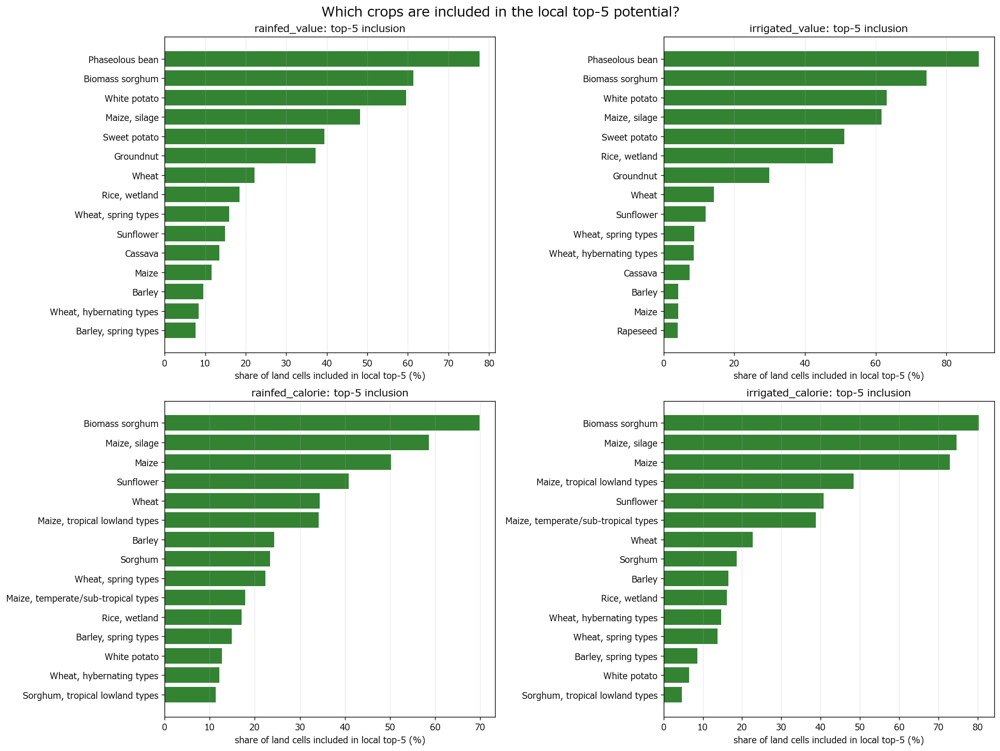

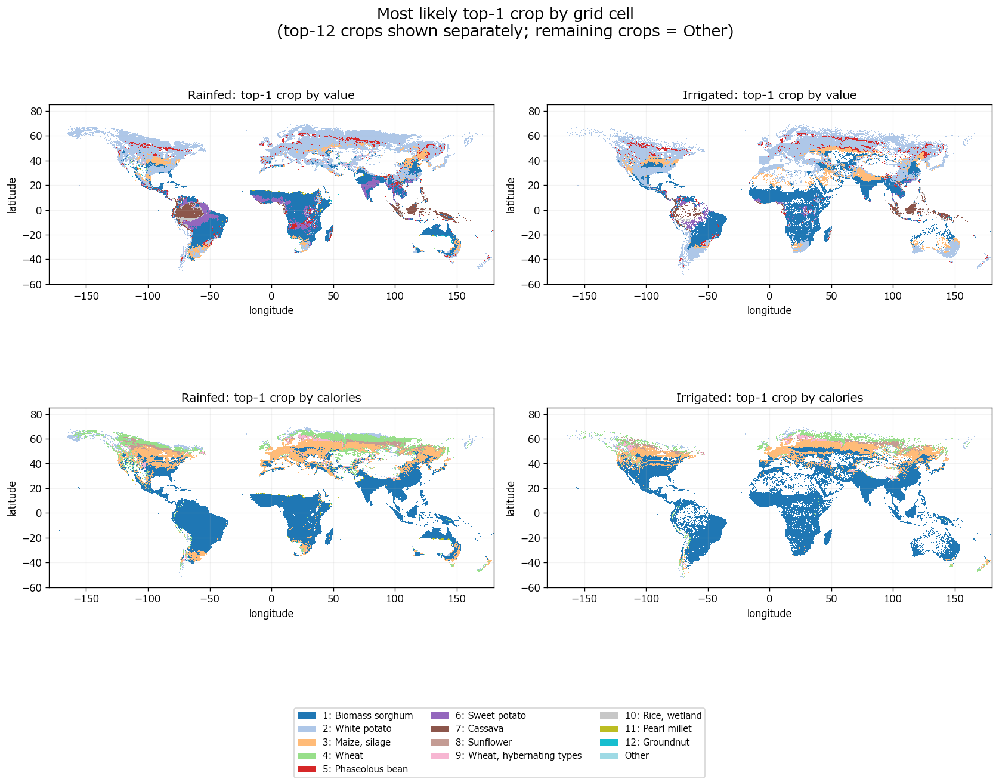


保存先:
C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\crop_identity_maps\top5_crop_frequency_by_condition.png
C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\crop_identity_maps\top1_crop_identity_maps.png
C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\crop_identity_maps\representative_crop_codebook.csv


In [30]:
# ============================================================
# 各グリッドで上位5作物に入っている作物を可視化
# ============================================================

from pathlib import Path
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ------------------------------------------------------------
# 保存先
# ------------------------------------------------------------

CROP_ID_DIR = (
    GAEZ_DIR
    / "CroplandRegression"
    / "crop_identity_maps"
)

CROP_ID_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


# ------------------------------------------------------------
# 代表作物の読み込み
# ------------------------------------------------------------

crops = pd.read_csv(
    REPRESENTATIVE_CROP_TABLE
).reset_index(drop=True)

print("代表作物数:", len(crops))
print(
    crops[
        [
            "gaez_code",
            "gaez_crop_name",
            "gaez_crop_group",
        ]
    ].to_string(index=False)
)


# ------------------------------------------------------------
# 現在のモデルで使っている4条件
# ------------------------------------------------------------

conditions = {
    "rainfed_value": {
        "folder": GAEZ_DIR / "ClimatePotentialRainfed",
        "template": "climate_potential_yield_rainfed_{code}.npy",
        "weight_col": "price_usd_per_tonne_median",
        "unit_scale": 1 / 1000,
        "title": "Rainfed: top-1 crop by value",
    },
    "irrigated_value": {
        "folder": GAEZ_DIR / "ClimatePotential",
        "template": "climate_potential_yield_{code}.npy",
        "weight_col": "price_usd_per_tonne_median",
        "unit_scale": 1 / 1000,
        "title": "Irrigated: top-1 crop by value",
    },
    "rainfed_calorie": {
        "folder": GAEZ_DIR / "ClimatePotentialRainfed",
        "template": "climate_potential_yield_rainfed_{code}.npy",
        "weight_col": "kcal_per_kg_median",
        "unit_scale": 1.0,
        "title": "Rainfed: top-1 crop by calories",
    },
    "irrigated_calorie": {
        "folder": GAEZ_DIR / "ClimatePotential",
        "template": "climate_potential_yield_{code}.npy",
        "weight_col": "kcal_per_kg_median",
        "unit_scale": 1.0,
        "title": "Irrigated: top-1 crop by calories",
    },
}


# ------------------------------------------------------------
# 利用可能な作物ファイルを確認
# ------------------------------------------------------------

condition_crop_info = {}

for condition_name, condition_info in conditions.items():

    available_rows = []
    available_arrays = []

    for _, crop_row in crops.iterrows():

        code = str(crop_row["gaez_code"])

        crop_path = (
            condition_info["folder"]
            / condition_info["template"].format(
                code=code
            )
        )

        if crop_path.exists():
            available_rows.append(crop_row)
            available_arrays.append(
                np.load(
                    crop_path,
                    mmap_mode="r",
                )
            )

    available_rows = pd.DataFrame(
        available_rows
    ).reset_index(drop=True)

    condition_crop_info[
        condition_name
    ] = {
        "rows": available_rows,
        "arrays": available_arrays,
    }

    print(
        condition_name,
        "available crops:",
        len(available_rows),
    )


# ------------------------------------------------------------
# 上位5作物を各グリッドで計算
# ------------------------------------------------------------

CHUNK_ROWS = 60
TOP_K = 5

all_results = {}

for condition_name, condition_info in conditions.items():

    print()
    print("=" * 70)
    print("Processing:", condition_name)
    print("=" * 70)

    crop_rows = condition_crop_info[
        condition_name
    ]["rows"]

    crop_arrays = condition_crop_info[
        condition_name
    ]["arrays"]

    n_crops = len(crop_rows)
    k = min(TOP_K, n_crops)

    top1_map = np.full(
        SHAPE,
        -1,
        dtype=np.int16,
    )

    top5_counts = np.zeros(
        n_crops,
        dtype=np.int64,
    )

    top1_counts = np.zeros(
        n_crops,
        dtype=np.int64,
    )

    valid_land_count = 0

    for row_start in range(
        0,
        HEIGHT,
        CHUNK_ROWS,
    ):

        row_stop = min(
            row_start + CHUNK_ROWS,
            HEIGHT,
        )

        block_height = row_stop - row_start

        # 作物 × 緯度 × 経度
        weighted_values = np.zeros(
            (
                n_crops,
                block_height,
                WIDTH,
            ),
            dtype=np.float32,
        )

        # 各作物の気候ポテンシャルを読み込む
        for crop_index, crop_array in enumerate(
            crop_arrays
        ):

            raw_values = np.asarray(
                crop_array[
                    row_start:row_stop,
                    :
                ],
                dtype=np.float32,
            )

            weight = float(
                crop_rows.iloc[
                    crop_index
                ][
                    condition_info["weight_col"]
                ]
            )

            values = (
                raw_values
                * weight
                * condition_info["unit_scale"]
            )

            values = np.where(
                np.isfinite(values) & (values > 0),
                values,
                0,
            )

            weighted_values[
                crop_index,
                :,
                :
            ] = values

        # 各セルの上位5作物
        top_indices = np.argpartition(
            weighted_values,
            -k,
            axis=0,
        )[-k:, :, :]

        top_values = np.take_along_axis(
            weighted_values,
            top_indices,
            axis=0,
        )

        # 上位5作物を値の大きい順に並べる
        order = np.argsort(
            top_values,
            axis=0,
        )[::-1, :, :]

        top_indices = np.take_along_axis(
            top_indices,
            order,
            axis=0,
        )

        top_values = np.take_along_axis(
            top_values,
            order,
            axis=0,
        )

        # 最有力作物
        top1_index = top_indices[0]
        top1_value = top_values[0]

        block_land_mask = np.asarray(
            land_mask[
                row_start:row_stop,
                :
            ],
            dtype=bool,
        )

        valid_top1 = (
            block_land_mask
            & np.isfinite(top1_value)
            & (top1_value > 0)
        )

        top1_map[
            row_start:row_stop,
            :
        ] = np.where(
            valid_top1,
            top1_index,
            -1,
        )

        valid_land_count += int(
            valid_top1.sum()
        )

        # 最有力作物の登場回数
        top1_counts += np.bincount(
            top1_index[valid_top1].ravel(),
            minlength=n_crops,
        )

        # 上位5作物への登場回数
        valid_top5 = (
            block_land_mask[None, :, :]
            & (top_values > 0)
        )

        top5_counts += np.bincount(
            top_indices[valid_top5].ravel(),
            minlength=n_crops,
        )

        if (
            row_stop % (CHUNK_ROWS * 5) == 0
            or row_stop == HEIGHT
        ):
            print(
                f"processed rows: "
                f"{row_stop:,} / {HEIGHT:,}"
            )

    # 統計表
    crop_summary = crop_rows[
        [
            "gaez_code",
            "gaez_crop_name",
            "gaez_crop_group",
        ]
    ].copy()

    crop_summary["top1_count"] = (
        top1_counts
    )

    crop_summary["top1_share_percent"] = (
        100
        * top1_counts
        / max(valid_land_count, 1)
    )

    crop_summary["top5_inclusion_count"] = (
        top5_counts
    )

    crop_summary["top5_inclusion_share_percent"] = (
        100
        * top5_counts
        / max(valid_land_count, 1)
    )

    crop_summary["top5_slot_share_percent"] = (
        100
        * top5_counts
        / max(top5_counts.sum(), 1)
    )

    crop_summary = crop_summary.sort_values(
        "top5_inclusion_share_percent",
        ascending=False,
    ).reset_index(drop=True)

    all_results[
        condition_name
    ] = {
        "top1_map": top1_map,
        "summary": crop_summary,
        "valid_land_count": valid_land_count,
    }

    # 保存
    np.save(
        CROP_ID_DIR
        / f"{condition_name}_top1_crop_index.npy",
        top1_map,
    )

    crop_summary.to_csv(
        CROP_ID_DIR
        / f"{condition_name}_crop_frequency.csv",
        index=False,
        encoding="utf-8-sig",
    )

    print()
    print(
        crop_summary[
            [
                "gaez_code",
                "gaez_crop_name",
                "top1_share_percent",
                "top5_inclusion_share_percent",
            ]
        ].head(15).round(2).to_string(index=False)
    )


# ------------------------------------------------------------
# 上位5作物への登場割合を図示
# ------------------------------------------------------------

fig, axes = plt.subplots(
    2,
    2,
    figsize=(16, 12),
    constrained_layout=True,
)

for ax, (condition_name, result) in zip(
    axes.ravel(),
    all_results.items(),
):

    summary = result["summary"].head(15)
    summary = summary.iloc[::-1]

    labels = summary[
        "gaez_crop_name"
    ].str.replace(
        " (best sub-type)",
        "",
        regex=False,
    )

    ax.barh(
        labels,
        summary[
            "top5_inclusion_share_percent"
        ],
        color="darkgreen",
        alpha=0.8,
    )

    ax.set_title(
        f"{condition_name}: top-5 inclusion"
    )

    ax.set_xlabel(
        "share of land cells included in local top-5 (%)"
    )

    ax.grid(
        axis="x",
        alpha=0.25,
    )

fig.suptitle(
    "Which crops are included in the local top-5 potential?",
    fontsize=16,
)

frequency_figure_path = (
    CROP_ID_DIR
    / "top5_crop_frequency_by_condition.png"
)

fig.savefig(
    frequency_figure_path,
    dpi=220,
    bbox_inches="tight",
)

plt.show()


# ------------------------------------------------------------
# 4条件の「最有力作物」地図
# ------------------------------------------------------------

# 4条件を合算して、全球で登場頻度が高い作物を選ぶ
combined_top1_counts = {}

for condition_name, result in all_results.items():

    summary = result["summary"]

    for _, row in summary.iterrows():

        code = row["gaez_code"]

        combined_top1_counts[code] = (
            combined_top1_counts.get(code, 0)
            + row["top1_count"]
        )

top_codes = [
    code
    for code, count in sorted(
        combined_top1_counts.items(),
        key=lambda x: x[1],
        reverse=True,
    )[:12]
]

# codeから作物名への対応
crop_name_by_code = {}

for condition_name in condition_crop_info:

    rows_condition = condition_crop_info[
        condition_name
    ]["rows"]

    for _, row in rows_condition.iterrows():

        crop_name_by_code[
            row["gaez_code"]
        ] = row["gaez_crop_name"]


# 色
n_display = len(top_codes) + 1

colors = plt.cm.tab20(
    np.linspace(
        0,
        1,
        n_display,
    )
)

display_cmap = ListedColormap(
    colors
)

legend_handles = []

for display_index, code in enumerate(
    top_codes
):

    crop_name = crop_name_by_code.get(
        code,
        code,
    )

    crop_name = crop_name.replace(
        " (best sub-type)",
        "",
    )

    legend_handles.append(
        Patch(
            facecolor=colors[display_index],
            label=f"{display_index + 1}: {crop_name}",
        )
    )

other_index = len(top_codes)

legend_handles.append(
    Patch(
        facecolor=colors[other_index],
        label="Other",
    )
)


fig, axes = plt.subplots(
    2,
    2,
    figsize=(17, 11),
)

for ax, (condition_name, result) in zip(
    axes.ravel(),
    all_results.items(),
):

    top1_map = result["top1_map"]

    crop_rows = condition_crop_info[
        condition_name
    ]["rows"]

    code_array = crop_rows[
        "gaez_code"
    ].to_numpy()

    code_to_local_index = {
        code: index
        for index, code in enumerate(
            code_array
        )
    }

    display_map = np.full(
        top1_map.shape,
        np.nan,
        dtype=np.float32,
    )

    for display_index, code in enumerate(
        top_codes
    ):

        local_index = code_to_local_index.get(
            code,
            None,
        )

        if local_index is not None:

            display_map[
                top1_map == local_index
            ] = display_index

    other_mask = (
        np.isfinite(top1_map)
        & (top1_map >= 0)
        & np.isnan(display_map)
    )

    display_map[other_mask] = (
        other_index
    )

    image = ax.imshow(
        display_map[::4, ::4],
        extent=[
            float(lon.min()),
            float(lon.max()),
            float(lat.min()),
            float(lat.max()),
        ],
        origin="upper",
        cmap=display_cmap,
        vmin=-0.5,
        vmax=n_display - 0.5,
        interpolation="nearest",
    )

    ax.set_title(
        conditions[condition_name]["title"]
    )

    ax.set_xlim(-180, 180)
    ax.set_ylim(-60, 85)
    ax.set_xlabel("longitude")
    ax.set_ylabel("latitude")
    ax.grid(alpha=0.15)

fig.legend(
    handles=legend_handles,
    loc="lower center",
    ncol=3,
    fontsize=9,
    frameon=True,
)

fig.suptitle(
    "Most likely top-1 crop by grid cell\n"
    "(top-12 crops shown separately; remaining crops = Other)",
    fontsize=16,
)

fig.subplots_adjust(
    bottom=0.20,
    top=0.90,
    hspace=0.22,
    wspace=0.12,
)

identity_figure_path = (
    CROP_ID_DIR
    / "top1_crop_identity_maps.png"
)

fig.savefig(
    identity_figure_path,
    dpi=220,
    bbox_inches="tight",
)

plt.show()


# ------------------------------------------------------------
# 代表作物一覧を保存
# ------------------------------------------------------------

crop_codebook = crops[
    [
        "gaez_code",
        "gaez_crop_name",
        "gaez_crop_group",
        "price_usd_per_tonne_median",
        "kcal_per_kg_median",
    ]
].copy()

crop_codebook.to_csv(
    CROP_ID_DIR
    / "representative_crop_codebook.csv",
    index=False,
    encoding="utf-8-sig",
)

print()
print("保存先:")
print(frequency_figure_path)
print(identity_figure_path)
print(
    CROP_ID_DIR
    / "representative_crop_codebook.csv"
)

## 21日本に注目

日本マスク: 緯度経度の範囲を使用
=== Japan CROPLAND_FRACTION summary ===
region  n_cells  observed_mean  predicted_mean  bias_observed_minus_predicted     mae    rmse      r2  area_weighted_mae  area_weighted_bias  observed_area_weighted_mean  predicted_area_weighted_mean
 Japan    18450         0.1975          0.2009                        -0.0034 0.08085 0.11932 0.74238            0.08024            -0.00413                      0.19349                       0.19762
保存: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\japan_diagnostics\japan_cropland_fraction_maps.png


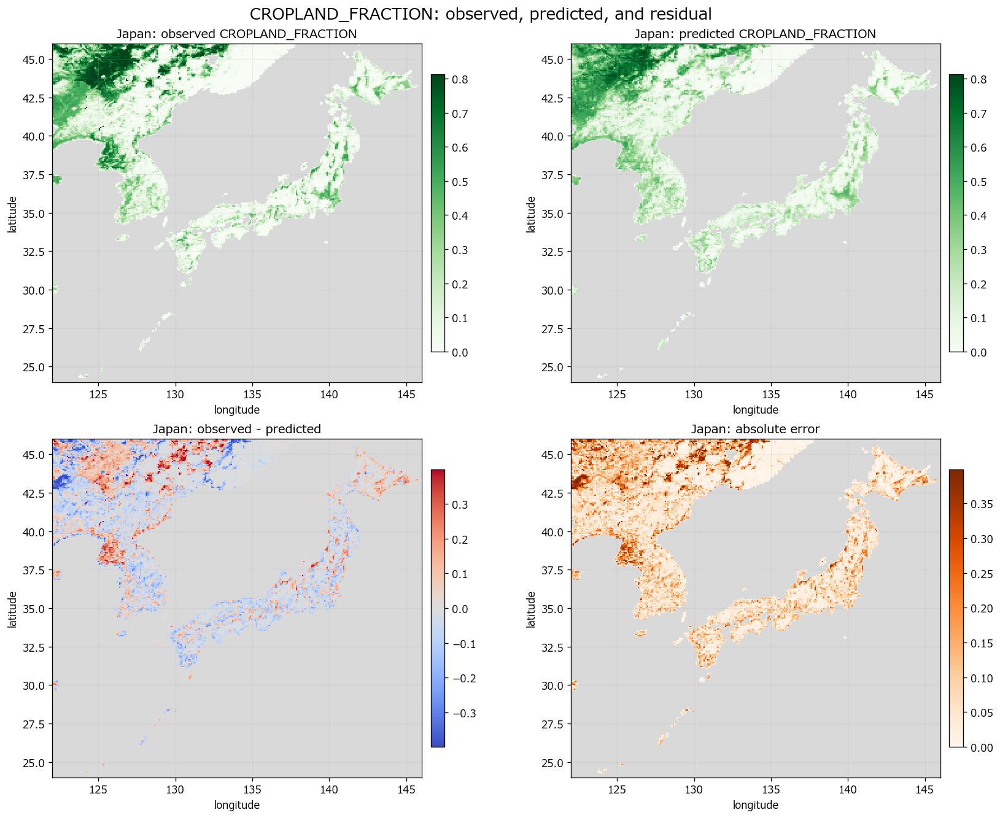

保存: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\japan_diagnostics\japan_cropland_fraction_diagnostics.png


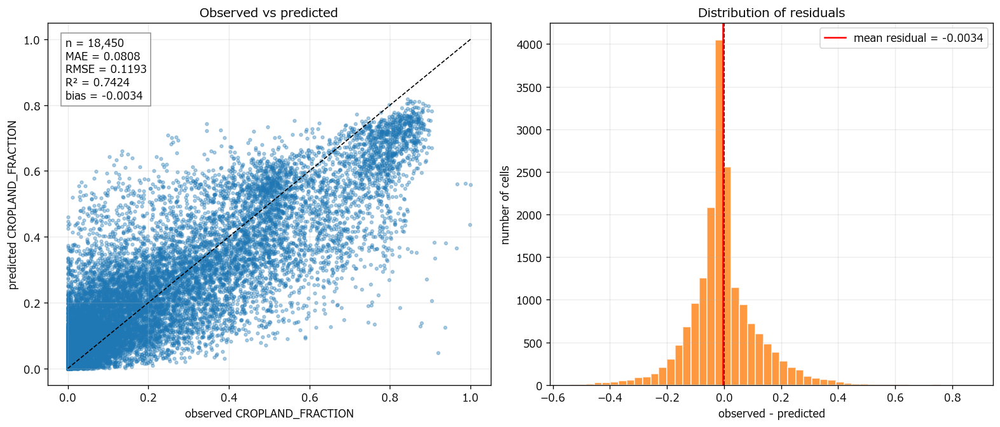

保存: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\japan_diagnostics\japan_cropland_fraction_cell_residuals.csv
保存: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\japan_diagnostics\japan_cropland_fraction_summary.csv


In [ ]:
# ============================================================
# 日本のCROPLAND_FRACTION
# 観測値・予測値・残差の可視化
# ============================================================

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ------------------------------------------------------------
# パス
# ------------------------------------------------------------

ROOT = Path(r"C:\masterresearch\Comparative_advantage")
GAEZ_DIR = ROOT / "GAEZ"
HYDE_DIR = ROOT / "HYDE3.4"
CROPLAND_DIR = HYDE_DIR / "cropland_npys"

PRED_DIR = GAEZ_DIR / "CroplandRegression" / "predictions"
JAPAN_DIR = GAEZ_DIR / "CroplandRegression" / "japan_diagnostics"
JAPAN_DIR.mkdir(parents=True, exist_ok=True)


# ------------------------------------------------------------
# データ読み込み
# ------------------------------------------------------------

lat = np.load(CROPLAND_DIR / "lat.npy")
lon = np.load(CROPLAND_DIR / "lon.npy")

if "cropland_2024" not in globals():
    cropland_raw = np.load(
        CROPLAND_DIR / "cropland_fraction_1950_2024.npy",
        mmap_mode="r",
    )
    cropland_years = np.load(
        CROPLAND_DIR / "years.npy"
    )
    year_index = int(np.where(cropland_years == 2024)[0][0])
    cropland_2024 = np.asarray(
        cropland_raw[year_index],
        dtype=np.float32,
    )

if "pred_fraction_expected" not in globals():
    pred_fraction_expected = np.load(
        PRED_DIR / "cropland_fraction_expected_lgbm_2024.npy",
        mmap_mode="r",
    )

if "cell_area_km2" not in globals():
    cell_area_km2 = np.load(
        CROPLAND_DIR / "grid_area_km2.npy",
        mmap_mode="r",
    )


# ------------------------------------------------------------
# 日本マスク
# ------------------------------------------------------------

COUNTRY_GRID_PATH = (
    PRED_DIR / "natural_earth_110m_country_id_5min.npy"
)
COUNTRY_LOOKUP_PATH = (
    PRED_DIR / "natural_earth_110m_country_lookup.csv"
)

if COUNTRY_GRID_PATH.exists() and COUNTRY_LOOKUP_PATH.exists():
    country_grid = np.load(
        COUNTRY_GRID_PATH,
        mmap_mode="r",
    )
    country_lookup = pd.read_csv(
        COUNTRY_LOOKUP_PATH
    )

    japan_ids = country_lookup.loc[
        country_lookup["iso3"].astype(str).str.upper().eq("JPN"),
        "country_id",
    ].to_numpy(dtype=int)

    if len(japan_ids) == 0:
        raise ValueError("country_lookupにJPNが見つかりません。")

    japan_mask = np.isin(
        np.asarray(country_grid),
        japan_ids,
    )

    print("日本マスク: country gridを使用")

else:
    # 国別グリッドがない場合の予備
    lat_grid = np.broadcast_to(
        lat[:, None],
        cropland_2024.shape,
    )
    lon_grid = np.broadcast_to(
        lon[None, :],
        cropland_2024.shape,
    )

    japan_mask = (
        (lon_grid >= 122)
        & (lon_grid <= 146)
        & (lat_grid >= 24)
        & (lat_grid <= 46)
    )

    print("日本マスク: 緯度経度の範囲を使用")


# 観測・予測が両方存在するセルだけ
valid_mask = (
    japan_mask
    & np.isfinite(cropland_2024)
    & np.isfinite(pred_fraction_expected)
)

observed = np.asarray(
    cropland_2024[valid_mask],
    dtype=float,
)

predicted = np.asarray(
    pred_fraction_expected[valid_mask],
    dtype=float,
)

residual = observed - predicted
absolute_error = np.abs(residual)
area = np.asarray(
    cell_area_km2[valid_mask],
    dtype=float,
)


# ------------------------------------------------------------
# 指標
# ------------------------------------------------------------

mae = float(np.mean(absolute_error))
rmse = float(np.sqrt(np.mean(residual ** 2)))
bias = float(np.mean(residual))

ss_res = float(np.sum(residual ** 2))
ss_tot = float(np.sum((observed - observed.mean()) ** 2))
r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan

area_weighted_mae = float(
    np.sum(absolute_error * area)
    / np.sum(area)
)

area_weighted_bias = float(
    np.sum(residual * area)
    / np.sum(area)
)

summary = pd.DataFrame(
    [
        {
            "region": "Japan",
            "n_cells": len(observed),
            "observed_mean": observed.mean(),
            "predicted_mean": predicted.mean(),
            "bias_observed_minus_predicted": bias,
            "mae": mae,
            "rmse": rmse,
            "r2": r2,
            "area_weighted_mae": area_weighted_mae,
            "area_weighted_bias": area_weighted_bias,
            "observed_area_weighted_mean": np.sum(observed * area) / np.sum(area),
            "predicted_area_weighted_mean": np.sum(predicted * area) / np.sum(area),
        }
    ]
)

print("=== Japan CROPLAND_FRACTION summary ===")
print(summary.round(5).to_string(index=False))


# ------------------------------------------------------------
# 日本部分だけ切り出す
# ------------------------------------------------------------

lat_indices = np.where(
    (lat >= 24) & (lat <= 46)
)[0]

lon_indices = np.where(
    (lon >= 122) & (lon <= 146)
)[0]

lat_sub = lat[lat_indices]
lon_sub = lon[lon_indices]

japan_mask_sub = japan_mask[
    np.ix_(lat_indices, lon_indices)
]

observed_map = np.asarray(
    cropland_2024[
        np.ix_(lat_indices, lon_indices)
    ],
    dtype=float,
)

predicted_map = np.asarray(
    pred_fraction_expected[
        np.ix_(lat_indices, lon_indices)
    ],
    dtype=float,
)

residual_map = observed_map - predicted_map
absolute_error_map = np.abs(residual_map)

observed_map[~japan_mask_sub] = np.nan
predicted_map[~japan_mask_sub] = np.nan
residual_map[~japan_mask_sub] = np.nan
absolute_error_map[~japan_mask_sub] = np.nan


extent = [
    float(lon_sub.min()),
    float(lon_sub.max()),
    float(lat_sub.min()),
    float(lat_sub.max()),
]


def draw_map(
    ax,
    array,
    title,
    cmap,
    vmin=None,
    vmax=None,
):
    cmap_obj = plt.get_cmap(cmap).copy()
    cmap_obj.set_bad("#d9d9d9")

    image = ax.imshow(
        array,
        extent=extent,
        origin="upper",
        interpolation="nearest",
        cmap=cmap_obj,
        vmin=vmin,
        vmax=vmax,
    )

    ax.set_title(title)
    ax.set_xlabel("longitude")
    ax.set_ylabel("latitude")
    ax.set_xlim(122, 146)
    ax.set_ylim(24, 46)
    ax.grid(alpha=0.2)

    plt.colorbar(
        image,
        ax=ax,
        shrink=0.82,
        pad=0.02,
    )


# 観測値と予測値で共通スケール
fraction_values = np.concatenate(
    [
        observed[np.isfinite(observed)],
        predicted[np.isfinite(predicted)],
    ]
)

fraction_vmax = float(
    np.nanpercentile(fraction_values, 99)
)

fraction_vmax = max(
    fraction_vmax,
    0.05,
)

# 残差は対称スケール
residual_limit = float(
    np.nanpercentile(
        np.abs(residual[np.isfinite(residual)]),
        99,
    )
)

residual_limit = max(
    residual_limit,
    0.01,
)


# ------------------------------------------------------------
# 図1：観測・予測・残差マップ
# ------------------------------------------------------------

fig, axes = plt.subplots(
    2,
    2,
    figsize=(14, 11),
    constrained_layout=True,
)

draw_map(
    axes[0, 0],
    observed_map,
    "Japan: observed CROPLAND_FRACTION",
    "Greens",
    vmin=0,
    vmax=fraction_vmax,
)

draw_map(
    axes[0, 1],
    predicted_map,
    "Japan: predicted CROPLAND_FRACTION",
    "Greens",
    vmin=0,
    vmax=fraction_vmax,
)

draw_map(
    axes[1, 0],
    residual_map,
    "Japan: observed - predicted",
    "coolwarm",
    vmin=-residual_limit,
    vmax=residual_limit,
)

draw_map(
    axes[1, 1],
    absolute_error_map,
    "Japan: absolute error",
    "Oranges",
    vmin=0,
    vmax=residual_limit,
)

fig.suptitle(
    "CROPLAND_FRACTION: observed, predicted, and residual",
    fontsize=16,
)

map_path = JAPAN_DIR / "japan_cropland_fraction_maps.png"

fig.savefig(
    map_path,
    dpi=220,
    bbox_inches="tight",
)

print("保存:", map_path)
plt.show()


# ------------------------------------------------------------
# 図2：観測値と予測値の比較
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    2,
    figsize=(13, 5.5),
    constrained_layout=True,
)

# 観測値 vs 予測値
axes[0].scatter(
    observed,
    predicted,
    s=8,
    alpha=0.35,
    color="tab:blue",
)

max_value = max(
    float(np.nanmax(observed)),
    float(np.nanmax(predicted)),
)

axes[0].plot(
    [0, max_value],
    [0, max_value],
    color="black",
    linestyle="--",
    linewidth=1,
)

axes[0].set_xlabel("observed CROPLAND_FRACTION")
axes[0].set_ylabel("predicted CROPLAND_FRACTION")
axes[0].set_title("Observed vs predicted")
axes[0].grid(alpha=0.25)

metric_text = (
    f"n = {len(observed):,}\n"
    f"MAE = {mae:.4f}\n"
    f"RMSE = {rmse:.4f}\n"
    f"R² = {r2:.4f}\n"
    f"bias = {bias:.4f}"
)

axes[0].text(
    0.04,
    0.96,
    metric_text,
    transform=axes[0].transAxes,
    va="top",
    ha="left",
    bbox=dict(
        facecolor="white",
        alpha=0.8,
        edgecolor="gray",
    ),
)

# 残差分布
axes[1].hist(
    residual,
    bins=50,
    color="tab:orange",
    alpha=0.8,
    edgecolor="white",
)

axes[1].axvline(
    0,
    color="black",
    linestyle="--",
    linewidth=1,
)

axes[1].axvline(
    bias,
    color="red",
    linestyle="-",
    linewidth=1.5,
    label=f"mean residual = {bias:.4f}",
)

axes[1].set_xlabel("observed - predicted")
axes[1].set_ylabel("number of cells")
axes[1].set_title("Distribution of residuals")
axes[1].grid(alpha=0.25)
axes[1].legend()

diagnostic_path = (
    JAPAN_DIR / "japan_cropland_fraction_diagnostics.png"
)

fig.savefig(
    diagnostic_path,
    dpi=220,
    bbox_inches="tight",
)

print("保存:", diagnostic_path)
plt.show()


# ------------------------------------------------------------
# セル単位の日本データをCSV保存
# ------------------------------------------------------------

lat_grid_sub = np.broadcast_to(
    lat_sub[:, None],
    observed_map.shape,
)

lon_grid_sub = np.broadcast_to(
    lon_sub[None, :],
    observed_map.shape,
)

cell_table = pd.DataFrame(
    {
        "lat": lat_grid_sub[japan_mask_sub],
        "lon": lon_grid_sub[japan_mask_sub],
        "observed_cropland_fraction": observed_map[japan_mask_sub],
        "predicted_cropland_fraction": predicted_map[japan_mask_sub],
        "residual_observed_minus_predicted": residual_map[japan_mask_sub],
        "absolute_error": absolute_error_map[japan_mask_sub],
    }
)

cell_csv_path = (
    JAPAN_DIR / "japan_cropland_fraction_cell_residuals.csv"
)

cell_table.to_csv(
    cell_csv_path,
    index=False,
    encoding="utf-8-sig",
)

summary_csv_path = (
    JAPAN_DIR / "japan_cropland_fraction_summary.csv"
)

summary.to_csv(
    summary_csv_path,
    index=False,
    encoding="utf-8-sig",
)

print("保存:", cell_csv_path)
print("保存:", summary_csv_path)

## 22世界全体でも散布図を書いてみよう。

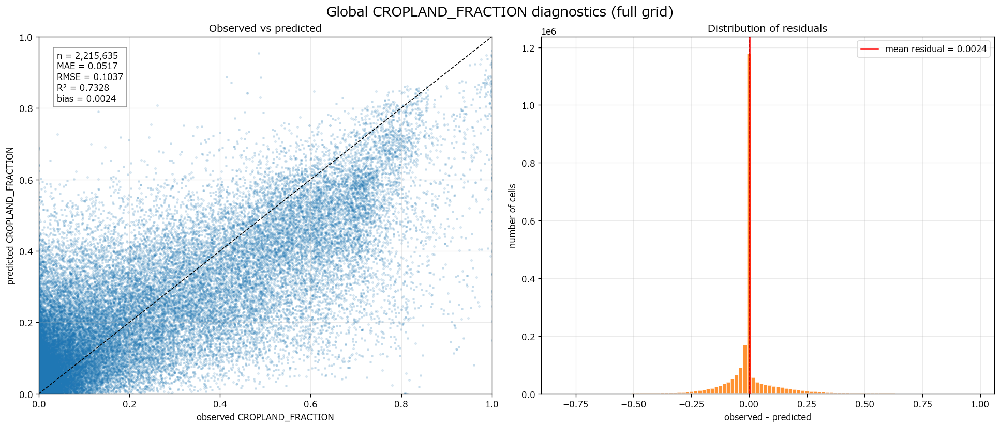

=== Global full-grid metrics ===
      n  observed_mean  predicted_mean    mae   rmse     r2  bias_observed_minus_predicted
2215635         0.1026          0.1002 0.0517 0.1037 0.7328                         0.0024


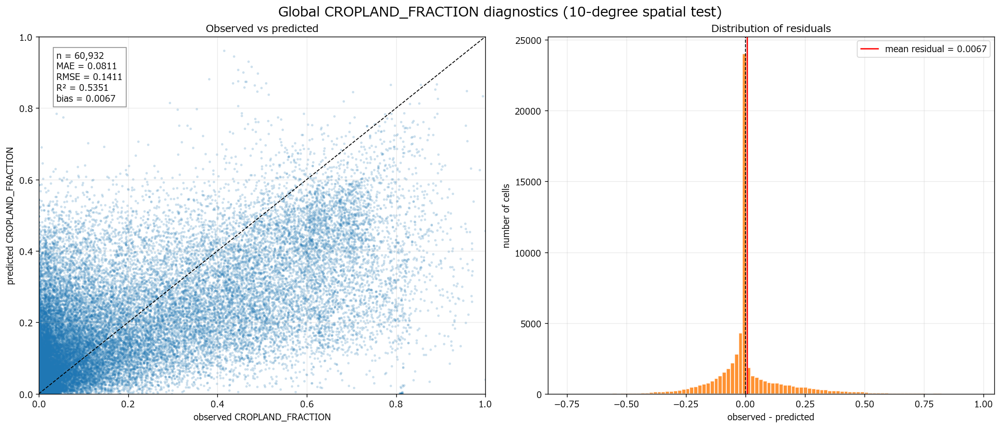


=== Global spatial-test metrics ===
    n  observed_mean  predicted_mean    mae   rmse     r2  bias_observed_minus_predicted
60932         0.1238          0.1171 0.0811 0.1411 0.5351                         0.0067

指標の保存先: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\global_diagnostics\global_cropland_fraction_diagnostics_metrics.csv
図の保存先: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\global_diagnostics


In [27]:
# ============================================================
# 全球版：観測CROPLAND_FRACTION vs 予測値
# ============================================================

from pathlib import Path
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
)


# ------------------------------------------------------------
# パス
# ------------------------------------------------------------

ROOT = Path(r"C:\masterresearch\Comparative_advantage")
GAEZ_DIR = ROOT / "GAEZ"
HYDE_DIR = ROOT / "HYDE3.4"
CROPLAND_DIR = HYDE_DIR / "cropland_npys"
PRED_DIR = GAEZ_DIR / "CroplandRegression" / "predictions"

OUTPUT_DIR = (
    GAEZ_DIR
    / "CroplandRegression"
    / "global_diagnostics"
)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)


# ------------------------------------------------------------
# 基本データ
# ------------------------------------------------------------

if "cropland_2024" not in globals():
    cropland_raw = np.load(
        CROPLAND_DIR / "cropland_fraction_1950_2024.npy",
        mmap_mode="r",
    )
    cropland_years = np.load(
        CROPLAND_DIR / "years.npy",
    )
    year_index = int(
        np.where(cropland_years == 2024)[0][0]
    )
    cropland_2024 = np.asarray(
        cropland_raw[year_index],
        dtype=np.float32,
    )

if "pred_fraction_expected" not in globals():
    pred_fraction_expected = np.load(
        PRED_DIR
        / "cropland_fraction_expected_lgbm_2024.npy",
        mmap_mode="r",
    )


# ------------------------------------------------------------
# 指標計算・図作成関数
# ------------------------------------------------------------

def make_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    valid = (
        np.isfinite(y_true)
        & np.isfinite(y_pred)
    )

    y_true = y_true[valid]
    y_pred = y_pred[valid]

    residual = y_true - y_pred

    return {
        "n": int(len(y_true)),
        "observed_mean": float(y_true.mean()),
        "predicted_mean": float(y_pred.mean()),
        "mae": float(
            mean_absolute_error(y_true, y_pred)
        ),
        "rmse": float(
            math.sqrt(
                mean_squared_error(y_true, y_pred)
            )
        ),
        "r2": float(
            r2_score(y_true, y_pred)
        ),
        "bias_observed_minus_predicted": float(
            residual.mean()
        ),
    }


def plot_diagnostics(
    y_true,
    y_pred,
    title,
    output_path,
    max_scatter_points=100_000,
):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    valid = (
        np.isfinite(y_true)
        & np.isfinite(y_pred)
    )

    y_true = y_true[valid]
    y_pred = y_pred[valid]

    residual = y_true - y_pred

    metrics = make_metrics(y_true, y_pred)

    # 全球フルグリッドは点が多いので散布図だけ抽出
    rng = np.random.default_rng(42)

    if len(y_true) > max_scatter_points:
        scatter_index = rng.choice(
            len(y_true),
            size=max_scatter_points,
            replace=False,
        )
    else:
        scatter_index = np.arange(len(y_true))

    scatter_true = y_true[scatter_index]
    scatter_pred = y_pred[scatter_index]

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(16, 6.8),
        constrained_layout=True,
    )

    # --------------------------------------------------------
    # 左：観測値と予測値
    # --------------------------------------------------------

    axes[0].scatter(
        scatter_true,
        scatter_pred,
        s=4,
        alpha=0.15,
        color="tab:blue",
        rasterized=True,
    )

    axes[0].plot(
        [0, 1],
        [0, 1],
        color="black",
        linestyle="--",
        linewidth=1,
    )

    axes[0].set_xlim(0, 1)
    axes[0].set_ylim(0, 1)

    axes[0].set_xlabel(
        "observed CROPLAND_FRACTION"
    )
    axes[0].set_ylabel(
        "predicted CROPLAND_FRACTION"
    )
    axes[0].set_title("Observed vs predicted")
    axes[0].grid(alpha=0.25)

    metrics_text = (
        f"n = {metrics['n']:,}\n"
        f"MAE = {metrics['mae']:.4f}\n"
        f"RMSE = {metrics['rmse']:.4f}\n"
        f"R² = {metrics['r2']:.4f}\n"
        f"bias = {metrics['bias_observed_minus_predicted']:.4f}"
    )

    axes[0].text(
        0.04,
        0.96,
        metrics_text,
        transform=axes[0].transAxes,
        va="top",
        ha="left",
        bbox=dict(
            facecolor="white",
            alpha=0.85,
            edgecolor="gray",
        ),
    )

    # --------------------------------------------------------
    # 右：残差分布
    # --------------------------------------------------------

    axes[1].hist(
        residual,
        bins=100,
        color="tab:orange",
        alpha=0.85,
        edgecolor="white",
    )

    axes[1].axvline(
        0,
        color="black",
        linestyle="--",
        linewidth=1,
    )

    axes[1].axvline(
        metrics["bias_observed_minus_predicted"],
        color="red",
        linewidth=1.5,
        label=(
            "mean residual = "
            f"{metrics['bias_observed_minus_predicted']:.4f}"
        ),
    )

    axes[1].set_xlabel(
        "observed - predicted"
    )
    axes[1].set_ylabel("number of cells")
    axes[1].set_title("Distribution of residuals")
    axes[1].grid(alpha=0.25)
    axes[1].legend()

    fig.suptitle(
        title,
        fontsize=16,
    )

    fig.savefig(
        output_path,
        dpi=220,
        bbox_inches="tight",
    )

    plt.show()

    return metrics


# ------------------------------------------------------------
# 1. 全球フルグリッド版
# ------------------------------------------------------------

# これは日本で作った図と同じ種類の評価
# pred_fraction_expectedはフルグリッド用の予測値
global_full_metrics = plot_diagnostics(
    y_true=np.asarray(cropland_2024),
    y_pred=np.asarray(pred_fraction_expected),
    title=(
        "Global CROPLAND_FRACTION diagnostics "
        "(full grid)"
    ),
    output_path=(
        OUTPUT_DIR
        / "global_cropland_fraction_full_grid_diagnostics.png"
    ),
)

print("=== Global full-grid metrics ===")
print(
    pd.DataFrame([global_full_metrics])
    .round(4)
    .to_string(index=False)
)


# ------------------------------------------------------------
# 2. 全球空間テスト版
# ------------------------------------------------------------

# こちらは世界全体の空間テスト評価と同じ定義
# 日本のフルグリッド結果とは直接比較しない
if all(
    name in globals()
    for name in ["test", "proba_test", "reg", "feature_cols"]
):
    global_test_prediction = (
        np.asarray(proba_test, dtype=float)
        * np.clip(
            reg.predict(test[feature_cols]),
            0,
            1,
        )
    )

    global_test_metrics = plot_diagnostics(
        y_true=test["cropland_fraction"].to_numpy(
            dtype=float
        ),
        y_pred=global_test_prediction,
        title=(
            "Global CROPLAND_FRACTION diagnostics "
            "(10-degree spatial test)"
        ),
        output_path=(
            OUTPUT_DIR
            / "global_cropland_fraction_spatial_test_diagnostics.png"
        ),
    )

    print("\n=== Global spatial-test metrics ===")
    print(
        pd.DataFrame([global_test_metrics])
        .round(4)
        .to_string(index=False)
    )

    all_metrics = pd.DataFrame(
        [
            {
                "evaluation": "global_full_grid",
                **global_full_metrics,
            },
            {
                "evaluation": "global_10_degree_spatial_test",
                **global_test_metrics,
            },
        ]
    )

else:
    print(
        "\ntest / proba_test / reg / feature_cols がないため、"
        "空間テスト版は作成しません。"
    )

    all_metrics = pd.DataFrame(
        [
            {
                "evaluation": "global_full_grid",
                **global_full_metrics,
            }
        ]
    )


# ------------------------------------------------------------
# 指標を保存
# ------------------------------------------------------------

metrics_path = (
    OUTPUT_DIR
    / "global_cropland_fraction_diagnostics_metrics.csv"
)

all_metrics.to_csv(
    metrics_path,
    index=False,
    encoding="utf-8-sig",
)

print("\n指標の保存先:", metrics_path)
print("図の保存先:", OUTPUT_DIR)

## 23 分割を何度か繰り返して学習→予測やってみる（OOFprediction）以下からはLightGBM使うならばＯＯＦの結果を標準とする！

全球 land-cell presence rate: 0.3659
positive population cells: 810,686
zero population cells:     1,404,949
positive sample cells:     120,000
zero sample cells:         120,000

FOLD 1/5
train rows: 192,000
test rows:  48,000
test blocks: 58
presence AUC: 0.9637
combined R2: 0.6976

FOLD 2/5
train rows: 191,999
test rows:  48,001
test blocks: 59
presence AUC: 0.9572
combined R2: 0.6038

FOLD 3/5
train rows: 192,000
test rows:  48,000
test blocks: 58
presence AUC: 0.9592
combined R2: 0.5651

FOLD 4/5
train rows: 192,000
test rows:  48,000
test blocks: 58
presence AUC: 0.9718
combined R2: 0.6468

FOLD 5/5
train rows: 192,001
test rows:  47,999
test blocks: 58
presence AUC: 0.9517
combined R2: 0.5764

GLOBAL 5-FOLD SPATIAL OOF RESULTS
                       target            prediction_type          weighting      n    auc  average_precision  accuracy  balanced_accuracy  precision  recall     f1  observed_mean  predicted_mean    mae   rmse     r2  bias_observed_minus_predicted
           

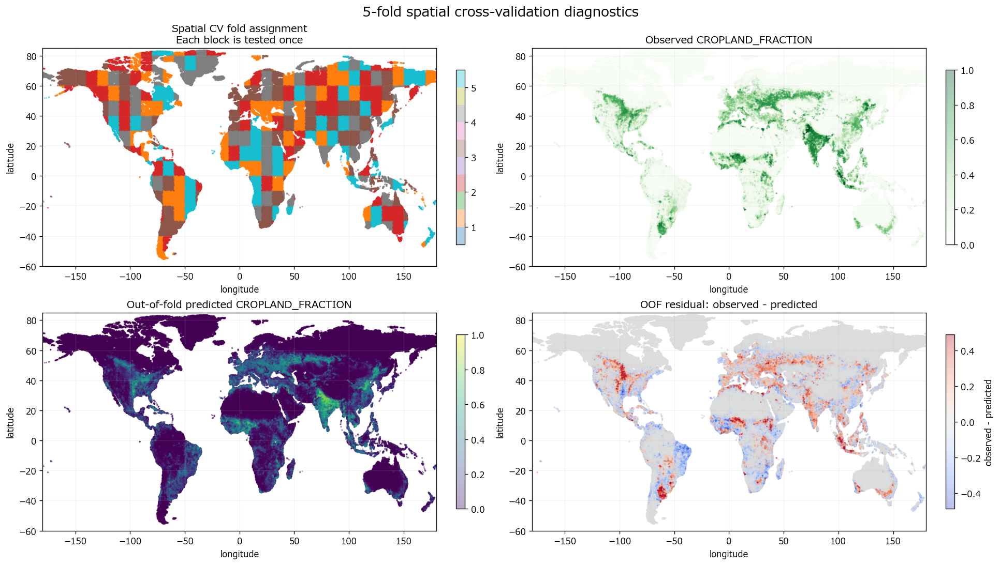


保存先:
C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\spatial_cv_5fold\spatial_5fold_oof_predictions.csv
C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\spatial_cv_5fold\spatial_5fold_global_metrics.csv
C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\spatial_cv_5fold\spatial_5fold_fold_metrics.csv
C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\spatial_cv_5fold\spatial_5fold_oof_diagnostics.png


In [28]:
# ============================================================
# 5-fold spatial cross-validation
# 10度空間ブロックを5分割し、各ブロックを一度ずつテストする
# ============================================================

from sklearn.model_selection import GroupKFold
from sklearn.metrics import (
    roc_auc_score,
    average_precision_score,
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    mean_absolute_error,
    mean_squared_error,
    r2_score,
)
from lightgbm import LGBMClassifier, LGBMRegressor

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import math


# ------------------------------------------------------------
# 保存先
# ------------------------------------------------------------

SPATIAL_CV_DIR = (
    GAEZ_DIR
    / "CroplandRegression"
    / "spatial_cv_5fold"
)
SPATIAL_CV_DIR.mkdir(parents=True, exist_ok=True)


# ------------------------------------------------------------
# データ確認
# ------------------------------------------------------------

required_objects = [
    "sample",
    "feature_cols",
    "land_mask",
    "presence",
]

missing_objects = [
    name for name in required_objects
    if name not in globals()
]

if missing_objects:
    raise RuntimeError(
        f"以下の変数がありません: {missing_objects}\n"
        "セル1〜7を先に実行してください。"
    )


cv_sample = sample.reset_index(drop=True).copy()

n_rows = len(cv_sample)
groups = cv_sample["spatial_block"].to_numpy()
y_all = cv_sample["presence"].to_numpy(dtype=np.uint8)


# ------------------------------------------------------------
# 全球の実際の農地あり比率
# ------------------------------------------------------------

global_land_mask = np.asarray(land_mask, dtype=bool)
global_presence = np.asarray(presence, dtype=bool)

target_prior = float(
    global_presence.sum() / global_land_mask.sum()
)

print(f"全球 land-cell presence rate: {target_prior:.4f}")


# ------------------------------------------------------------
# セル面積
# ------------------------------------------------------------

if "cell_area_km2" not in globals():
    cell_area_km2 = np.load(
        CROPLAND_DIR / "grid_area_km2.npy",
        mmap_mode="r",
    )

sample_rows = cv_sample["row"].to_numpy(dtype=int)
sample_cols = cv_sample["col"].to_numpy(dtype=int)

sample_area_km2 = np.asarray(
    cell_area_km2[sample_rows, sample_cols],
    dtype=float,
)


# ------------------------------------------------------------
# サンプリング補正用ウェイト
#
# 現在のsampleは農地あり・なしをほぼ同数抽出しているため、
# 全球平均を推定するときは、クラス別の抽出率を補正する。
# ------------------------------------------------------------

n_pos_population = int(global_presence.sum())
n_zero_population = int(global_land_mask.sum() - n_pos_population)

n_pos_sample = int((y_all == 1).sum())
n_zero_sample = int((y_all == 0).sum())

class_population_weight = np.where(
    y_all == 1,
    n_pos_population / n_pos_sample,
    n_zero_population / n_zero_sample,
).astype(float)

area_population_weight = (
    class_population_weight * sample_area_km2
)

print(f"positive population cells: {n_pos_population:,}")
print(f"zero population cells:     {n_zero_population:,}")
print(f"positive sample cells:     {n_pos_sample:,}")
print(f"zero sample cells:         {n_zero_sample:,}")


# ------------------------------------------------------------
# 確率の事前分布補正
# ------------------------------------------------------------

def adjust_probability_prior_shift_cv(
    probability,
    sample_prior,
    target_prior,
    eps=1e-6,
):
    probability = np.clip(
        np.asarray(probability, dtype=float),
        eps,
        1 - eps,
    )

    sample_prior = float(
        np.clip(sample_prior, eps, 1 - eps)
    )

    target_prior = float(
        np.clip(target_prior, eps, 1 - eps)
    )

    odds = probability / (1 - probability)

    odds *= (
        target_prior / (1 - target_prior)
    ) / (
        sample_prior / (1 - sample_prior)
    )

    return odds / (1 + odds)


# ------------------------------------------------------------
# 評価用関数
# ------------------------------------------------------------

def regression_summary_cv(
    y_true,
    y_pred,
    weights=None,
):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    valid = (
        np.isfinite(y_true)
        & np.isfinite(y_pred)
    )

    y_true = y_true[valid]
    y_pred = y_pred[valid]

    if weights is None:
        weights = np.ones(len(y_true), dtype=float)
    else:
        weights = np.asarray(weights, dtype=float)[valid]

    observed_mean = np.average(
        y_true,
        weights=weights,
    )

    predicted_mean = np.average(
        y_pred,
        weights=weights,
    )

    residual = y_true - y_pred

    mae = np.average(
        np.abs(residual),
        weights=weights,
    )

    rmse = np.sqrt(
        np.average(
            residual ** 2,
            weights=weights,
        )
    )

    ss_res = np.sum(
        weights * residual ** 2
    )

    ss_tot = np.sum(
        weights * (y_true - observed_mean) ** 2
    )

    r2 = (
        1 - ss_res / ss_tot
        if ss_tot > 0
        else np.nan
    )

    return {
        "n": int(len(y_true)),
        "observed_mean": float(observed_mean),
        "predicted_mean": float(predicted_mean),
        "mae": float(mae),
        "rmse": float(rmse),
        "r2": float(r2),
        "bias_observed_minus_predicted": float(
            np.average(residual, weights=weights)
        ),
    }


def classification_summary_cv(
    y_true,
    probability,
    weights=None,
):
    y_true = np.asarray(y_true, dtype=np.uint8)
    probability = np.asarray(
        probability,
        dtype=float,
    )

    valid = (
        np.isfinite(y_true)
        & np.isfinite(probability)
    )

    y_true = y_true[valid]
    probability = probability[valid]

    if weights is None:
        weights = np.ones(len(y_true), dtype=float)
    else:
        weights = np.asarray(weights, dtype=float)[valid]

    predicted = (
        probability >= 0.5
    ).astype(np.uint8)

    return {
        "n": int(len(y_true)),
        "auc": float(
            roc_auc_score(
                y_true,
                probability,
                sample_weight=weights,
            )
        ),
        "average_precision": float(
            average_precision_score(
                y_true,
                probability,
                sample_weight=weights,
            )
        ),
        "accuracy": float(
            accuracy_score(
                y_true,
                predicted,
                sample_weight=weights,
            )
        ),
        "balanced_accuracy": float(
            balanced_accuracy_score(
                y_true,
                predicted,
                sample_weight=weights,
            )
        ),
        "precision": float(
            precision_score(
                y_true,
                predicted,
                sample_weight=weights,
                zero_division=0,
            )
        ),
        "recall": float(
            recall_score(
                y_true,
                predicted,
                sample_weight=weights,
                zero_division=0,
            )
        ),
        "f1": float(
            f1_score(
                y_true,
                predicted,
                sample_weight=weights,
                zero_division=0,
            )
        ),
    }


# ------------------------------------------------------------
# OOF予測用の配列
# ------------------------------------------------------------

oof_fold = np.full(
    n_rows,
    -1,
    dtype=np.int16,
)

oof_presence_raw = np.full(
    n_rows,
    np.nan,
    dtype=np.float32,
)

oof_presence_calibrated = np.full(
    n_rows,
    np.nan,
    dtype=np.float32,
)

oof_fraction_positive = np.full(
    n_rows,
    np.nan,
    dtype=np.float32,
)

oof_fraction_expected = np.full(
    n_rows,
    np.nan,
    dtype=np.float32,
)


# ------------------------------------------------------------
# 5分割の空間交差検証
# ------------------------------------------------------------

N_SPLITS = 5

gkf = GroupKFold(
    n_splits=N_SPLITS
)

fold_results = []

for fold_number, (train_idx_cv, test_idx_cv) in enumerate(
    gkf.split(
        cv_sample,
        y_all,
        groups=groups,
    ),
    start=1,
):
    print()
    print("=" * 70)
    print(f"FOLD {fold_number}/{N_SPLITS}")
    print("=" * 70)

    train_cv = cv_sample.iloc[
        train_idx_cv
    ].copy()

    test_cv = cv_sample.iloc[
        test_idx_cv
    ].copy()

    oof_fold[test_idx_cv] = fold_number

    # --------------------------------------------------------
    # Stage 1: 農地があるか
    # --------------------------------------------------------

    clf_cv = LGBMClassifier(
        objective="binary",
        n_estimators=450,
        learning_rate=0.035,
        num_leaves=31,
        min_child_samples=80,
        subsample=0.85,
        colsample_bytree=0.85,
        random_state=RANDOM_SEED + fold_number,
        n_jobs=4,
        verbose=-1,
    )

    clf_cv.fit(
        train_cv[feature_cols],
        train_cv["presence"],
        categorical_feature=[
            "exclusion_class"
        ],
    )

    raw_probability = clf_cv.predict_proba(
        test_cv[feature_cols]
    )[:, 1]

    train_prior = float(
        train_cv["presence"].mean()
    )

    calibrated_probability = (
        adjust_probability_prior_shift_cv(
            raw_probability,
            sample_prior=train_prior,
            target_prior=target_prior,
        )
    )

    # --------------------------------------------------------
    # Stage 2: 農地ありセルの割合
    # --------------------------------------------------------

    positive_train_cv = train_cv[
        train_cv["presence"].eq(1)
    ].copy()

    reg_cv = LGBMRegressor(
        objective="regression",
        n_estimators=550,
        learning_rate=0.03,
        num_leaves=31,
        min_child_samples=60,
        subsample=0.85,
        colsample_bytree=0.85,
        random_state=RANDOM_SEED + fold_number,
        n_jobs=4,
        verbose=-1,
    )

    reg_cv.fit(
        positive_train_cv[feature_cols],
        positive_train_cv[
            "cropland_fraction"
        ],
        categorical_feature=[
            "exclusion_class"
        ],
    )

    conditional_prediction = np.clip(
        reg_cv.predict(
            test_cv[feature_cols]
        ),
        0,
        1,
    )

    # 二段階を統合
    expected_prediction = (
        calibrated_probability
        * conditional_prediction
    )

    oof_presence_raw[test_idx_cv] = (
        raw_probability
    )

    oof_presence_calibrated[test_idx_cv] = (
        calibrated_probability
    )

    oof_fraction_positive[test_idx_cv] = (
        conditional_prediction
    )

    oof_fraction_expected[test_idx_cv] = (
        expected_prediction
    )

    # --------------------------------------------------------
    # Foldごとの評価
    # --------------------------------------------------------

    y_test_cv = test_cv[
        "presence"
    ].to_numpy(dtype=np.uint8)

    y_fraction_cv = test_cv[
        "cropland_fraction"
    ].to_numpy(dtype=float)

    positive_mask_cv = (
        y_test_cv == 1
    )

    presence_metrics_cv = (
        classification_summary_cv(
            y_test_cv,
            raw_probability,
        )
    )

    combined_metrics_cv = (
        regression_summary_cv(
            y_fraction_cv,
            expected_prediction,
        )
    )

    conditional_metrics_cv = (
        regression_summary_cv(
            y_fraction_cv[positive_mask_cv],
            conditional_prediction[
                positive_mask_cv
            ],
        )
    )

    fold_results.append({
        "fold": fold_number,
        "train_rows": len(train_cv),
        "test_rows": len(test_cv),
        "train_blocks": train_cv[
            "spatial_block"
        ].nunique(),
        "test_blocks": test_cv[
            "spatial_block"
        ].nunique(),
        "presence_auc": presence_metrics_cv[
            "auc"
        ],
        "presence_average_precision": (
            presence_metrics_cv[
                "average_precision"
            ]
        ),
        "combined_mae": combined_metrics_cv[
            "mae"
        ],
        "combined_rmse": combined_metrics_cv[
            "rmse"
        ],
        "combined_r2": combined_metrics_cv[
            "r2"
        ],
        "conditional_mae": conditional_metrics_cv[
            "mae"
        ],
        "conditional_rmse": conditional_metrics_cv[
            "rmse"
        ],
        "conditional_r2": conditional_metrics_cv[
            "r2"
        ],
    })

    print(
        f"train rows: {len(train_cv):,}"
    )

    print(
        f"test rows:  {len(test_cv):,}"
    )

    print(
        f"test blocks: {test_cv['spatial_block'].nunique():,}"
    )

    print(
        f"presence AUC: "
        f"{presence_metrics_cv['auc']:.4f}"
    )

    print(
        f"combined R2: "
        f"{combined_metrics_cv['r2']:.4f}"
    )


# ------------------------------------------------------------
# OOF予測の確認
# ------------------------------------------------------------

if np.any(oof_fold < 0):
    raise RuntimeError(
        "OOF予測されていないセルがあります。"
    )

if np.any(~np.isfinite(oof_fraction_expected)):
    raise RuntimeError(
        "OOFの二段階予測にNaNがあります。"
    )


oof_table = cv_sample[
    [
        "row",
        "col",
        "lat",
        "lon",
        "spatial_block",
        "presence",
        "cropland_fraction",
    ]
].copy()

oof_table["cv_fold"] = oof_fold
oof_table["presence_probability_raw"] = (
    oof_presence_raw
)
oof_table["presence_probability_calibrated"] = (
    oof_presence_calibrated
)
oof_table["fraction_positive_conditional"] = (
    oof_fraction_positive
)
oof_table["fraction_expected_oof"] = (
    oof_fraction_expected
)
oof_table["residual_observed_minus_predicted"] = (
    oof_table["cropland_fraction"]
    - oof_table["fraction_expected_oof"]
)
oof_table["absolute_error"] = np.abs(
    oof_table[
        "residual_observed_minus_predicted"
    ]
)


# ------------------------------------------------------------
# 全球OOF評価
# ------------------------------------------------------------

weight_specs = {
    "unweighted_sample": None,
    "global_cell_weight": class_population_weight,
    "global_area_weight": area_population_weight,
}

global_metrics = []

# Presence
for weight_name, weights in weight_specs.items():

    # raw probabilityでの分類
    presence_metrics_raw = (
        classification_summary_cv(
            y_all,
            oof_presence_raw,
            weights=weights,
        )
    )

    global_metrics.append({
        "target": "presence",
        "prediction_type": "raw_probability",
        "weighting": weight_name,
        **presence_metrics_raw,
    })

    # 全球の実際の農地比率に補正した確率での分類
    presence_metrics_calibrated = (
        classification_summary_cv(
            y_all,
            oof_presence_calibrated,
            weights=weights,
        )
    )

    global_metrics.append({
        "target": "presence",
        "prediction_type": "calibrated_probability",
        "weighting": weight_name,
        **presence_metrics_calibrated,
    })


# Conditional fraction
positive_mask_all = (
    y_all == 1
)

for weight_name, weights in weight_specs.items():

    if weights is None:
        selected_weights = None
    else:
        selected_weights = weights[
            positive_mask_all
        ]

    conditional_metrics = (
        regression_summary_cv(
            cv_sample.loc[
                positive_mask_all,
                "cropland_fraction"
            ].to_numpy(dtype=float),
            oof_fraction_positive[
                positive_mask_all
            ],
            weights=selected_weights,
        )
    )

    global_metrics.append({
        "target": "positive_conditional_fraction",
        "prediction_type": "oof_conditional_regression",
        "weighting": weight_name,
        **conditional_metrics,
    })


# Combined two-stage fraction
for weight_name, weights in weight_specs.items():

    combined_metrics = (
        regression_summary_cv(
            cv_sample[
                "cropland_fraction"
            ].to_numpy(dtype=float),
            oof_fraction_expected,
            weights=weights,
        )
    )

    global_metrics.append({
        "target": "combined_two_stage_fraction",
        "prediction_type": "oof_expected_fraction",
        "weighting": weight_name,
        **combined_metrics,
    })


global_metrics_df = pd.DataFrame(
    global_metrics
)

fold_metrics_df = pd.DataFrame(
    fold_results
)


# ------------------------------------------------------------
# 結果表示
# ------------------------------------------------------------

print()
print("=" * 70)
print("GLOBAL 5-FOLD SPATIAL OOF RESULTS")
print("=" * 70)

print(
    global_metrics_df.round(4).to_string(
        index=False
    )
)

print()
print("=" * 70)
print("FOLD-BY-FOLD RESULTS")
print("=" * 70)

print(
    fold_metrics_df.round(4).to_string(
        index=False
    )
)


# ------------------------------------------------------------
# 保存
# ------------------------------------------------------------

oof_path = (
    SPATIAL_CV_DIR
    / "spatial_5fold_oof_predictions.csv"
)

metrics_path = (
    SPATIAL_CV_DIR
    / "spatial_5fold_global_metrics.csv"
)

fold_metrics_path = (
    SPATIAL_CV_DIR
    / "spatial_5fold_fold_metrics.csv"
)

oof_table.to_csv(
    oof_path,
    index=False,
    encoding="utf-8-sig",
)

global_metrics_df.to_csv(
    metrics_path,
    index=False,
    encoding="utf-8-sig",
)

fold_metrics_df.to_csv(
    fold_metrics_path,
    index=False,
    encoding="utf-8-sig",
)


# ------------------------------------------------------------
# OOF予測の全球可視化
# ------------------------------------------------------------

plot_df = oof_table

residual_values = plot_df[
    "residual_observed_minus_predicted"
].to_numpy(dtype=float)

residual_limit = float(
    np.nanpercentile(
        np.abs(residual_values),
        99,
    )
)

residual_limit = max(
    residual_limit,
    0.01,
)

fig, axes = plt.subplots(
    2,
    2,
    figsize=(16, 9),
    constrained_layout=True,
)


def setup_global_axis(ax, title):
    ax.set_title(title)
    ax.set_xlim(-180, 180)
    ax.set_ylim(-60, 85)
    ax.set_xlabel("longitude")
    ax.set_ylabel("latitude")
    ax.grid(alpha=0.15)


# 1. 各セルがどのfoldのテストになったか
scatter = axes[0, 0].scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df["cv_fold"],
    s=1,
    alpha=0.35,
    cmap="tab10",
    vmin=0.5,
    vmax=N_SPLITS + 0.5,
    rasterized=True,
)

setup_global_axis(
    axes[0, 0],
    "Spatial CV fold assignment\n"
    "Each block is tested once",
)

colorbar = fig.colorbar(
    scatter,
    ax=axes[0, 0],
    shrink=0.8,
)

colorbar.set_ticks(
    np.arange(1, N_SPLITS + 1)
)

# 2. 観測値
scatter = axes[0, 1].scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df["cropland_fraction"],
    s=1,
    alpha=0.35,
    cmap="Greens",
    vmin=0,
    vmax=1,
    rasterized=True,
)

setup_global_axis(
    axes[0, 1],
    "Observed CROPLAND_FRACTION",
)

fig.colorbar(
    scatter,
    ax=axes[0, 1],
    shrink=0.8,
)

# 3. OOF予測値
scatter = axes[1, 0].scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df["fraction_expected_oof"],
    s=1,
    alpha=0.35,
    cmap="viridis",
    vmin=0,
    vmax=1,
    rasterized=True,
)

setup_global_axis(
    axes[1, 0],
    "Out-of-fold predicted CROPLAND_FRACTION",
)

fig.colorbar(
    scatter,
    ax=axes[1, 0],
    shrink=0.8,
)

# 4. 残差
scatter = axes[1, 1].scatter(
    plot_df["lon"],
    plot_df["lat"],
    c=plot_df[
        "residual_observed_minus_predicted"
    ],
    s=1,
    alpha=0.35,
    cmap="coolwarm",
    vmin=-residual_limit,
    vmax=residual_limit,
    rasterized=True,
)

setup_global_axis(
    axes[1, 1],
    "OOF residual: observed - predicted",
)

fig.colorbar(
    scatter,
    ax=axes[1, 1],
    shrink=0.8,
    label="observed - predicted",
)

fig.suptitle(
    "5-fold spatial cross-validation diagnostics",
    fontsize=16,
)

figure_path = (
    SPATIAL_CV_DIR
    / "spatial_5fold_oof_diagnostics.png"
)

fig.savefig(
    figure_path,
    dpi=220,
    bbox_inches="tight",
)

plt.show()

print()
print("保存先:")
print(oof_path)
print(metrics_path)
print(fold_metrics_path)
print(figure_path)

## 24 SHAP分析

c:\Users\tsuda\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



OOF SHAP FOLD 1/5


Background dataset has 500 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=500 when initializing the masker.
100%|===================| 24569/24577 [09:28<00:00]        

Stage 1 SHAP rows: 48000
Stage 2 SHAP rows: 24577

OOF SHAP FOLD 2/5


Background dataset has 500 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=500 when initializing the masker.
100%|===================| 21588/21612 [07:17<00:00]        

Stage 1 SHAP rows: 48001
Stage 2 SHAP rows: 21612

OOF SHAP FOLD 3/5


Background dataset has 500 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=500 when initializing the masker.
100%|===================| 25788/25798 [07:14<00:00]        

Stage 1 SHAP rows: 48000
Stage 2 SHAP rows: 25798

OOF SHAP FOLD 4/5


Background dataset has 500 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=500 when initializing the masker.
100%|===================| 22926/22944 [06:02<00:00]        

Stage 1 SHAP rows: 48000
Stage 2 SHAP rows: 22944

OOF SHAP FOLD 5/5


Background dataset has 500 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=500 when initializing the masker.
100%|===================| 25056/25069 [07:02<00:00]        

Stage 1 SHAP rows: 47999
Stage 2 SHAP rows: 25069

Saved: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\spatial_cv_5fold\oof_shap\oof_group_shap_values.csv


,stage,group,mean_absolute_shap,mean_signed_shap,relative_importance_share
2,conditional_fraction,climate_potential,0.0795,-0.0034,0.2923
4,conditional_fraction,terrain_land_constraint,0.0783,0.0006,0.2879
1,conditional_fraction,population_labor,0.0529,0.0075,0.1946
0,conditional_fraction,market_access,0.0482,-0.0019,0.1774
3,conditional_fraction,water_access,0.0130,-0.0004,0.0478
7,presence,climate_potential,0.1595,-0.0239,0.3326
5,presence,market_access,0.1585,-0.0216,0.3306
6,presence,population_labor,0.1063,-0.0151,0.2216
9,presence,terrain_land_constraint,0.0307,-0.0035,0.0641
8,presence,water_access,0.0245,-0.0045,0.0511



Saved: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\spatial_cv_5fold\oof_shap\oof_group_shap_summary.csv


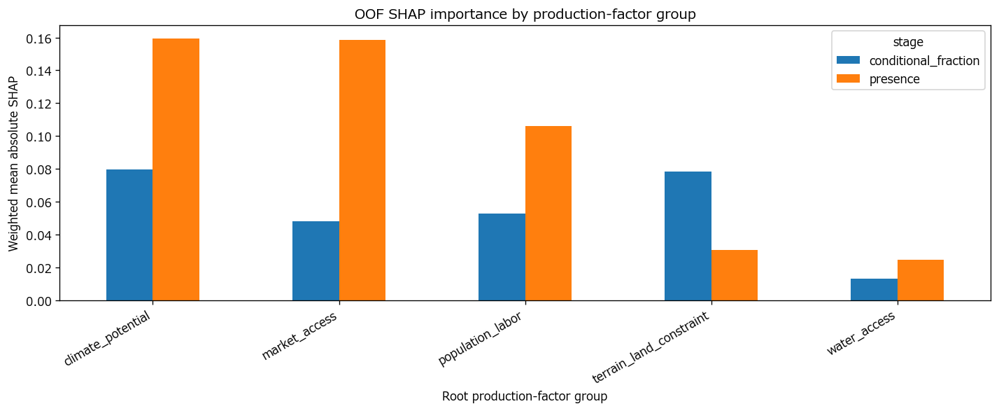

Saved: C:\masterresearch\Comparative_advantage\GAEZ\CroplandRegression\spatial_cv_5fold\oof_shap\oof_group_shap_importance.png


In [38]:
# ============================================================
# OOF SHAP analysis
# OOFセル49の後に実行
# ============================================================

import gc
from pathlib import Path

import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from lightgbm import LGBMClassifier, LGBMRegressor


# ------------------------------------------------------------
# 保存先
# ------------------------------------------------------------

SHAP_DIR = (
    SPATIAL_CV_DIR
    / "oof_shap"
)

SHAP_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


# ------------------------------------------------------------
# 設定
# ------------------------------------------------------------

# Noneなら各foldのテストデータ全体を使う
# メモリが厳しい場合は10000などに変更
SHAP_MAX_ROWS_PER_FOLD = None

SHAP_BACKGROUND_ROWS = 500


# ------------------------------------------------------------
# 根元的生産要素のグループ
# ------------------------------------------------------------

SHAP_FEATURE_GROUPS = {
    "market_access": [
        "log_city_time_20k_min",
        "log_port_time_any_min",
    ],

    "population_labor": [
        "log_pop_density_2024",
    ],

    "climate_potential": [
        "log_rainfed_value_top5",
        "log_rainfed_calorie_top5",
        "log_irrigation_value_gain_top5",
        "log_irrigation_calorie_gain_top5",
    ],

    "water_access": [
        "log_glofas_p10_2020",
        "log_distance_river_gt10_2020",
    ],

    "terrain_land_constraint": [
        "elevation_m",
        "slope",
        "exclusion_class",
    ],
}


# ------------------------------------------------------------
# データ確認
# ------------------------------------------------------------

required_objects = [
    "cv_sample",
    "feature_cols",
    "groups",
    "y_all",
    "target_prior",
    "area_population_weight",
    "adjust_probability_prior_shift_cv",
]

missing_objects = [
    name
    for name in required_objects
    if name not in globals()
]

if missing_objects:
    raise RuntimeError(
        f"以下の変数がありません: {missing_objects}\n"
        "先にOOFセルを実行してください。"
    )


# ------------------------------------------------------------
# SHAP値を2次元配列に統一
# ------------------------------------------------------------

def shap_array(
    model,
    X_explain,
    background,
    model_type,
):
    """
    model_type:
        classifier: probability scale
        regressor: raw prediction scale
    """

    if model_type == "classifier":
        output_type = "probability"
    else:
        output_type = "raw"

    try:
        explainer = shap.TreeExplainer(
            model,
            data=background,
            model_output=output_type,
        )

        values = explainer.shap_values(
            X_explain,
            check_additivity=False,
        )

    except Exception as error:
        print(
            "Probability-scale SHAP failed."
        )
        print(
            "Fallback to raw model output:",
            repr(error),
        )

        explainer = shap.TreeExplainer(
            model
        )

        values = explainer.shap_values(
            X_explain,
            check_additivity=False,
        )

    # classifierではlistになる場合がある
    if isinstance(values, list):
        if len(values) == 2:
            values = values[1]
        else:
            values = values[0]

    values = np.asarray(values)

    # 3次元配列の場合
    if values.ndim == 3:
        values = values[:, :, -1]

    if values.ndim != 2:
        raise ValueError(
            f"Unexpected SHAP shape: {values.shape}"
        )

    return values.astype(np.float32)


def choose_indices(
    indices,
    max_rows,
    random_state,
):
    indices = np.asarray(
        indices,
        dtype=int,
    )

    if (
        max_rows is None
        or len(indices) <= max_rows
    ):
        return indices

    rng = np.random.default_rng(
        random_state
    )

    return np.sort(
        rng.choice(
            indices,
            size=max_rows,
            replace=False,
        )
    )


def weighted_mean(values, weights):
    values = np.asarray(values, dtype=float)
    weights = np.asarray(weights, dtype=float)

    valid = (
        np.isfinite(values)
        & np.isfinite(weights)
        & (weights > 0)
    )

    if valid.sum() == 0:
        return np.nan

    return float(
        np.average(
            values[valid],
            weights=weights[valid],
        )
    )


# ------------------------------------------------------------
# SHAPをグループ単位に集約
# ------------------------------------------------------------

def build_group_shap_table(
    base_df,
    shap_values,
    weights,
    fold_number,
    stage_name,
):
    out = base_df[
        [
            "row",
            "col",
            "lat",
            "lon",
            "spatial_block",
        ]
    ].copy()

    out["cv_fold"] = fold_number
    out["stage"] = stage_name
    out["shap_weight"] = weights

    for group_name, group_features in (
        SHAP_FEATURE_GROUPS.items()
    ):
        valid_features = [
            feature
            for feature in group_features
            if feature in feature_cols
        ]

        if not valid_features:
            continue

        feature_indices = [
            feature_cols.index(feature)
            for feature in valid_features
        ]

        group_values = shap_values[
            :,
            feature_indices,
        ]

        # 符号付き寄与
        out[
            f"{group_name}__shap_signed"
        ] = group_values.sum(axis=1)

        # 寄与の大きさ
        out[
            f"{group_name}__shap_abs"
        ] = np.abs(group_values).sum(axis=1)

    return out


# ------------------------------------------------------------
# OOF SHAP
# ------------------------------------------------------------

oof_group_shap_rows = []

for fold_number, (
    train_idx_cv,
    test_idx_cv,
) in enumerate(
    gkf.split(
        cv_sample,
        y_all,
        groups=groups,
    ),
    start=1,
):

    print()
    print("=" * 70)
    print(
        f"OOF SHAP FOLD "
        f"{fold_number}/{N_SPLITS}"
    )
    print("=" * 70)

    train_cv = cv_sample.iloc[
        train_idx_cv
    ].copy()

    test_cv = cv_sample.iloc[
        test_idx_cv
    ].copy()

    # --------------------------------------------------------
    # Stage 1: cropland presence
    # --------------------------------------------------------

    clf_cv = LGBMClassifier(
        objective="binary",
        n_estimators=450,
        learning_rate=0.035,
        num_leaves=31,
        min_child_samples=80,
        subsample=0.85,
        colsample_bytree=0.85,
        random_state=RANDOM_SEED + fold_number,
        n_jobs=4,
        verbose=-1,
    )

    clf_cv.fit(
        train_cv[feature_cols],
        train_cv["presence"],
        categorical_feature=[
            "exclusion_class"
        ],
    )

    stage1_indices = choose_indices(
        test_idx_cv,
        SHAP_MAX_ROWS_PER_FOLD,
        RANDOM_SEED + fold_number * 10,
    )

    stage1_test = cv_sample.iloc[
        stage1_indices
    ].copy()

    background_stage1 = train_cv[
        feature_cols
    ].sample(
        n=min(
            SHAP_BACKGROUND_ROWS,
            len(train_cv),
        ),
        random_state=RANDOM_SEED + fold_number,
    )

    stage1_shap = shap_array(
        clf_cv,
        stage1_test[feature_cols],
        background_stage1,
        model_type="classifier",
    )

    stage1_weights = (
        area_population_weight[
            stage1_indices
        ]
    )

    stage1_group_shap = (
        build_group_shap_table(
            stage1_test,
            stage1_shap,
            stage1_weights,
            fold_number,
            "presence",
        )
    )

    oof_group_shap_rows.append(
        stage1_group_shap
    )

    # --------------------------------------------------------
    # Stage 2: positive-cell cropland fraction
    # --------------------------------------------------------

    positive_train_cv = train_cv[
        train_cv["presence"].eq(1)
    ].copy()

    reg_cv = LGBMRegressor(
        objective="regression",
        n_estimators=550,
        learning_rate=0.03,
        num_leaves=31,
        min_child_samples=60,
        subsample=0.85,
        colsample_bytree=0.85,
        random_state=RANDOM_SEED + fold_number,
        n_jobs=4,
        verbose=-1,
    )

    reg_cv.fit(
        positive_train_cv[feature_cols],
        positive_train_cv[
            "cropland_fraction"
        ],
        categorical_feature=[
            "exclusion_class"
        ],
    )

    positive_test_indices = test_idx_cv[
        y_all[test_idx_cv] == 1
    ]

    stage2_indices = choose_indices(
        positive_test_indices,
        SHAP_MAX_ROWS_PER_FOLD,
        RANDOM_SEED + fold_number * 100,
    )

    stage2_test = cv_sample.iloc[
        stage2_indices
    ].copy()

    background_stage2 = positive_train_cv[
        feature_cols
    ].sample(
        n=min(
            SHAP_BACKGROUND_ROWS,
            len(positive_train_cv),
        ),
        random_state=RANDOM_SEED + fold_number,
    )

    stage2_shap = shap_array(
        reg_cv,
        stage2_test[feature_cols],
        background_stage2,
        model_type="regressor",
    )

    stage2_weights = (
        area_population_weight[
            stage2_indices
        ]
    )

    stage2_group_shap = (
        build_group_shap_table(
            stage2_test,
            stage2_shap,
            stage2_weights,
            fold_number,
            "conditional_fraction",
        )
    )

    oof_group_shap_rows.append(
        stage2_group_shap
    )

    print(
        "Stage 1 SHAP rows:",
        len(stage1_test),
    )

    print(
        "Stage 2 SHAP rows:",
        len(stage2_test),
    )

    del (
        clf_cv,
        reg_cv,
        stage1_shap,
        stage2_shap,
    )

    gc.collect()


# ------------------------------------------------------------
# OOF SHAP結果を結合
# ------------------------------------------------------------

oof_group_shap = pd.concat(
    oof_group_shap_rows,
    ignore_index=True,
)

oof_group_shap_path = (
    SHAP_DIR
    / "oof_group_shap_values.csv"
)

oof_group_shap.to_csv(
    oof_group_shap_path,
    index=False,
    encoding="utf-8-sig",
)

print()
print(
    "Saved:",
    oof_group_shap_path,
)


# ------------------------------------------------------------
# グループ別の平均SHAP寄与
# ------------------------------------------------------------

summary_rows = []

for (
    stage_name,
    stage_df,
) in oof_group_shap.groupby(
    "stage"
):

    abs_columns = [
        column
        for column in stage_df.columns
        if column.endswith(
            "__shap_abs"
        )
    ]

    signed_columns = [
        column
        for column in stage_df.columns
        if column.endswith(
            "__shap_signed"
        )
    ]

    for abs_column in abs_columns:
        group_name = abs_column.replace(
            "__shap_abs",
            "",
        )

        signed_column = (
            f"{group_name}__shap_signed"
        )

        mean_abs = weighted_mean(
            stage_df[abs_column].to_numpy(),
            stage_df["shap_weight"].to_numpy(),
        )

        mean_signed = weighted_mean(
            stage_df[signed_column].to_numpy(),
            stage_df["shap_weight"].to_numpy(),
        )

        summary_rows.append({
            "stage": stage_name,
            "group": group_name,
            "mean_absolute_shap": mean_abs,
            "mean_signed_shap": mean_signed,
        })

shap_group_summary = pd.DataFrame(
    summary_rows
)

# Stage内の寄与割合
shap_group_summary[
    "relative_importance_share"
] = (
    shap_group_summary
    .groupby("stage")[
        "mean_absolute_shap"
    ]
    .transform(
        lambda x: x / x.sum()
    )
)

shap_group_summary = (
    shap_group_summary
    .sort_values(
        [
            "stage",
            "mean_absolute_shap",
        ],
        ascending=[True, False],
    )
)

summary_path = (
    SHAP_DIR
    / "oof_group_shap_summary.csv"
)

shap_group_summary.to_csv(
    summary_path,
    index=False,
    encoding="utf-8-sig",
)

display(
    shap_group_summary.round(4)
)

print()
print(
    "Saved:",
    summary_path,
)


# ------------------------------------------------------------
# グループ別の平均絶対SHAPを可視化
# ------------------------------------------------------------

plot_df = (
    shap_group_summary
    .pivot(
        index="group",
        columns="stage",
        values="mean_absolute_shap",
    )
    .fillna(0)
)

ax = plot_df.plot(
    kind="bar",
    figsize=(12, 5),
)

ax.set_ylabel(
    "Weighted mean absolute SHAP"
)

ax.set_xlabel(
    "Root production-factor group"
)

ax.set_title(
    "OOF SHAP importance by production-factor group"
)

plt.xticks(
    rotation=30,
    ha="right",
)

plt.tight_layout()

figure_path = (
    SHAP_DIR
    / "oof_group_shap_importance.png"
)

plt.savefig(
    figure_path,
    dpi=250,
    bbox_inches="tight",
)

plt.show()

print(
    "Saved:",
    figure_path,
)

## 25 各変数ごとにSHAP分析　

In [1]:
# ============================================================
# OOF SHAP: 各説明変数をグループ化せず、そのまま評価
# ============================================================

import gc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from lightgbm import LGBMClassifier, LGBMRegressor


# ------------------------------------------------------------
# 各変数のSHAPを保存する関数
# ------------------------------------------------------------

def build_feature_shap_table(
    base_df,
    shap_values,
    weights,
    fold_number,
    stage_name,
):
    """
    各説明変数について、
    signed SHAP と absolute SHAP をそのまま保存する。
    """

    out = base_df[
        [
            "row",
            "col",
            "lat",
            "lon",
            "spatial_block",
        ]
    ].copy()

    out["cv_fold"] = fold_number
    out["stage"] = stage_name
    out["shap_weight"] = weights

    for j, feature in enumerate(feature_cols):

        # 符号付きSHAP
        out[
            f"{feature}__shap_signed"
        ] = shap_values[:, j]

        # SHAPの絶対値
        out[
            f"{feature}__shap_abs"
        ] = np.abs(
            shap_values[:, j]
        )

    return out


# ------------------------------------------------------------
# OOF SHAP
# ------------------------------------------------------------

oof_feature_shap_rows = []

for fold_number, (
    train_idx_cv,
    test_idx_cv,
) in enumerate(
    gkf.split(
        cv_sample,
        y_all,
        groups=groups,
    ),
    start=1,
):

    print()
    print("=" * 70)
    print(
        f"OOF FEATURE SHAP FOLD "
        f"{fold_number}/{N_SPLITS}"
    )
    print("=" * 70)

    train_cv = cv_sample.iloc[
        train_idx_cv
    ].copy()

    test_cv = cv_sample.iloc[
        test_idx_cv
    ].copy()


    # ========================================================
    # Stage 1
    # cropland presence
    # ========================================================

    clf_cv = LGBMClassifier(
        objective="binary",
        n_estimators=450,
        learning_rate=0.035,
        num_leaves=31,
        min_child_samples=80,
        subsample=0.85,
        colsample_bytree=0.85,
        random_state=RANDOM_SEED + fold_number,
        n_jobs=4,
        verbose=-1,
    )

    clf_cv.fit(
        train_cv[feature_cols],
        train_cv["presence"],
        categorical_feature=[
            "exclusion_class"
        ],
    )


    # SHAPを計算するOOF testサンプル
    stage1_indices = choose_indices(
        test_idx_cv,
        SHAP_MAX_ROWS_PER_FOLD,
        RANDOM_SEED + fold_number * 10,
    )

    stage1_test = cv_sample.iloc[
        stage1_indices
    ].copy()


    # SHAP background sample
    background_stage1 = train_cv[
        feature_cols
    ].sample(
        n=min(
            SHAP_BACKGROUND_ROWS,
            len(train_cv),
        ),
        random_state=RANDOM_SEED + fold_number,
    )


    # SHAP
    stage1_shap = shap_array(
        clf_cv,
        stage1_test[feature_cols],
        background_stage1,
        model_type="classifier",
    )


    # 面積・サンプリング補正weight
    stage1_weights = (
        area_population_weight[
            stage1_indices
        ]
    )


    # 各変数をそのまま保存
    stage1_feature_shap = (
        build_feature_shap_table(
            stage1_test,
            stage1_shap,
            stage1_weights,
            fold_number,
            "presence",
        )
    )

    oof_feature_shap_rows.append(
        stage1_feature_shap
    )


    # ========================================================
    # Stage 2
    # conditional cropland fraction
    # ========================================================

    positive_train_cv = train_cv[
        train_cv["presence"].eq(1)
    ].copy()


    reg_cv = LGBMRegressor(
        objective="regression",
        n_estimators=550,
        learning_rate=0.03,
        num_leaves=31,
        min_child_samples=60,
        subsample=0.85,
        colsample_bytree=0.85,
        random_state=RANDOM_SEED + fold_number,
        n_jobs=4,
        verbose=-1,
    )

    reg_cv.fit(
        positive_train_cv[feature_cols],
        positive_train_cv[
            "cropland_fraction"
        ],
        categorical_feature=[
            "exclusion_class"
        ],
    )


    # test側でもpresence=1だけをStage 2の対象にする
    positive_test_indices = test_idx_cv[
        y_all[test_idx_cv] == 1
    ]


    stage2_indices = choose_indices(
        positive_test_indices,
        SHAP_MAX_ROWS_PER_FOLD,
        RANDOM_SEED + fold_number * 100,
    )


    stage2_test = cv_sample.iloc[
        stage2_indices
    ].copy()


    background_stage2 = positive_train_cv[
        feature_cols
    ].sample(
        n=min(
            SHAP_BACKGROUND_ROWS,
            len(positive_train_cv),
        ),
        random_state=RANDOM_SEED + fold_number,
    )


    stage2_shap = shap_array(
        reg_cv,
        stage2_test[feature_cols],
        background_stage2,
        model_type="regressor",
    )


    stage2_weights = (
        area_population_weight[
            stage2_indices
        ]
    )


    stage2_feature_shap = (
        build_feature_shap_table(
            stage2_test,
            stage2_shap,
            stage2_weights,
            fold_number,
            "conditional_fraction",
        )
    )

    oof_feature_shap_rows.append(
        stage2_feature_shap
    )


    print(
        "Stage 1 SHAP rows:",
        len(stage1_test),
    )

    print(
        "Stage 2 SHAP rows:",
        len(stage2_test),
    )


    del (
        clf_cv,
        reg_cv,
        stage1_shap,
        stage2_shap,
    )

    gc.collect()


# ============================================================
# 全foldを結合
# ============================================================

oof_feature_shap = pd.concat(
    oof_feature_shap_rows,
    ignore_index=True,
)


# 保存
oof_feature_shap_path = (
    SHAP_DIR
    / "oof_feature_shap_values.csv"
)

oof_feature_shap.to_csv(
    oof_feature_shap_path,
    index=False,
    encoding="utf-8-sig",
)

print()
print(
    "Saved:",
    oof_feature_shap_path,
)


# ============================================================
# 変数ごとの weighted mean absolute SHAP
# ============================================================

summary_rows = []

for (
    stage_name,
    stage_df,
) in oof_feature_shap.groupby(
    "stage"
):

    for feature in feature_cols:

        abs_column = (
            f"{feature}__shap_abs"
        )

        signed_column = (
            f"{feature}__shap_signed"
        )

        mean_abs = weighted_mean(
            stage_df[
                abs_column
            ].to_numpy(),
            stage_df[
                "shap_weight"
            ].to_numpy(),
        )

        mean_signed = weighted_mean(
            stage_df[
                signed_column
            ].to_numpy(),
            stage_df[
                "shap_weight"
            ].to_numpy(),
        )

        summary_rows.append({
            "stage": stage_name,
            "feature": feature,
            "mean_absolute_shap": mean_abs,
            "mean_signed_shap": mean_signed,
        })


shap_feature_summary = pd.DataFrame(
    summary_rows
)


# ------------------------------------------------------------
# Stage内での相対的重要度
# ------------------------------------------------------------

shap_feature_summary[
    "relative_importance_share"
] = (
    shap_feature_summary
    .groupby("stage")[
        "mean_absolute_shap"
    ]
    .transform(
        lambda x: x / x.sum()
    )
)


shap_feature_summary = (
    shap_feature_summary
    .sort_values(
        [
            "stage",
            "mean_absolute_shap",
        ],
        ascending=[
            True,
            False,
        ],
    )
)


# 保存
summary_path = (
    SHAP_DIR
    / "oof_feature_shap_summary.csv"
)

shap_feature_summary.to_csv(
    summary_path,
    index=False,
    encoding="utf-8-sig",
)


display(
    shap_feature_summary.round(5)
)

print()
print(
    "Saved:",
    summary_path,
)


# ============================================================
# 可視化
# ============================================================

plot_df = (
    shap_feature_summary
    .pivot(
        index="feature",
        columns="stage",
        values="mean_absolute_shap",
    )
    .fillna(0)
)


# ------------------------------------------------------------
# Stage 1とStage 2を合わせた重要度順に並べる
# ------------------------------------------------------------

plot_df[
    "total_importance"
] = (
    plot_df.sum(axis=1)
)

plot_df = (
    plot_df
    .sort_values(
        "total_importance",
        ascending=False,
    )
    .drop(
        columns="total_importance"
    )
)


# ------------------------------------------------------------
# 図
# ------------------------------------------------------------

ax = plot_df.plot(
    kind="bar",
    figsize=(15, 6),
)

ax.set_ylabel(
    "Weighted mean absolute SHAP"
)

ax.set_xlabel(
    "Feature"
)

ax.set_title(
    "OOF SHAP importance by individual feature"
)

plt.xticks(
    rotation=45,
    ha="right",
)

plt.tight_layout()


figure_path = (
    SHAP_DIR
    / "oof_feature_shap_importance.png"
)

plt.savefig(
    figure_path,
    dpi=250,
    bbox_inches="tight",
)

plt.show()

print(
    "Saved:",
    figure_path,
)

NameError: name 'gkf' is not defined